# Cars 4 You : Expedicting car predictions with ML
## Machine Learning Project – Notebook
**Master in Data Science and Advanced Analytics – Nova IMS**  

### GROUP 03 <br>
Afonso Maia - 20250464  <br>
Francisco Graça - 20250471<br>
Renato Scotto - 20250420 <br>
Rodrigo Gonçalves - 20250529

---


## Table of Contents <a id="cont"></a>

- [1. Import the dataset and explore the data](#1)
  - [1.1 Exploring the dataset](#1_1)
  - [1.2 Providing descriptive statistics](#1_2)
  - [1.3 correcting data inconsistencies for numerical variables](#1_3)
  - [1.4 correcting data inconsistencies for categorical variables](#1_4)
  - [1.5 Duplicates and missing values analysis](#1_5)

- [2. Data Visualization](#2)
  - [2.1 Univariate analysis](#2_1)
  - [2.1.1 Numerical features](#2_1_1)
  - [2.1.2 Categorical features](#2_1_2)
  - [2.2 Multivariate analysis](#2_2)
  - [2.2.1 Numerical vs Numerical](#2_2_1)
  - [2.2.2 Numerical vs Categorical](#2_2_2)
  - [2.2.3 Categorical vs Categorical](#2_2_3)
  - [2.2.4 Analysis with 3 variables](#2_2_4)

- [3. Pre-process the dataset](#3)
  - [3.1 Splitting the data](#3_1)
  - [3.2 Imputation](#3_2)
  - [3.3 Feature engineering](#3_3)
  - [3.4 Encoding](#3_4)
  - [3.4.1 Target encoding](#3_4_1)
  - [3.4.2 One-hot encoding](#3_4_2)
  - [3.4.3 Ordinal encoding](#3_4_3) 
  - [3.5 Scalling](#3_5)
  - [3.6 Pipeline with the previous methods](#3_6)
  
- [4. Feature Selection](#4)

- [5. Going to models](#5)


- [6. Open ended section](#6)
  - [6.1 Feature importance across price levels](#6_1)
  - [6.2 Analytics interface for new predictions](#6_2)
  - [6.3 General versus Segment-Specific Model Performance](#6_3)
  - [6.4 Outliers](#6_4)
  - [6.5 Missing Values](#6_5)



[Back to Contents](#cont) 

**Group03 Member Contribution:**

Afonso Maia - 20250464: 
Notebook:
1.Import the dataset and explore the data; 3. Pre-process the dataset; 4. Feat selection; 5. Open ended section 
Models:
Linear
25%

Francisco Graça – 20250471: 
Notebook:
1.Import the dataset and explore the data; 2. Data visualization; 3. Pre-process the dataset; 4. Feat selection; 5. Open ended section
Models:
Decision Trees
Blending
25%

Renato Scotto – 20250420: 
Notebook:
1.Import the dataset and explore the data; 3. Pre-process the dataset
Models:
K-Nearest Neighbors
Comparing all models
25%

Rodrigo Gonçalves – 20250529:
Notebook:
1.Import the dataset and explore the data; 3. Pre-process the dataset
Models:
Neural Networks
Blending
Comparing all models
25%

Abstract:
Cars 4 You aims to replace time-consuming mechanic inspections with a predictive pricing model based on user input to expedite valuations and prevent losing customers to competitors due to long wait times.

Our  goal is to develop and benchmark a generalizable regression models to predict car prices, optimize its performances through advanced tuning and derive strategic insights to expedite the valuation process.

We did 11 different models  to understand which ones were the best on predicting the prices according to our pre-processing. We started with our baseline Linear Method: made a OLS, Ridge, Lasso and ElasticNet then did K-neighboors Method: KNN_model. Went for Neural Networks where we did 2 different models one with diferent types of activation and solver functions and then an ensemble with the best one. In Decision Trees: we did Random Forest, HistorientGradientBoosting and ExtraTrees. And a blending method where we have all of our models.

In the Linear section we got the worst MAE which is normal since it only gets linear relationships with the features and its assumptions are not respected. KNN and NN got us good results however our best single model is HGB. All our conclusions are explained in the notebook with a lot more detail.

https://github.com/rodrigomorgadogoncalves-lgtm/MachineLearningGroup03.git

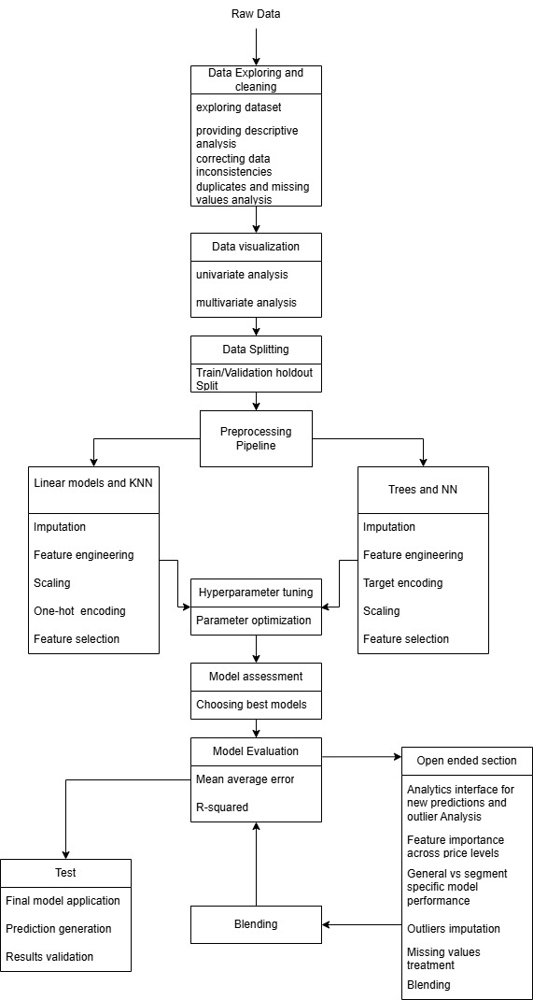
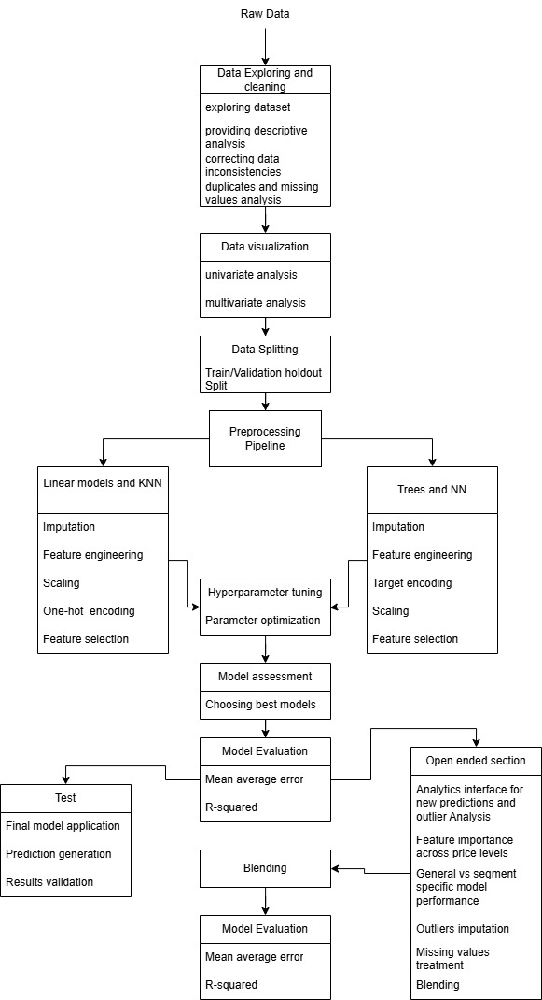

Importing the dataset and packages

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
from copy import deepcopy
from math import ceil
from rapidfuzz import process, fuzz
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, mutual_info_regression, SelectFromModel
from sklearn.linear_model import LassoCV, Ridge
from sklearn.model_selection import RepeatedKFold, cross_val_score
from sklearn.metrics import mean_absolute_error, make_scorer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LassoCV
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Ridge
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.linear_model import ElasticNet
import scipy.stats as stats
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.base import clone
from itertools import combinations
import heapq
from sklearn.inspection import permutation_importance



# Ignore all warnings
import warnings
warnings.filterwarnings('ignore')
test = pd.read_csv('test.csv')
train_original = pd.read_csv('train.csv')
train = train_original.copy()

In [24]:
# EDA and data cleaning
from Functions import sel_columns
from Functions import correct_num_variables
from Functions import correct_column
from Functions import correct_models_by_brand
from Functions import data_cleaning
from Functions import clean_basic_data

#Data visualization
from Functions import correlation_ratio
from Functions import cramers_v_matrix
from Functions import get_cramers_v

# Preprocessing 
## Missing Values Treatment
from Functions import create_percentile_bins
from Functions import check_bins
from Functions import create_custom_bins
from Functions import get_group_stats
from Functions import fit_nas
from Functions import transform_nas
## Feature Engineering
from Functions import fit_feat_engineering_rules
from Functions import transform_add_all_features
## Encodings: OHE, Ordinal Encoder and Target Encoder
### One Hot Encoder
from Functions import fit_ohe
from Functions import transform_ohe
### Ordinal Encoder
from Functions import fit_oe
from Functions import transform_oe
### Target Encoder
from Functions import fit_target_encoder
from Functions import transform_target_encoder
## Scaling
from Functions import fit_scaler
from Functions import transform_scaler
## Feature Selection
from Functions import feat_selection

# Models
## Linear Models
from Functions import fit_processing_rules_Lin
from Functions import transform_processing_rules_Lin
from Functions import evaluate_ols
from Functions import tune_ridge_holdout
from Functions import evaluate_ridge
from Functions import tune_lasso_holdout
from Functions import evaluate_lasso
from Functions import tune_enet_holdout
from Functions import evaluate_elasticnet
## KNN
from Functions import fit_processing_rules_Knn
from Functions import transform_processing_rules_Knn
## Neural Networks
from Functions import fit_processing_rules_nn
from Functions import transform_processing_rules_nn
from Functions import avg_score_nn
from Functions import show_results_nn
## Decision Trees
from Functions import fit_processing_rules_trees
from Functions import transform_processing_rules_trees
from Functions import compare_tree_models
from Functions import correlation_matrices
from Functions import apply_pipeline_for_feat_importance
## Blending
from Functions import objective_function_r2

# Open Ended Section
## Feature Importance across price levels
from Functions import importance_by_price_band
from Functions import plot_topk_each_band
from Functions import plot_heatmap
## Analytics interface for new predictions
from Functions import score_new_data
from Functions import predict_price
from Functions import evaluate_model
## General vs Segment-Specific Model Performance
from Functions import _loguniform
from Functions import hgb_param_sampler
from Functions import quick_tune_on_train_only

## 1. Import the dataset and explore the data

**Goal:** run a *data audit* (structure + quality) before any modeling, so later performance reflects real signal (not silent data quirks).

**Raw training set:** `n = 75,973` cars, `p = 14` columns (including the target `price`).

- **Identifier:** `carID`
- **Categorical predictors:** `Brand`, `model`, `transmission`, `fuelType`
- **Numeric predictors:** `year`, `mileage`, `engineSize`, `tax`, `mpg`, `previousOwners`, `paintQuality%`, `hasDamage`

The dataset is rich, but not “clean”. `price` has full coverage, but several predictors have missing values and/or impossible ranges (negative or out-of-bound values). The rest of Section 1 documents these issues **with counts** and defines the correction rules applied before EDA and modeling.


#### 1.1. Exploring the dataset.

In [25]:
# Display the first 5 rows
train.head() 


,carID,Brand,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,paintQuality%,previousOwners,hasDamage
0,69512,VW,Golf,2016.0,22290,Semi-Auto,28421.0,Petrol,NaN,11.417268,2.0,63.0,4.000000,0.0
1,53000,Toyota,Yaris,2019.0,13790,Manual,4589.0,Petrol,145.0,47.900000,1.5,50.0,1.000000,0.0
2,6366,Audi,Q2,2019.0,24990,Semi-Auto,3624.0,Petrol,145.0,40.900000,1.5,56.0,4.000000,0.0
3,29021,Ford,FIESTA,2018.0,12500,anual,9102.0,Petrol,145.0,65.700000,1.0,50.0,-2.340306,0.0
4,10062,BMW,2 Series,2019.0,22995,Manual,1000.0,Petrol,145.0,42.800000,1.5,97.0,3.000000,0.0


We can already see a few inconsistencies, like negative ``previousOwners``, missing values in ``tax`` and we suspect that the column ``hasDamage`` can have some problems because it's always zero.

Check column names, data types, non-null counts and unique values.

In [26]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75973 entries, 0 to 75972
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   carID           75973 non-null  int64  
 1   Brand           74452 non-null  object 
 2   model           74456 non-null  object 
 3   year            74482 non-null  float64
 4   price           75973 non-null  int64  
 5   transmission    74451 non-null  object 
 6   mileage         74510 non-null  float64
 7   fuelType        74462 non-null  object 
 8   tax             68069 non-null  float64
 9   mpg             68047 non-null  float64
 10  engineSize      74457 non-null  float64
 11  paintQuality%   74449 non-null  float64
 12  previousOwners  74423 non-null  float64
 13  hasDamage       74425 non-null  float64
dtypes: float64(8), int64(2), object(4)
memory usage: 8.1+ MB


The dataset has a shape of **(75,973 rows × 14 columns)**. From train.info() we can already extract two concrete takeaways:

- **Missingness exists in every predictor** (the target `price` is complete). The largest gaps are in `tax` and `mpg` (~10% missing each in the raw file), which will matter for later imputation and model robustness.
- Several fields are loaded as float64 even though they are conceptually discrete (`year`, `previousOwners`). That is usually a sign of corrupted entries (decimals, invalid values) and motivates explicit **type + range enforcement** before visualization and modeling.

In [27]:
train.nunique() # checking for unique values

carID             75973
Brand                72
model               735
year                 44
price             11048
transmission         40
mileage           34808
fuelType             34
tax                  65
mpg                 217
engineSize           58
paintQuality%        88
previousOwners       23
hasDamage             1
dtype: int64

Again, we confirm that ``hasDamage`` has only 1 value (0) and as expected there are columns with more variability than others.

#### 1.2. Providing descriptive statistics
This helps us to detect data quality issues, typical values and to spot anomalies and errors.

In [28]:
train.describe().T #quick statistical summary 

,count,mean,std,min,25%,50%,75%,max
carID,75973.0,37986.000000,21931.660338,0.000000,18993.00,37986.0,56979.0,75972.000000
year,74482.0,2017.096611,2.208704,1970.000000,2016.00,2017.0,2019.0,2024.121759
price,75973.0,16881.889553,9736.926322,450.000000,10200.00,14699.0,20950.0,159999.000000
mileage,74510.0,23004.184088,22129.788366,-58540.574478,7423.25,17300.0,32427.5,323000.000000
tax,68069.0,120.329078,65.521176,-91.121630,125.00,145.0,145.0,580.000000
mpg,68047.0,55.152666,16.497837,-43.421768,46.30,54.3,62.8,470.800000
engineSize,74457.0,1.660136,0.573462,-0.103493,1.20,1.6,2.0,6.600000
paintQuality%,74449.0,64.590667,21.021065,1.638913,47.00,65.0,82.0,125.594308
previousOwners,74423.0,1.994580,1.472981,-2.345650,1.00,2.0,3.0,6.258371
hasDamage,74425.0,0.000000,0.000000,0.000000,0.00,0.0,0.0,0.000000


The raw summary reveals values that cannot be real and therefore must be treated as data errors/outliers:

 **Negative values** in numeric fields that should be non-negative: `mileage` (min ≈ −58,540), `tax` (min ≈ −91), `mpg` (min ≈ −43), `engineSize` (min ≈ −0.10), `previousOwners` (min ≈ −2.35).

 **Invalid bounds**: `paintQuality%` can exceed 100 (max ≈ 125.6).

 **Temporal inconsistencies**: `year` contains fractional values and unrealistically high entries (max ≈ 2024.12 in the raw file).
 
 **No variance feature**: `hasDamage` has **exactly 1 unique value** (always 0), so it contains no predictive signal in this dataset snapshot.

**Cleaning decision:** treat invalid entries as *missing* (`NaN`) rather than clipping to a plausible value (to avoid injecting artificial signal). Section **1.3** applies explicit validity rules, and missing values are handled later via imputation inside the modeling workflow.

In [29]:
for col in train.columns:
    if train[col].dtype not in ['float64', 'int64']:
        continue
    income_clean = train[f"{col}"].dropna()
    has_decimal = income_clean % 1 != 0
    print(f"Number of {col} values with decimals: {has_decimal.sum()}")


Number of carID values with decimals: 0
Number of year values with decimals: 723
Number of price values with decimals: 0
Number of mileage values with decimals: 755
Number of tax values with decimals: 759
Number of mpg values with decimals: 66406
Number of engineSize values with decimals: 36417
Number of paintQuality% values with decimals: 726
Number of previousOwners values with decimals: 734
Number of hasDamage values with decimals: 0


#### 1.3. Correcting data inconsistencies for numerical variables


In [30]:
train_relevant=sel_columns(train)

We drop the following columns at this stage:

 **`carID`**: identifier only (no causal meaning; high-cardinality noise for most models).

 **`hasDamage`**: constant in this dataset (only 0 observed) → no variance ⇒ no predictive power.
 
**`paintQuality%`**:  We exclude it because this feature only exists after mechanical review.


In [31]:
train_coherent = train_relevant.copy()
train_coherent = correct_num_variables(train_coherent)
train_coherent.describe().T

,count,mean,std,min,25%,50%,75%,max
year,74124.0,2017.066551,2.167627,1970.0,2016.0,2017.0,2019.0,2020.0
price,75973.0,16881.889553,9736.926322,450.0,10200.0,14699.0,20950.0,159999.0
mileage,74141.0,23352.797092,21620.630248,1.0,7556.0,17416.0,32510.0,323000.0
tax,67691.0,121.259276,64.493191,0.0,125.0,145.0,145.0,580.0
mpg,67490.0,54.559426,11.814529,11.417268,46.3,54.3,62.8,117.7
engineSize,73939.0,1.671056,0.560236,0.6,1.2,1.6,2.0,6.6
previousOwners,74052.0,2.015057,1.440985,0.0,1.0,2.0,3.0,6.0


In [32]:
train_coherent.dtypes # checking the types after correction

Brand              object
model              object
year                Int64
price               int64
transmission       object
mileage           float64
fuelType           object
tax               float64
mpg               float64
engineSize        float64
previousOwners      Int64
dtype: object

This block cleans numeric variables with correct_num_variables, converting floats to int if needed and enforcing valid ranges (``year`` ≤ 2020, ``mileage/tax/previousOwners`` ≥ 0). It also applies real-world limits to ``engineSize`` (0.6–8.0) and ``mpg`` (10–120), sending any invalid values to NaN.

We can see that now our data is coherent with our goals.

#### 1.4. Correcting data inconsistencies for categorical variables

Checking for writing mistakes in the categorical features

In [33]:
print(train_coherent['Brand'].value_counts()) # count the occurrences of each unique value
print(train_coherent['transmission'].value_counts())
print(train_coherent['fuelType'].value_counts())
print(train_coherent['model'].value_counts())

Brand
Ford        14808
Mercedes    10754
VW           9780
Opel         8645
BMW          6968
            ...  
OYOTA           2
SKOD            1
TOYOT           1
skod            1
toyot           1
Name: count, Length: 72, dtype: int64
transmission
Manual       38050
Semi-Auto    15545
Automatic    14003
anual          804
MANUAL         801
manual         770
Manua          759
unknown        690
 Manual        366
Semi-Aut       332
emi-Auto       325
semi-auto      324
utomatic       313
SEMI-AUTO      309
Automati       304
AUTOMATIC      289
automatic      282
unknow          18
Manual          16
UNKNOWN         14
ANUAL           13
nknown          13
anua            12
SEMI-AUT        11
MANUA           11
emi-auto        10
 MANUAL          9
EMI-AUTO         7
 Manual          7
automati         6
utomati          6
 manual          6
AUTOMATI         6
emi-Aut          5
Other            5
semi-aut         4
manua            2
UTOMATIC         2
manual           1
nkno

 After examining the categorical features there were a lot of writing mistakes found. These inconsistensies must be adressed and dealt with to ensure that we have a clean and reliable dataset for further analysis.

Correcting types in categorical columns 

In [34]:
train_coherent_corrected = data_cleaning(train_coherent)

print(train_coherent_corrected['Brand'].value_counts()) # checking to see if the mistakes were corrected
print('-'*25)
print(train_coherent_corrected['transmission'].value_counts()) 
print('-'*25)
print(train_coherent_corrected['fuelType'].value_counts())
print('-'*25)

Brand
ford        16063
mercedes    11674
vw          10385
opel         9352
bmw          7392
audi         7325
toyota       4622
skoda        4303
hyundai      3336
Name: count, dtype: int64
-------------------------
transmission
manual            41627
semi-automatic    16872
automatic         15211
Name: count, dtype: int64
-------------------------
fuelType
petrol      41181
diesel      30885
hybrid       2225
electric        4
Name: count, dtype: int64
-------------------------


The helper correct_column standardizes categorical columns (`Brand`, `transmission`, `fuelType`) by lowercasing, trimming spaces, and using fuzzy matching to map noisy labels to a controlled vocabulary using a treshold of 30 since while testing it seemed the most appropriate.

We created the dictionary `brand_model_dict` which defines the allowed models per brand and acts as the reference list used to correct and validate the `model` column.  

Then correct_models_by_brand normalizes all `model` strings and, for each `Brand`, fuzzy-matches existing models to the brand-specific list, replacing close matches and leaving unmatched entries as they are.  

The main data_cleaning function applies correct_column to `Brand`, `transmission`, and `fuelType`, and then calls correct_models_by_brand to enforce consistency between `Brand` and `model`.  

Ambiguous information categories in `transmission` (values "unknown" and "other") are converted to missing values (NaN), so they can be explicitly imputed or handled later.

Overall, this cleaning step enforces type-correct, range-checked numeric fields and harmonized categorical labels, reducing noise and improving data quality before fitting any models.

#### 1.5. Duplicates and missing values analysis

Checking if there is duplicated data.

In [35]:
duplicates = train_coherent_corrected.duplicated().sum()
print(f"Number of duplicate rows in Train data: {duplicates}")

Number of duplicate rows in Train data: 332


There are not any duplicate rows.

Checking the existing missing values.

In [36]:
train_coherent_corrected.isna().sum()

Brand             1521
model             1517
year              1849
price                0
transmission      2263
mileage           1832
fuelType          1678
tax               8282
mpg               8483
engineSize        2034
previousOwners    1921
dtype: int64

The features ``tax`` and ``mpg`` present the highest volume of missing values across the entire dataset.

In [37]:
prop_missing_values = train_coherent_corrected['tax'].isna().sum() / len(train_coherent_corrected['tax'])#calculate proportion of missing values in 'tax' column
print("The missing values on Tax represent",round(prop_missing_values*100,2), "% of all Tax values" )

The missing values on Tax represent 10.9 % of all Tax values


In [38]:
prop_missing_values = train_coherent_corrected['mpg'].isna().sum() / len(train_coherent_corrected['mpg'])#calculate proportion of missing values in 'mpg' column
print("The missing values on mpg represent",round(prop_missing_values*100,2), "% of all mpg values" )

The missing values on mpg represent 11.17 % of all mpg values


With an absence rate approaching $10\%$ of all observations, we are inclined to believe that people may not want to disclose the tax they pay, in relation to mpg many people may not know the actual number. We will treat all the missing values in the future.

In [39]:
# select rows were tax is missing keeping only the brand and model columns
top3 = (
    train_coherent_corrected.loc[train_coherent_corrected['tax'].isna(), ['Brand', 'model']]
    .value_counts()           # counting the occurences of each combination (Brand,model) with missing tax
    .head(3)                  # get the top 3 most frequent combinations
    .reset_index(name='count')
)
print(top3)

      Brand    model  count
0      ford    focus   3726
1  mercedes  c class   2716
2      ford   fiesta     94


We can see the vast majority of missing values in the ``tax`` column belongs to the cars Ford Focus and Mercedes C class.

In [40]:
# select rows were mpg is missing keeping Brand and model
top3 = (
    train_coherent_corrected.loc[train_coherent_corrected['mpg'].isna(), ['Brand', 'model']]
    .value_counts()           # counting each of the occurrences
    .head(3)                  # getting the 3 most frequent combinations
    .reset_index(name='count')
)
print(top3)

      Brand    model  count
0      ford    focus   3698
1  mercedes  c class   2761
2        vw     golf    119


We can conclude that missingness in `tax`/`mpg` is dominated by a few models:

 For **`tax`**, most missing values come from **Ford Focus** and **Mercedes C Class** (together representing the majority of missing rows).
 
 For **`mpg`**, the same two models dominate, with **VW Golf** appearing next.

This reinforces the idea that missingness is **model-dependent** (related to how data was collected for specific car lines) rather than purely random noise.


In [41]:
# calculate the proportion of missing 'tax' values for Ford Focus cars
prop_miss_focus_tax = train_coherent_corrected.loc[
    (train_coherent_corrected['Brand'].str.casefold() == 'ford') &      # filter rows where brand is ford
    (train_coherent_corrected['model'].str.contains(r'\bfocus\b', case=False, na=False)),  # filter rows for the focus model
    'tax'
].isna().mean()

print(
    "The missing values in tax represent",
    round(prop_miss_focus_tax * 100, 2),
    "% of the total Ford Focus cars"
)

The missing values in tax represent 55.15 % of the total Ford Focus cars


In [42]:
prop_miss_cclass_tax = train_coherent_corrected.loc[
    (train_coherent_corrected['Brand'].str.casefold() == 'mercedes') &
    (train_coherent_corrected['model'].str.contains(r'\bc\s*class\b', case=False, na=False)),
    'tax'
].isna().mean()
print("The missing values on Tax for Mercedes C Class represent",
      round(prop_miss_cclass_tax * 100, 2), "% of the total Mercedes C Class")

The missing values on Tax for Mercedes C Class represent 52.34 % of the total Mercedes C Class


The missing values in `tax` and `mpg` are not evenly spread across the dataset. They concentrate heavily in a small set of high-frequency models (Ford Focus and Mercedes C Class), where more than half of the observations can have missing `tax`.

This matters because global mean/median imputation would blur real segment effects. Later imputation strategies should therefore leverage group information (at least `Brand`, and ideally `Brand + model`) to preserve the price structure by vehicle segment.



## 2. Data visualization

**Goal:** move from “data looks OK” to evidence about what drives `price`. We use:

1) **Univariate plots** to validate distributions, skewness, and outliers after the cleaning rules.  
2) **Bivariate / multivariate plots** to identify the strongest relationships and interactions (especially `model`/`Brand` segment effects and depreciation via `year`/`mileage`).  

A compact summary of the **notable relationships** is provided at the end of this section to make the EDA conclusions explicit and actionable for modeling.

#### 2.1. Univariate Analysis <a id="1_2"></a>

##### Numerical features

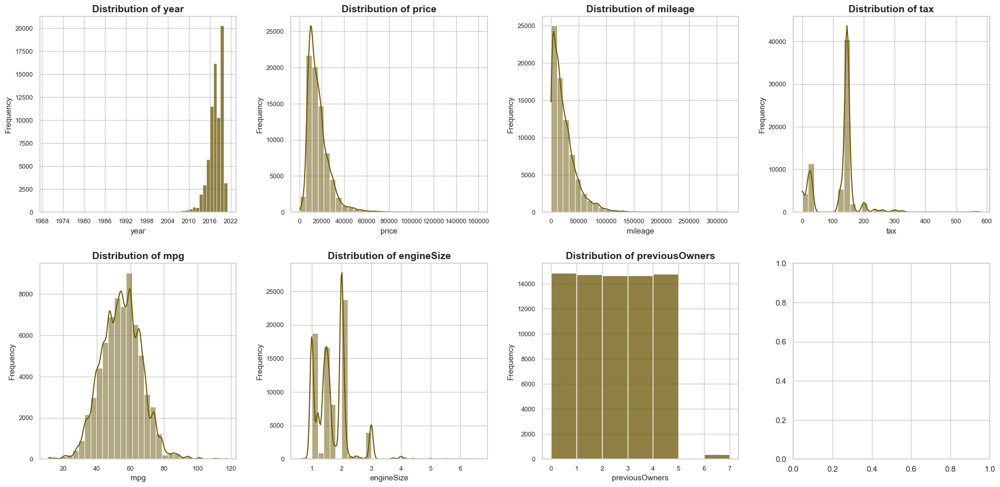

In [43]:
sns.set_theme(style='whitegrid')


car_num = train_coherent_corrected.select_dtypes(include=[np.number]).columns.tolist()
 

# Create subplots: 2 rows × 4 columns
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, feat in zip(axes.flatten(), car_num):
    # Drop missing values
    data = train_coherent_corrected[feat].dropna()

    # Use integer bins for discrete features
    if feat in ['year', 'previousOwners']:
        bins = list(range(int(data.min()), int(data.max()) + 2))  # +2 to include last bin edge
        kde_value = False
    else:
        bins = 30
        kde_value = True

    # Plot histogram
    sns.histplot(data, bins=bins, ax=ax, color="#695503", kde=kde_value)

    # Axis formatting
    ax.set_title(f'Distribution of {feat}', fontsize=14, fontweight='bold')
    ax.set_xlabel(feat, fontsize=11)
    ax.set_ylabel('Frequency', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)

    # Force integer ticks for discrete features
    if feat in ['year', 'previousOwners']:
        ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))

# Layout adjustments
plt.subplots_adjust(wspace=0.4, hspace=0.6)
fig.tight_layout(pad=2.0)
plt.show()


**`year`**: Most cars were registered between `2010` and `2022`, forming an approximately normal distribution. This reflects the company's focus on relatively recent vehicles and may help capture age-related depreciation when predicting `price`.

**`price`**: The majority of purchase prices fall between `5000` and `40000` pounds. This range likely represents the core resale market and defines the target variable for regression modeling.

**`mileage`**: A large concentration of values near `0` suggests many cars are resold while still relatively new. The distribution is strongly right-skewed, typical of variables with a minimum of zero and a few high-value outliers. This feature is expected to be highly predictive of `price`.

**`tax`**: Most vehicles exhibit a tax value in the range of £100–£200, with a secondary concentration observable around the £20–£40 interval.

**`mpg`**: Most cars report fuel efficiency between `20` and `80`, with a peak around `60`. This may reflect common fuel economy standards and could be relevant depending on how fuel efficiency influences resale value.

**`engineSize`**: Values are mostly between `1` and `2.2` liters, indicating a focus on compact and mid-sized vehicles. This feature may relate to performance or fuel consumption and could influence `price`.

**`previousOwners`**: The number of prior owners is evenly distributed between `0` and `4`. This feature could affect buyer trust or perceived reliability, making it a candidate for inclusion in the model.

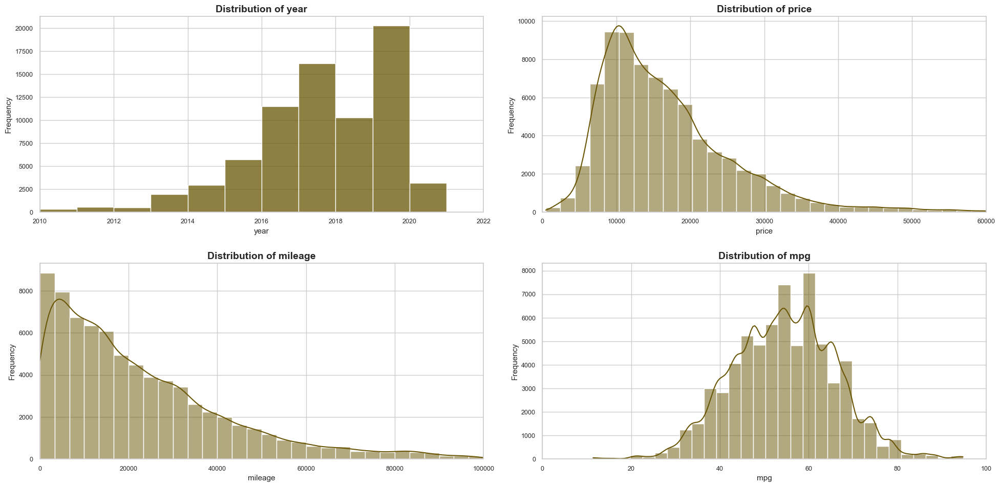

In [44]:
sns.set_theme(style='whitegrid')

# Define numerical features and their axis limits
car_num = ['year', 'price', 'mileage', 'mpg']
x_limits = {
    'year': (2010, 2022),
    'price': (0, 60000),
    'mileage': (0, 100000),  
    'mpg': (0, 100)
}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(20, 10))

for ax, feat in zip(axes.flatten(), car_num):
    # Drop missing values and apply filtering
    data = train_coherent_corrected[feat].dropna()
    xmin, xmax = x_limits[feat]
    data = data[(data >= xmin) & (data <= xmax)]

    # Use integer bins for 'year'
    if feat == 'year':
        bins = list(range(xmin, xmax + 2))  # +2 to include last
        kde_value = False
    else:
        bins = 30
        kde_value = True

    # Plot histogram
    sns.histplot(data, bins=bins, ax=ax, color="#695503", kde=kde_value)

    ax.set_title(f'Distribution of {feat}', fontsize=14, fontweight='bold')
    ax.set_xlabel(feat, fontsize=11)
    ax.set_ylabel('Frequency', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    ax.set_xlim(xmin, xmax)

plt.subplots_adjust(wspace=0.4, hspace=0.6)
fig.tight_layout(pad=2.0)
plt.show()


`year` is heavily concentrated between `2013` and `2020`, with a strong peak in `2019`, confirming that the dataset focuses on relatively recent used cars.

`price` shows a clear right-skew: most vehicles lie roughly between `7,000` and `20,000`, but there is a long tail of more expensive cars, suggesting that transformations or robust models may help handle high-value outliers.

`mileage` is also strongly right-skewed, with many cars below `30,000` miles but a substantial tail extending toward very high usage, again indicating the need for robust treatment of extreme values.

`mpg` is roughly bell-shaped, centered around mid-range efficiency (about `50–60` mpg), with fewer very inefficient or extremely efficient cars, meaning this variable behaves more like a “regular” continuous predictor.

##### Categorical features

To support clearer interpretation, the results will also be analyzed using relative frequencies, allowing for more balanced comparisons across categories.

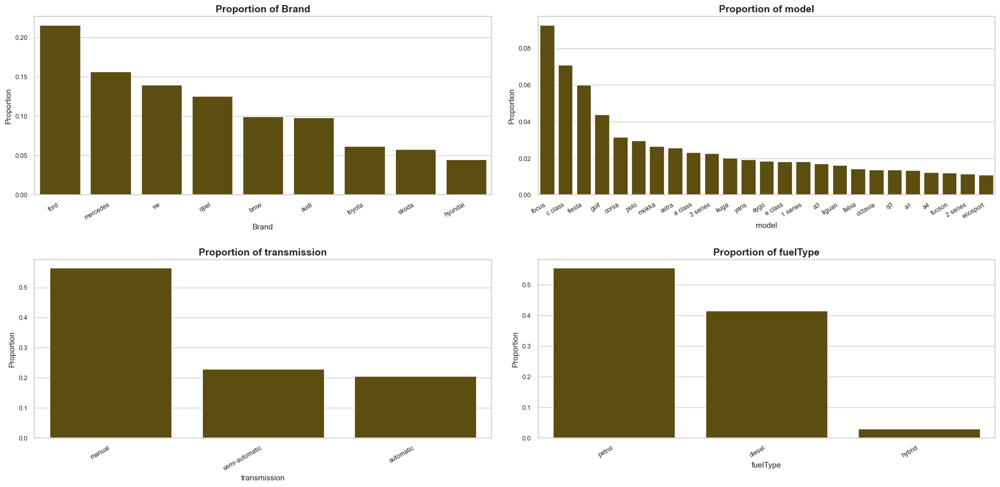

In [45]:
sns.set_theme(style='whitegrid')

# Define categorical features to visualize
cat_feat = train_coherent_corrected.select_dtypes(include='object').columns.tolist()

# Create subplots: adjust rows/columns based on number of features
n_cols = 2
n_rows = (len(cat_feat) + 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))

for ax, feat in zip(axes.flatten(), cat_feat):
    data = train_coherent_corrected[feat].dropna()
    total = len(data)

    # Compute proportions and filter out categories below 1%
    freq_data = data.value_counts(normalize=True)
    freq_data = freq_data[freq_data >= 0.01].sort_values(ascending=False)

    sns.barplot(x=freq_data.index, y=freq_data.values, ax=ax, color="#695503")

    ax.set_title(f'Proportion of {feat}', fontsize=14, fontweight='bold')
    ax.set_xlabel(feat, fontsize=11)
    ax.set_ylabel('Proportion', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)

    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Hide any unused subplots
for i in range(len(cat_feat), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.subplots_adjust(wspace=0.4, hspace=0.6)
fig.tight_layout(pad=2.0)
plt.show()


**`Brand`**: Ford is the most represented brand, accounting for approximately 20% of the dataset. Together, Ford, Mercedes, and Volkswagen make up over 50% of all entries, which may introduce brand-related bias. This imbalance will be addressed during feature scaling and modeling.

**`model`**: The dataset contains a wide variety of models, making it difficult to draw specific conclusions. However, the top 10 models collectively represent around 40% of all entries, suggesting a concentration of popularity among a few key types.

**`transmission`**: Manual transmission dominates the dataset, appearing in more than 50% of the entries. Semi-automatic and automatic transmissions follow, with nearly equal proportions, indicating a relatively balanced distribution among non-manual types.

**`fuelType`**: Petrol and diesel vehicles account for over 90% of the dataset, while hybrid and electric cars are present in much smaller numbers. This skew reflects traditional fuel preferences and may limit the generalizability of insights for newer technologies.

The conclusions stand, with some additions:

 The top `10` models account for approximately `35%` of the dataset, reinforcing the earlier observation of model concentration, though slightly lower than initially estimated.

 Electric vehicles represent less than `1%` of the data, confirming their minimal presence and limited impact on broader trends at this stage.

#### 2.2. Multivariate Analysis <a id="1_3"></a>

##### 2.2.1. Numerical vs Numerical

**Pairwise Relationships**

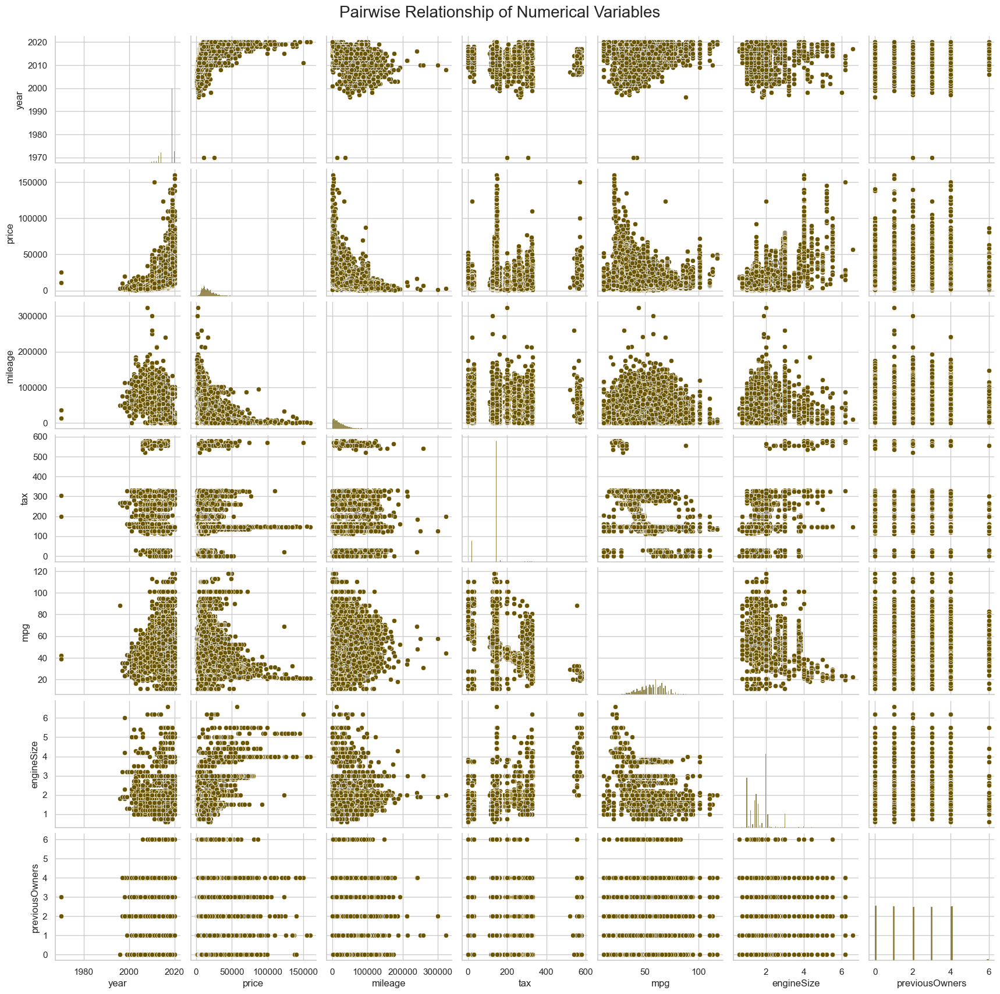

In [46]:
car_num = train_coherent_corrected.select_dtypes(include=[np.number]).columns.tolist()

sns.pairplot(train_coherent_corrected[car_num], diag_kind="hist",plot_kws={'color': '#695503'},diag_kws={'color': '#695503'})
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)
plt.show()

 The pairplot confirms the expected pattern between `price`, `year` and `mileage`: newer cars (higher `year`) tend to be more expensive, while cars with higher `mileage` are clearly cheaper.  

 `engineSize` shows a positive association with `price` and `tax`, and a negative association with `mpg`, which is consistent with larger engines being more powerful, more expensive, and less fuel-efficient.  

 `mpg` is negatively related to `price` and `engineSize`, but the relationship is clearly non-linear and quite noisy, suggesting that simple linear terms may not fully capture fuel-efficiency effects.  

 `previousOwners` appears mostly discrete with vertical bands and only a weak relationship with `price`, indicating it may have limited predictive power compared to other numeric features.  

 Several variables (`price`, `mileage`, `tax`) have skewed and heavy-tailed distributions (visible on the diagonal histograms), which motivates transformations or robust models to reduce the influence of extreme values.  
 
 Overall, this plot highlights `year`, `mileage`, `engineSize`, and `mpg` as the most structurally related to `price`, while also revealing non-linear patterns and potential outliers that we must handle carefully in the modeling phase.

**Spearman Correlation Matrix Heatmap**

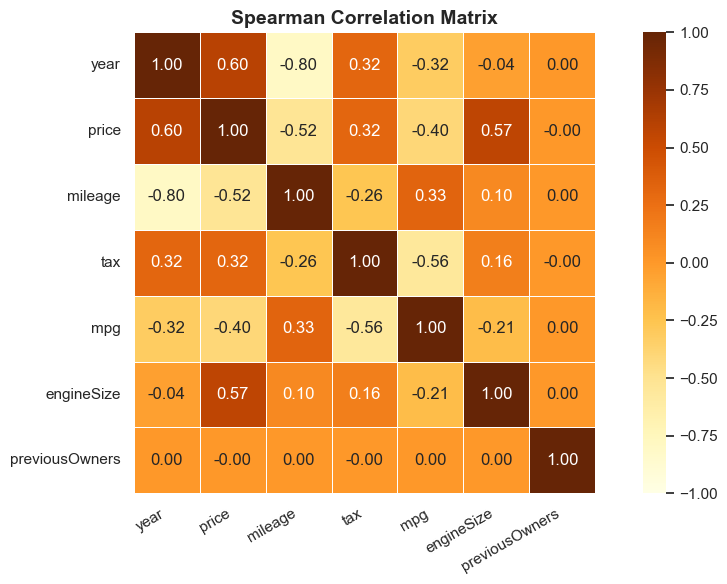

In [47]:
# Compute Spearman correlation matrix
corr = train_coherent_corrected[car_num].corr(method="spearman").round(2)

# Plot heatmap
plt.figure(figsize=(10, 6))

sns.heatmap(corr, annot=True, cmap='YlOrBr', fmt='.2f',
            vmin=-1, vmax=1, center=0, linewidths=0.5, square=True)

plt.title('Spearman Correlation Matrix', fontsize=14, fontweight='bold')
plt.xticks(rotation=30, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

**Our target is `price`, so it will be the main focus of the interpretations:**

 **`engineSize (0.57)`**: This has the strongest positive link to price. As engine size increases, the price tends to rise significantly.

 **`year (0.6)`**: Shows a moderate positive relationship. Newer cars (higher year) tend to cost more, which aligns with expectations.

 **`mileage (-0.52)`**: Displays a moderate negative link. As mileage increases, price tends to decrease.

 **`tax (0.32)`**: Indicates a weaker positive relationship. Cars with higher tax tend to have slightly higher prices.

 **`mpg (-0.39)`**: Indicates a weaker negative relationship. Cars with higher mpg tend to have slightly lower prices.

 **`previousOwners`**: These feature show weak correlations (less than `0.3`) with price. It may be less important for predicting price individually.


**Other key relationships :**

 **`year` and `mileage (-0.8)`**: A very strong negative link, confirming that newer cars typically have lower mileage.

 **`mpg` and `tax (-0.56)`**: Suggests that cars with better fuel efficiency (higher mpg) tend to have lower tax, likely due to emissions-based tax policies.


##### 2.2.2. Numerical vs Categorical

The analysis will begin by examining how brand influences the numerical variables.

In [48]:
categorical_cols = train_coherent_corrected.select_dtypes(include=['object', 'category']).columns.tolist()
num_features = ['year', 'price', 'mileage', 'tax', 'mpg', 'engineSize', 'previousOwners']


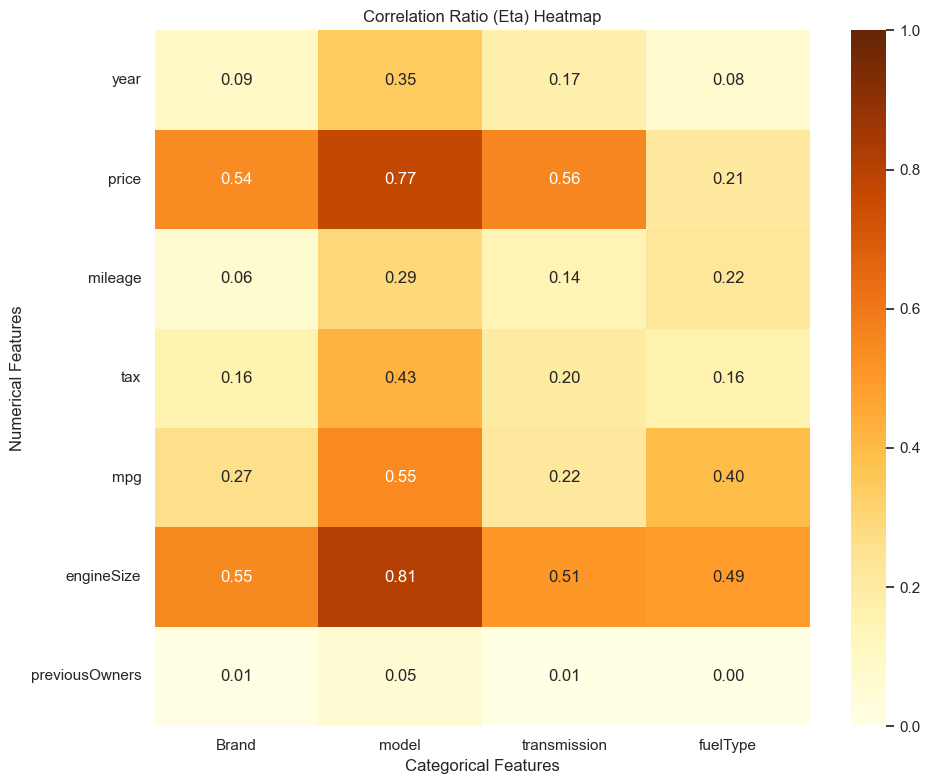

In [49]:
# --- 1. Calculate the Eta Matrix ---
# Create an empty matrix
eta_matrix = pd.DataFrame(index=num_features, columns=categorical_cols, dtype=float)

# Loop through features and calculate Eta using the imported function
for num_col in num_features:
    for cat_col in categorical_cols:
        eta = correlation_ratio(train_coherent_corrected[cat_col], train_coherent_corrected[num_col])
        eta_matrix.loc[num_col, cat_col] = eta

# --- 2. Plot the Heatmap ---
plt.figure(figsize=(10, 8))
sns.heatmap(
    eta_matrix.astype(float), 
    annot=True, 
    fmt='.2f', 
    cmap='YlOrBr', 
    vmin=0, 
    vmax=1
)
plt.title('Correlation Ratio (Eta) Heatmap')
plt.xlabel('Categorical Features')
plt.ylabel('Numerical Features')
plt.tight_layout()
plt.show()

This eta heatmap shows that `model` is the categorical variable most strongly associated with key numeric features, especially `engineSize` (0.80), `price` (0.77) and `mpg` (0.65), confirming that model choice largely drives car configuration and value.  
`Brand` has a moderate association with `price` and `engineSize` (both 0.54), but clearly less explanatory power than `model`, meaning intra-brand differences between models are very important.  
 `transmission` and `fuelType` show medium associations with `price` (≈0.56 and 0.21) and `engineSize` (≈0.50 and 0.49), indicating that drivetrain and fuel choice contribute non-negligibly to price and technical specs.  
 `year` and `mileage` have only weak-to-moderate relationships with the categorical features, suggesting that age and usage are more continuous effects, not strongly determined by brand or model groups.  
`previousOwners` is almost independent of all categorical variables (values close to 0), so it likely carries limited interaction structure with brand/model/fuel/transmission.  
Overall, the plot highlights `model`, followed by `engineSize`, `Brand`, `transmission` and `fuelType` as the most informative categorical–numeric interactions for explaining `price` and car characteristics.

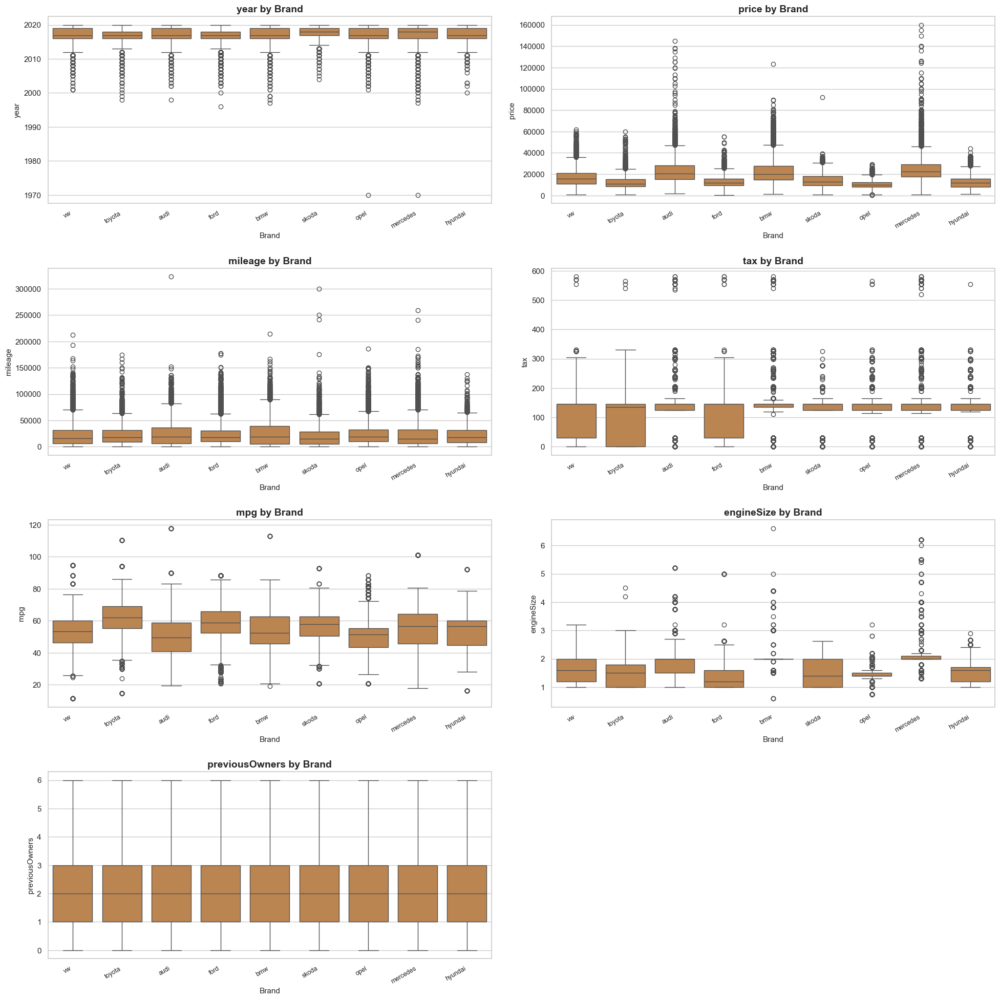

In [50]:
# Set up subplot grid
n_cols = 2
n_rows = (len(num_features) + 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))

# Flatten axes for consistent indexing
axes = axes.flatten()

for ax, feature in zip(axes, num_features):
    # CHANGE: Set color to 'brown'
    sns.boxplot(data=train_coherent_corrected, x='Brand', y=feature, ax=ax, color='peru')
    
    ax.set_title(f'{feature} by Brand', fontsize=14, fontweight='bold')
    ax.set_xlabel('Brand', fontsize=11)
    ax.set_ylabel(feature, fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Remove unused axes
for i in range(len(num_features), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout(pad=2.0)
plt.show()

Across brands, `price`, `engineSize` and `tax` show clear differences: premium brands (e.g., `BMW`, `Mercedes`, `Audi`) tend to be more expensive, with larger average `engineSize` and higher `tax`, while others such as `Skoda` and `Hyundai` occupy lower ranges.
In contrast, patterns for `mileage`, `mpg` and `previousOwners` are broadly similar across `Brand`, making them less informative at this aggregation level.
Given this, the analysis will now zoom in on how `model` within each `Brand` affects `engineSize`, `tax`, `year`, `price` and `mileage`, starting with `price`, since these variables exhibit the strongest relationships with `price` in the earlier correlation analysis.

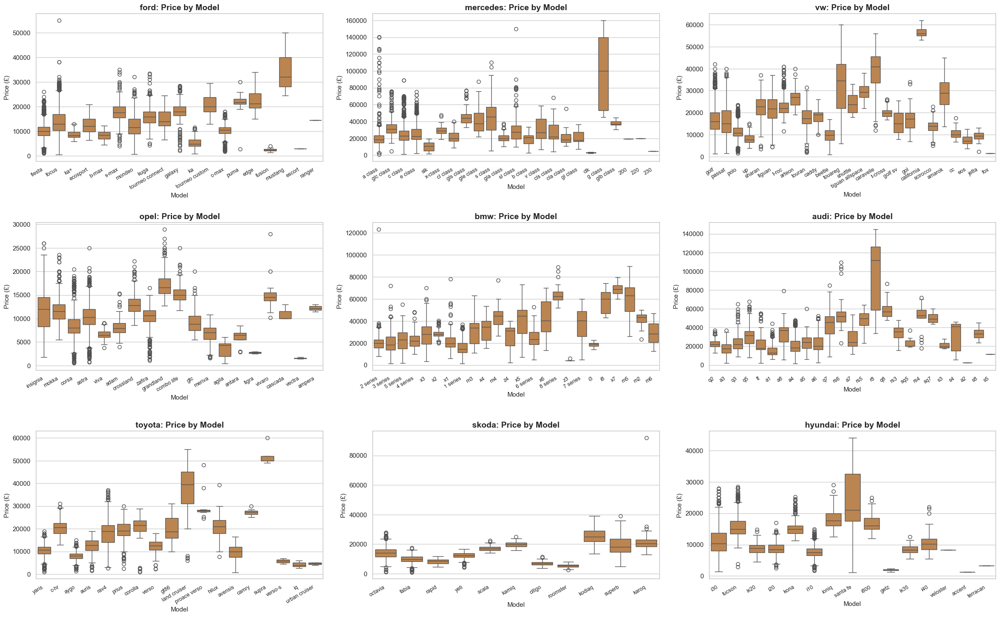

In [51]:

# Select top 9 brands by frequency
top_brands = train_coherent_corrected['Brand'].value_counts().nlargest(9).index.tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), top_brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # Drop missing values
    brand_data = brand_data[['model', 'price']].dropna()

    # Plot boxplot of price by model
    sns.boxplot(data=brand_data, x='model', y='price', ax=ax, color='peru')

    ax.set_title(f'{brand}: Price by Model', fontsize=14, fontweight='bold')
    ax.set_xlabel('Model', fontsize=11)
    ax.set_ylabel('Price (£)', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Hide any unused subplots (if fewer than 9 brands)
for i in range(len(top_brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


There is a clear and strong relationship between `model` and `price` within each brand: entry-level city cars sit at the bottom of the price range, while SUVs, luxury and performance models reach much higher values.
This pattern is not limited to Toyota; it appears consistently across Ford, VW, Opel, Mercedes, BMW, Audi, Skoda and Hyundai, confirming that model choice is a major driver of price beyond brand alone.
Premium German brands show the widest dispersion, with certain models forming very high-price clusters and many outliers, while brands like Skoda and Hyundai exhibit more compact price ranges.
Given this strong model–price structure, the next step is to analyse how brand and model are associated with `mileage`, to understand whether different segments also differ in typical usage.

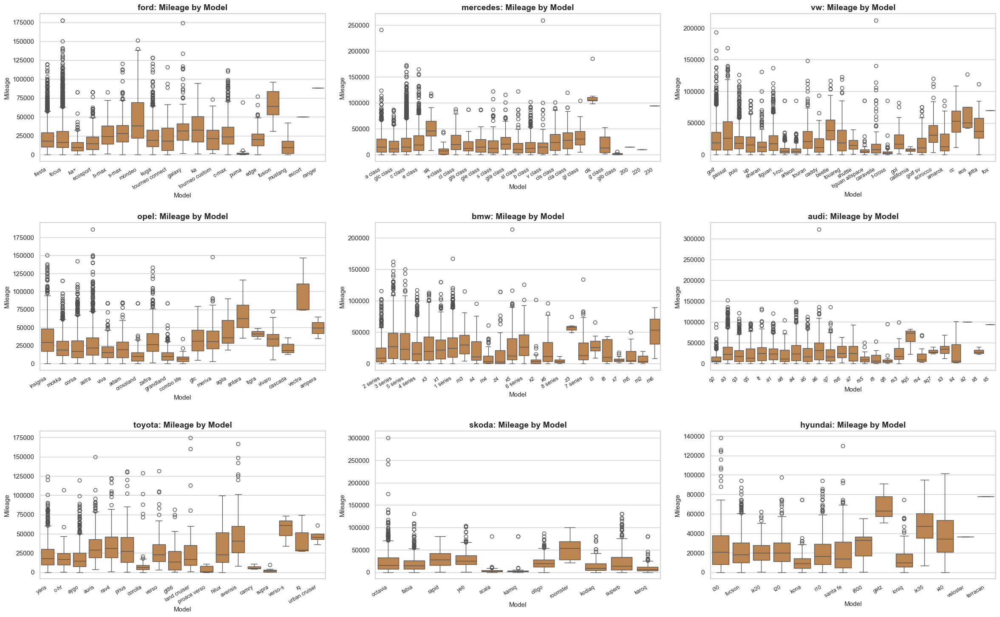

In [52]:

# Select top 9 brands by frequency
top_brands = train_coherent_corrected['Brand'].value_counts().nlargest(9).index.tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), top_brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # Drop missing values
    brand_data = brand_data[['model', 'mileage']].dropna()

    # Plot boxplot of mileage by model
    sns.boxplot(data=brand_data, x='model', y='mileage', ax=ax, color='peru')

    ax.set_title(f'{brand}: Mileage by Model', fontsize=14, fontweight='bold')
    ax.set_xlabel('Model', fontsize=11)
    ax.set_ylabel('Mileage', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Hide any unused subplots (if fewer than 9 brands)
for i in range(len(top_brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


A structured relationship between `model` and `mileage` is visible within each brand: small city cars tend to have lower median `mileage`, while larger SUVs and multi-purpose models often accumulate substantially more use.
`mileage` shows much larger dispersion than `price`, with many high-mileage outliers, reflecting heterogeneous driving patterns and some vehicles used intensively (e.g., long-distance or fleet usage).
Even with this noise, `model` effects remain clear, since certain segments consistently cluster at similar `mileage` ranges inside each brand.
After understanding how `mileage` varies by brand and `model`, the next step is to analyse `tax` to see how fiscal burden aligns with these usage and segment differences.

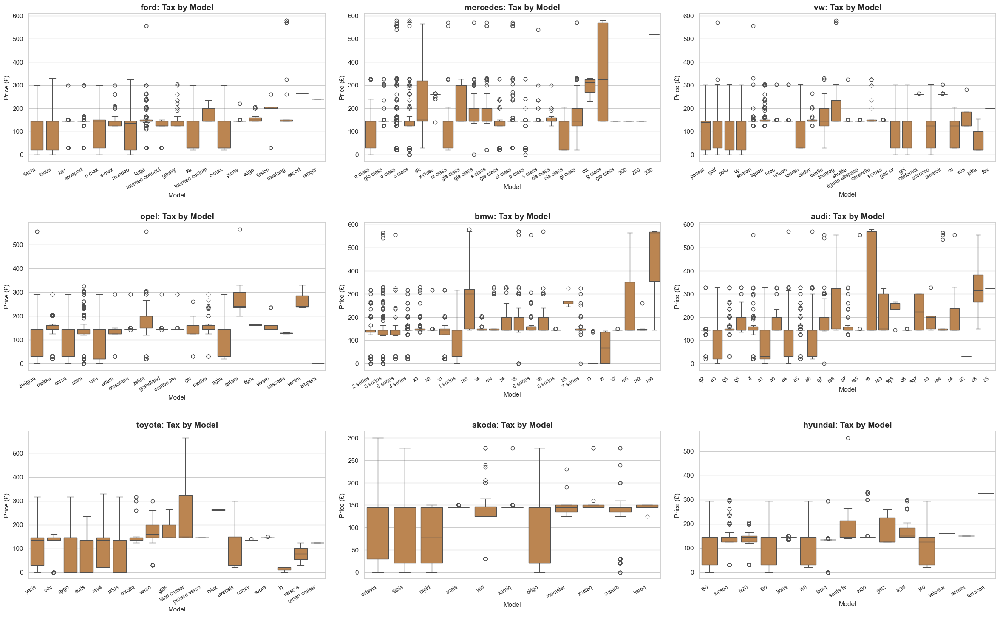

In [53]:

# Select top 9 brands by frequency
top_brands = train_coherent_corrected['Brand'].value_counts().nlargest(9).index.tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), top_brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # Drop missing values
    brand_data = brand_data[['model', 'tax']].dropna()

    # Plot boxplot of tax by model
    sns.boxplot(data=brand_data, x='model', y='tax', ax=ax, color='peru')

    ax.set_title(f'{brand}: Tax by Model', fontsize=14, fontweight='bold')
    ax.set_xlabel('Model', fontsize=11)
    ax.set_ylabel('Price (£)', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Hide any unused subplots (if fewer than 9 brands)
for i in range(len(top_brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


This plot shows that `tax` also varies systematically with `model`, but the separation is clearer for some brands (e.g., Toyota, Skoda, Hyundai), where larger SUVs and higher-end models consistently face higher median `tax`.
For premium brands like Mercedes, BMW and Audi, tax levels are more clustered into a few brackets with many overlapping outliers, making the variable less discriminative across `model`s.
After assessing `tax` as a proxy for `engineSize`/emission class, the next step is to examine how `year` interacts with `brand` and `model` to capture vehicle age effects.

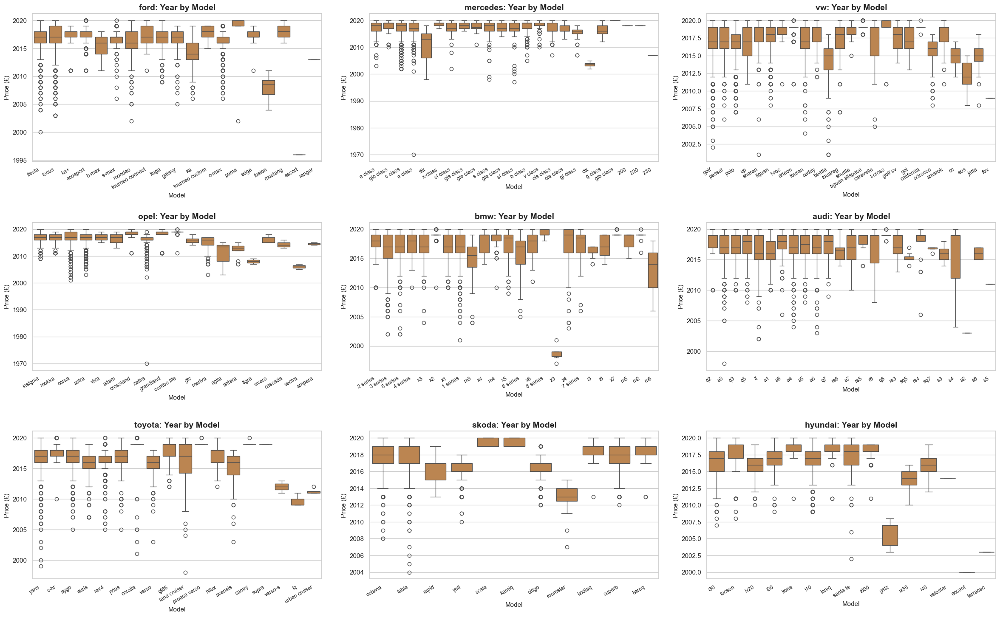

In [54]:

# Select top 9 brands by frequency
top_brands = train_coherent_corrected['Brand'].value_counts().nlargest(9).index.tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), top_brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # Drop missing values
    brand_data = brand_data[['model', 'year']].dropna()

    # Plot boxplot of year by model
    sns.boxplot(data=brand_data, x='model', y='year', ax=ax, color='peru')

    ax.set_title(f'{brand}: Year by Model', fontsize=14, fontweight='bold')
    ax.set_xlabel('Model', fontsize=11)
    ax.set_ylabel('Price (£)', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Hide any unused subplots (if fewer than 9 brands)
for i in range(len(top_brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


Many models are concentrated in specific production windows: some (e.g., small Hyundai and Skoda models) only appear in a narrow band of years, while long-running nameplates like VW and Ford hatchbacks span a wider range.
The dataset is heavily dominated by recent vehicles (mostly after 2010), with only a few older outliers, reinforcing a strong link between `year`, `model` and the observed price and mileage patterns.
Having established these temporal effects, we now analyse `engineSize` to see how mechanical configuration varies across brands and models.

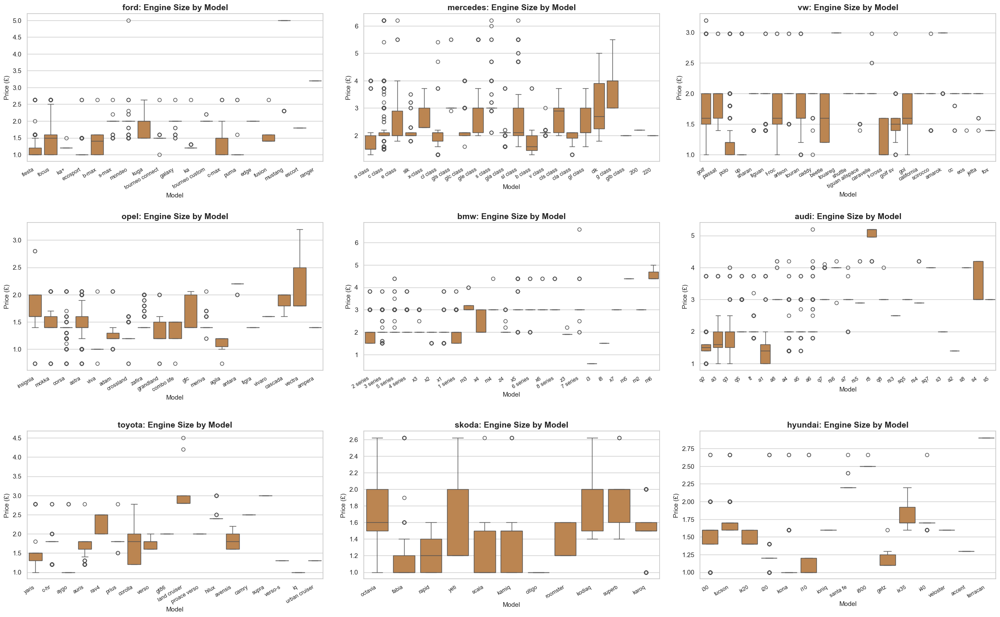

In [55]:

# Select top 9 brands by frequency
top_brands = train_coherent_corrected['Brand'].value_counts().nlargest(9).index.tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), top_brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # Drop missing values
    brand_data = brand_data[['model', 'engineSize']].dropna()

    # Plot boxplot of engineSize by model
    sns.boxplot(data=brand_data, x='model', y='engineSize', ax=ax, color='peru')

    ax.set_title(f'{brand}: Engine Size by Model', fontsize=14, fontweight='bold')
    ax.set_xlabel('Model', fontsize=11)
    ax.set_ylabel('Price (£)', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Hide any unused subplots (if fewer than 9 brands)
for i in range(len(top_brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


There are many observations with `engineSize` very close to zero across several `model`s, which is unlikely in practice and suggests remaining data-quality issues or miscoding for this variable.
Apart from the expected higher `engineSize` in some premium or SUV models, the within-brand patterns by `model` are quite noisy and not very informative, so `engineSize` seems more interpretable when aggregated at the `brand` level.
Given these limitations, the next step is to investigate how `fuelType` relates to the main numerical features to understand differences in efficiency and performance across fuel technologies.

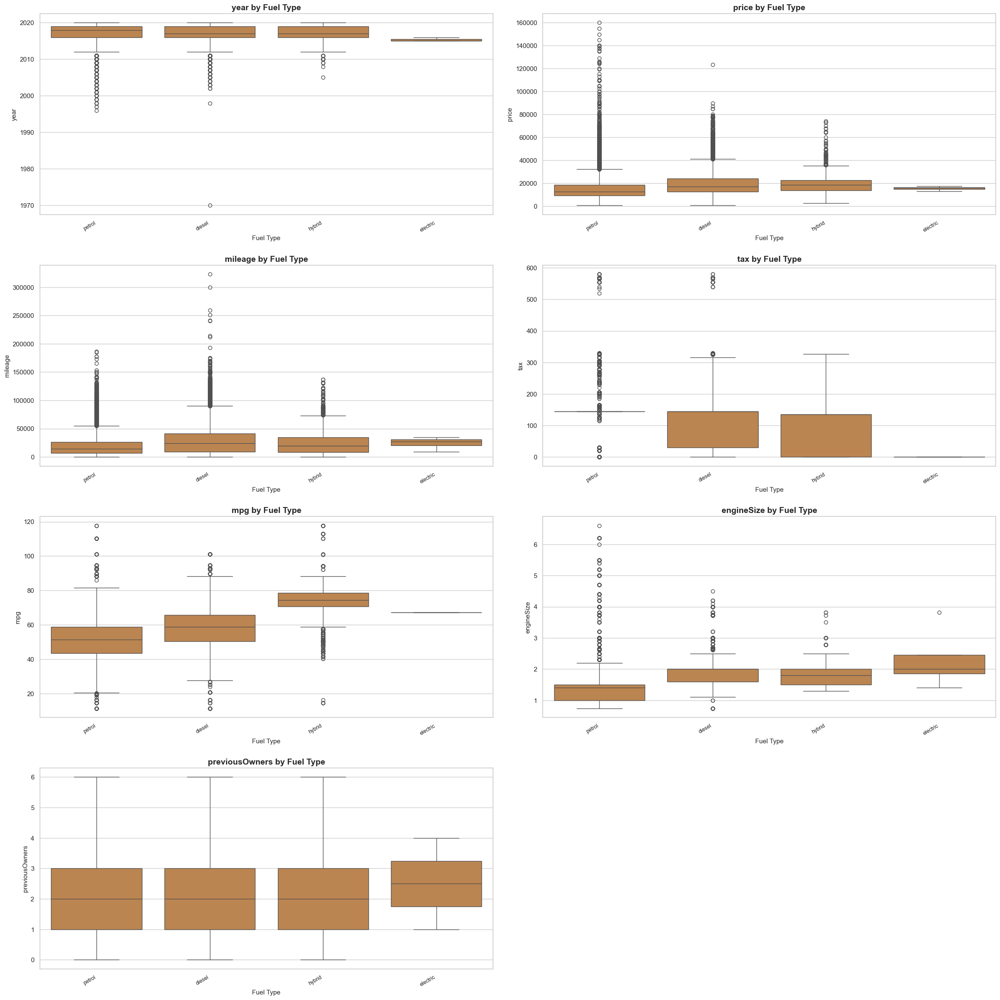

In [56]:
# Define numerical features to compare against fuelType
num_features = ['year', 'price', 'mileage', 'tax', 'mpg', 'engineSize', 'previousOwners']

# Set up dynamic subplot grid
n_cols = 2
n_rows = (len(num_features) + 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 6 * n_rows))

# Flatten axes for consistent indexing
axes = axes.flatten()

for ax, feature in zip(axes, num_features):
    sns.boxplot(data=train_coherent_corrected, x='fuelType', y=feature, ax=ax, color='peru')
    ax.set_title(f'{feature} by Fuel Type', fontsize=14, fontweight='bold')
    ax.set_xlabel('Fuel Type', fontsize=11)
    ax.set_ylabel(feature, fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Remove unused axes
for i in range(len(num_features), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout(pad=2.0)
plt.show()


`electric` cars are concentrated around recent `year`s and show extremely high `mpg`, but this is not directly comparable to combustion cars because they do not consume traditional fuel.
`diesel` vehicles display the highest `mileage`, consistent with intensive, long-distance usage, while `petrol` spans the widest `price` and `tax` ranges, covering both budget and high-end segments; `hybrid` and `electric` tend to have more moderate and compact `tax` levels.
`engineSize` roughly follows the pattern `petrol` < `diesel`/`hybrid` < `electric`, indicating that fuel technology is intertwined with both technical configuration and usage profile. Next we will see the `transmition`


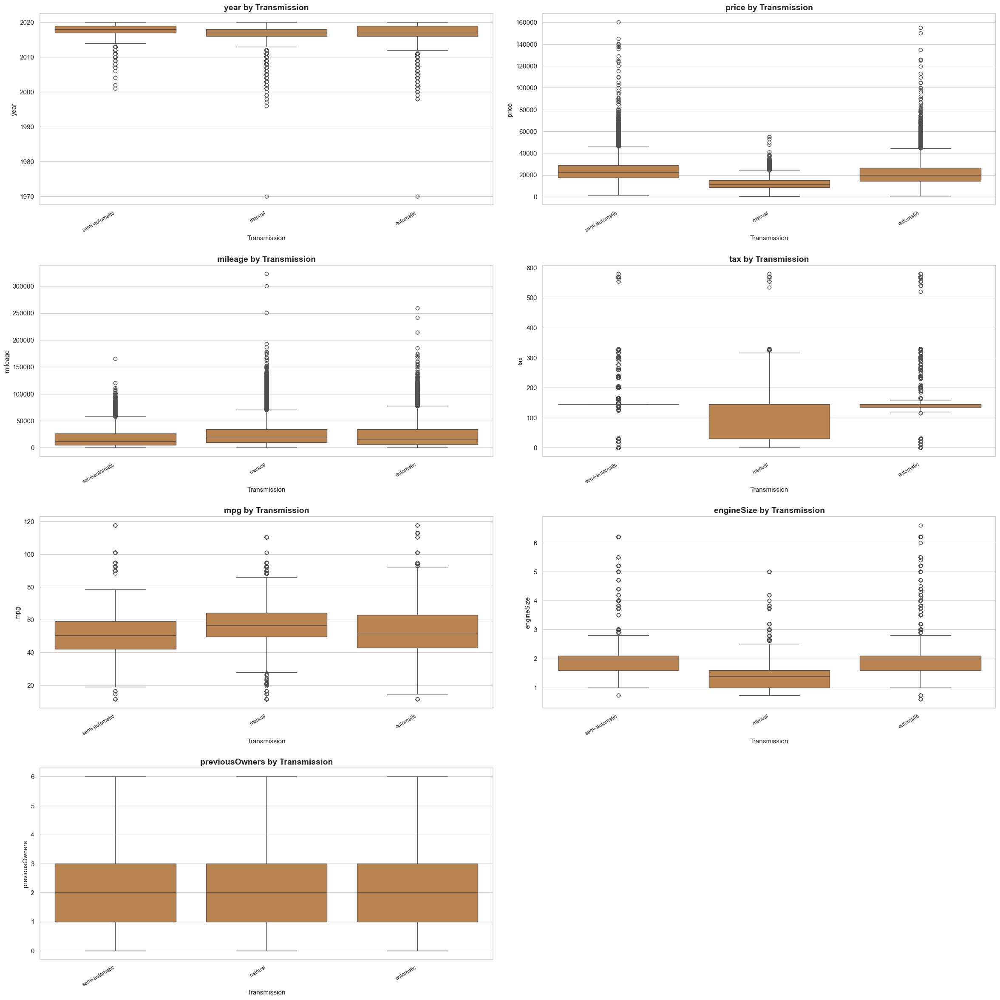

In [57]:
# Define numerical features to compare against transmission
num_features = ['year', 'price', 'mileage', 'tax', 'mpg', 'engineSize', 'previousOwners']

# Set up dynamic subplot grid
n_cols = 2
n_rows = (len(num_features) + 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 6 * n_rows))

# Flatten axes for consistent indexing
axes = axes.flatten()

for ax, feature in zip(axes, num_features):
    sns.boxplot(data=train_coherent_corrected, x='transmission', y=feature, ax=ax, color='peru')
    ax.set_title(f'{feature} by Transmission', fontsize=14, fontweight='bold')
    ax.set_xlabel('Transmission', fontsize=11)
    ax.set_ylabel(feature, fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Remove unused axes
for i in range(len(num_features), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout(pad=2.0)
plt.show()


Across `transmission` types, patterns are relatively similar, but `manual` cars tend to be the cheapest and have slightly smaller `engineSize`, while `automatic` and `semi-automatic` vehicles skew to higher `price`.
`tax` for `manual` cars is mostly concentrated between 50 and 150, whereas `automatic` and especially `semi-automatic` show wider and less stable `tax` distributions with many outliers.
`mileage`, `mpg` and `previousOwners` do not differ strongly across `transmission`, suggesting that `transmission` is a moderate but not dominant driver of usage or efficiency compared to other features.

##### 2.2.3. Categorical vs Categorical

In [58]:
categorical_cols = train_coherent_corrected.select_dtypes(include=['object', 'category']).columns.tolist()

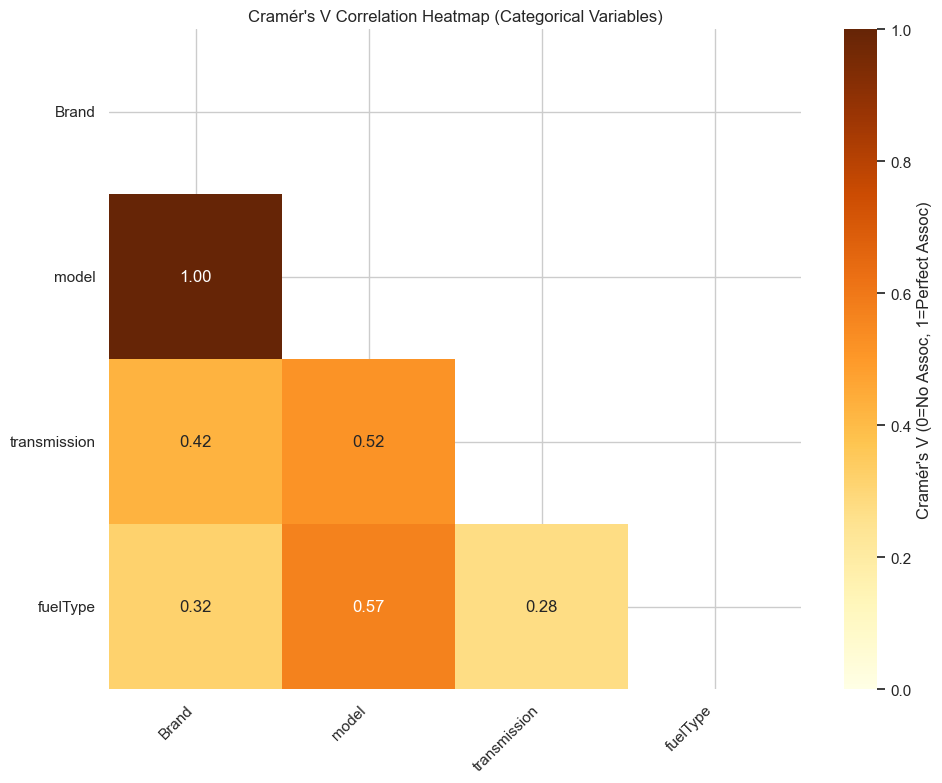

In [59]:
# --- 1. Calculate the Data ---
# Pass the dataframe to the imported function
cramers_df = cramers_v_matrix(train_coherent_corrected)

# --- 2. Plot the Heatmap ---
plt.figure(figsize=(10, 8))

# Mask the upper triangle (since the matrix is symmetric)
mask = np.triu(np.ones_like(cramers_df, dtype=bool))

sns.heatmap(
    cramers_df, 
    annot=True, 
    fmt='.2f', 
    cmap='YlOrBr',  
    vmin=0, 
    vmax=1,
    mask=mask,      # Hides the upper triangle
    cbar_kws={'label': "Cramér's V (0=No Assoc, 1=Perfect Assoc)"}
)

plt.title("Cramér's V Correlation Heatmap (Categorical Variables)")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

`model` is perfectly associated with `Brand` (Cramér’s V = 1), confirming that each `model` uniquely belongs to a single `Brand`, and it also shows moderate association with `transmission` and `fuelType`.
All other pairs (`Brand`–`transmission`, `Brand`–`fuelType`, `transmission`–`fuelType`) have weaker associations (V ≈ 0.3–0.5), indicating some relationship but much less structure than the `Brand`–`model` hierarchy.

How does the fuelType varies in each car model inside each brand type

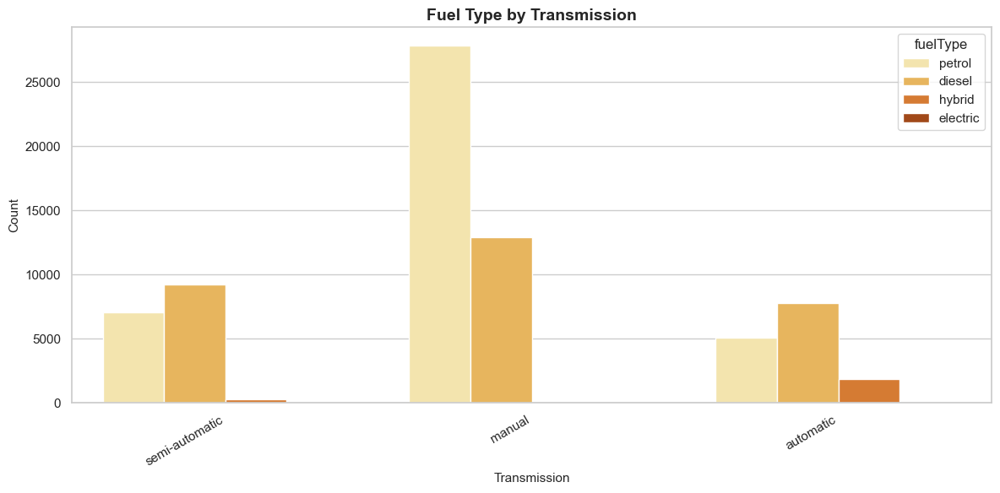

In [60]:
plt.figure(figsize=(12, 6))
sns.countplot(data=train_coherent_corrected, x='transmission', hue='fuelType', palette='YlOrBr')
plt.title('Fuel Type by Transmission', fontsize=14, fontweight='bold')
plt.xlabel('Transmission', fontsize=11)
plt.ylabel('Count', fontsize=11)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()

It can be concluded that manual cars are mostly either petrol or diesel, with petrol being approximately twice as common as diesel. Semi-automatic and automatic cars show a slight preference for diesel over petrol. Hybrid cars are mostly automatic, and electric vehicles likely follow the same trend.

Transmission Type by Brand

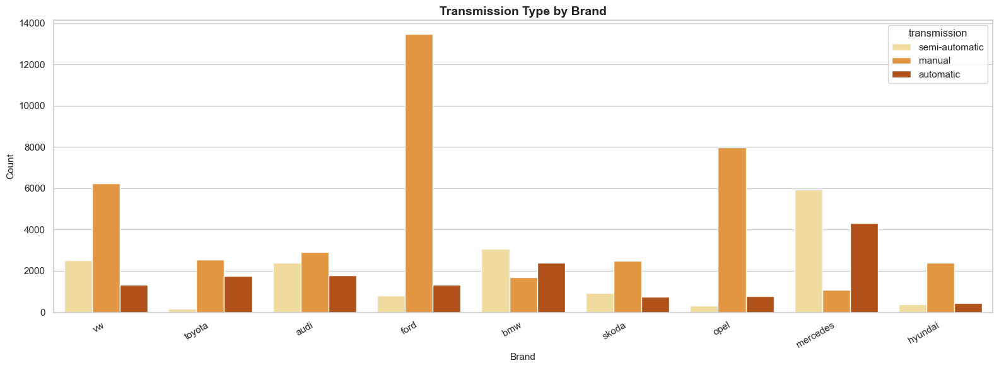

In [61]:
plt.figure(figsize=(16, 6))
sns.countplot(data=train_coherent_corrected, x='Brand', hue='transmission', palette='YlOrBr')
plt.title('Transmission Type by Brand', fontsize=14, fontweight='bold')
plt.xlabel('Brand', fontsize=11)
plt.ylabel('Count', fontsize=11)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()

There are some interesting findings:

 Manual transmissions (Ford, VW, Opel, Skoda, Hyundai) suggest budget-friendly models → likely lower prices.

 Automatic and semi-automatic (Mercedes, Toyota) align with higher-end models → potentially higher prices.

 Mixed transmission types (Audi, BMW) reflect a wider price range.


Fuel Type by Brand

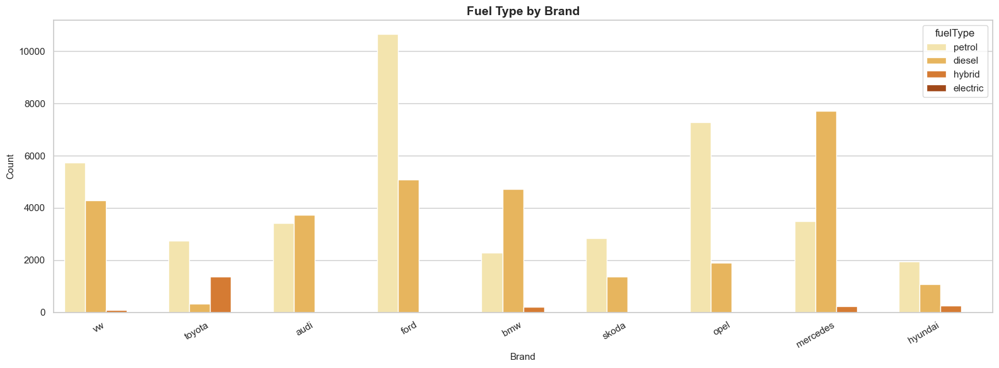

In [62]:
plt.figure(figsize=(16, 6))
sns.countplot(data=train_coherent_corrected, x='Brand', hue='fuelType', palette='YlOrBr')
plt.title('Fuel Type by Brand', fontsize=14, fontweight='bold')
plt.xlabel('Brand', fontsize=11)
plt.ylabel('Count', fontsize=11)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()

These patterns align with the transmission-by-brand conclusions and are consistent with the ``fuelType`` vs ``transmission`` graph.

 Volkswagen and Audi show a balanced distribution between petrol and diesel.

 Ford, Skoda, Opel, and Hyundai lean heavily toward petrol, suggesting more budget-oriented offerings.

 BMW and Mercedes favor diesel, which may reflect their focus on long-distance or premium diesel models.

 Toyota is split between diesel and hybrid, with diesel being more dominant.


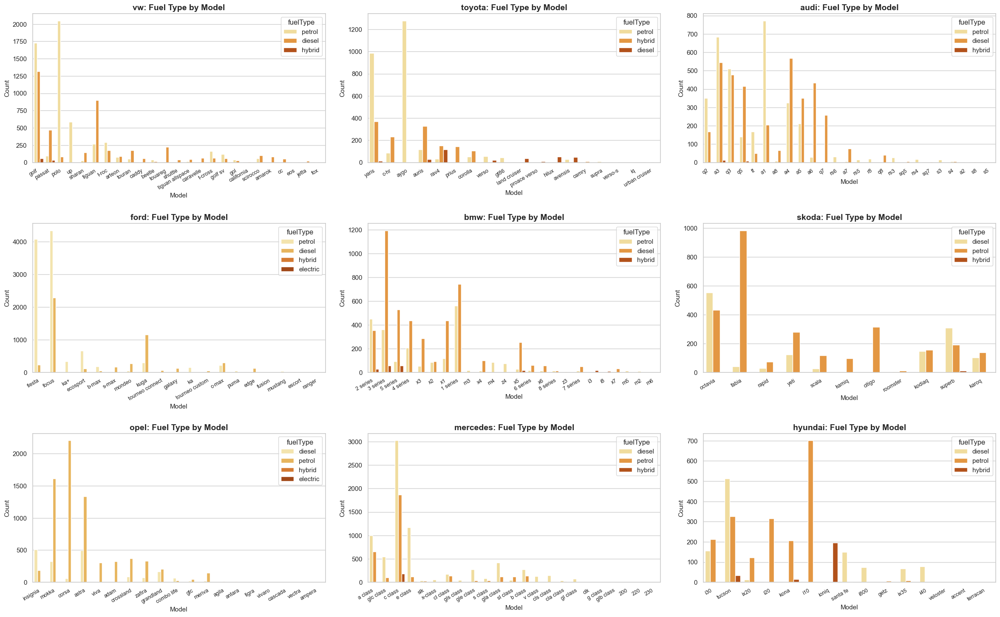

In [63]:

# Get all 9 brands
brands = train_coherent_corrected['Brand'].unique().tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # # Filter out rare models (less than 5% of brand data)
    # model_counts = brand_data['model'].value_counts()
    # valid_models = model_counts[model_counts >= 0.05 * len(brand_data)].index
    # brand_data = brand_data[brand_data['model'].isin(valid_models)]

    # Plot fuelType distribution by model
    sns.countplot(data=brand_data, x='model', hue='fuelType', ax=ax, palette='YlOrBr')

    ax.set_title(f'{brand}: Fuel Type by Model', fontsize=14, fontweight='bold')
    ax.set_xlabel('Model', fontsize=11)
    ax.set_ylabel('Count', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Hide unused subplots (if fewer than 9 brands)
for i in range(len(brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


Across all brands, most `model`s are clearly dominated by a single `fuelType` (e.g., many VW, Ford, Opel and Mercedes models are mainly diesel, while several Toyota and Hyundai models have strong hybrid presence), confirming a strong dependency between model design and fuel technology.

Only a few models exhibit a more balanced mix of petrol, diesel and hybrid variants, so `fuelType` is largely redundant once `model` is known but still useful for capturing fine-grained technical differences within specific models.

How does the transmission varies in each car model inside each brand type

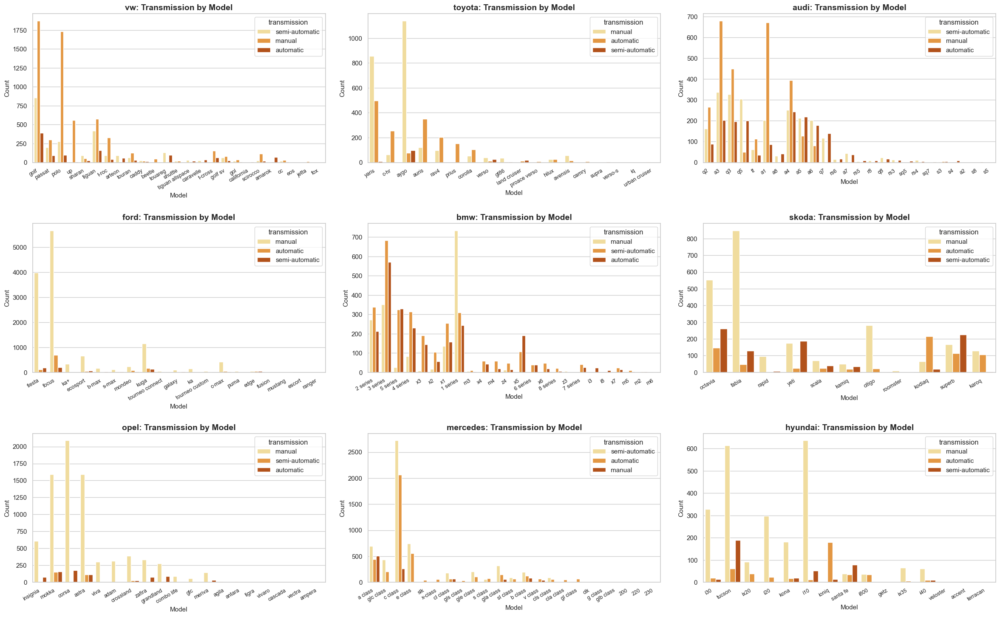

In [64]:

# Get all 9 brands
brands = train_coherent_corrected['Brand'].unique().tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # # Filter out rare models (less than 5% of brand data)
    # model_counts = brand_data['model'].value_counts()
    # valid_models = model_counts[model_counts >= 0.05 * len(brand_data)].index
    # brand_data = brand_data[brand_data['model'].isin(valid_models)]

    # Plot transmission distribution by model
    sns.countplot(data=brand_data, x='model', hue='transmission', ax=ax, palette='YlOrBr')

    ax.set_title(f'{brand}: Transmission by Model', fontsize=14, fontweight='bold')
    ax.set_xlabel('Model', fontsize=11)
    ax.set_ylabel('Count', fontsize=11)
    ax.tick_params(axis='x', labelsize=9)
    for label in ax.get_xticklabels():
        label.set_rotation(30)
        label.set_ha('right')

# Hide unused subplots (if fewer than 9 brands)
for i in range(len(brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


Across brands, most `model`s are clearly dominated by a single `transmission` type: volume models from Ford, VW, Opel, Skoda and Hyundai are mainly `manual`, while premium lines from BMW, Mercedes and Audi show a much higher share of `automatic` and `semi-automatic`.
This confirms a strong dependency between `model` and `transmission`, meaning `transmission` adds limited new information once `model` (and `brand`) are known.

##### 2.2.4. Analysis with 3 variables

fueltype, tax and engine

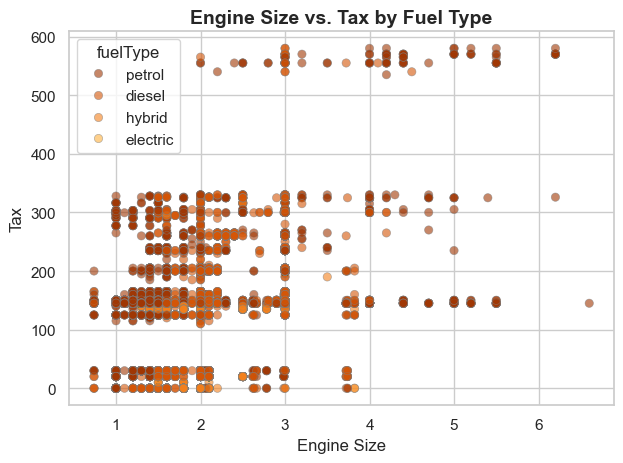

In [65]:

# Scatter plot: engineSize vs. tax, colored by fuelType
sns.scatterplot(data=train_coherent_corrected,
                x='engineSize', y='tax',
                hue='fuelType', palette=sns.color_palette('YlOrBr')[::-1],
                alpha=0.6, edgecolor='gray')

plt.title('Engine Size vs. Tax by Fuel Type', fontsize=14, fontweight='bold')
plt.xlabel('Engine Size')
plt.ylabel('Tax')
plt.tight_layout()
plt.show()


This scatter plot visualizes the realtionship between ``engineSize`` and tax for vehicles by ``fuelType``.

The goal of this graph is to understand whether larger engines are associated with higher tax costs, and to compare tax patterns across fuel types. A general pattern can be seen :
   As the ``engineSize`` increases the tax also does.
   Vehicles with engines sizes between 1.0L and 3.0L and tax between 100 and 300 show the most data concentration.
   Most petrol cars have an ``engineSize`` between 1.0L and 1.8L and most diesel cars have an ``engineSize`` between 1.8L 2.3L
   so we can assume that petrol cars have an ``engineSize`` slightly smaller compared to diesel cars.


Scatter Plot of Price vs. Previous Owners by Brand (Hue = Model)

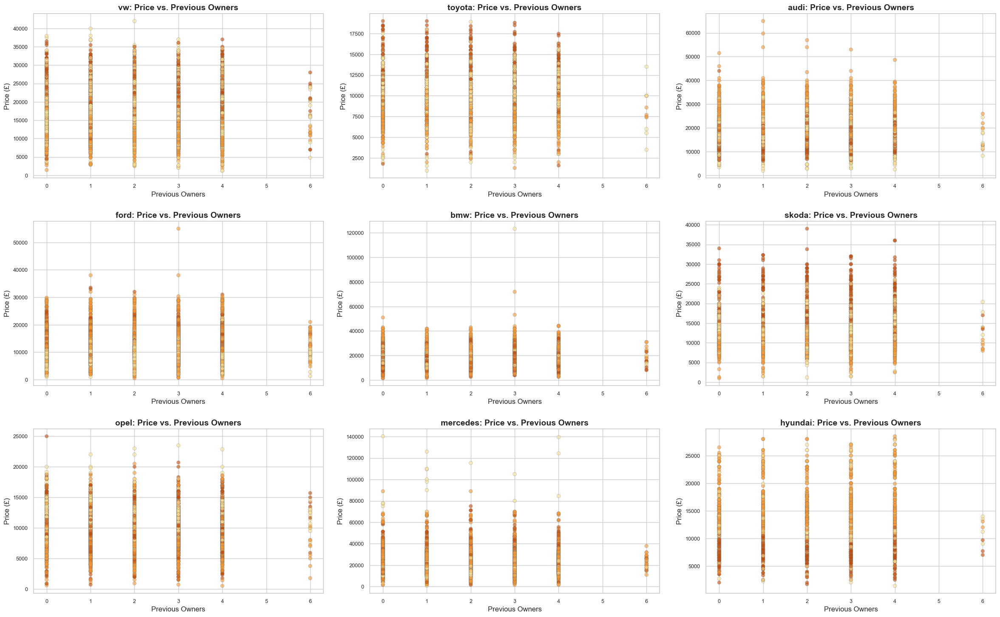

In [66]:

# Get all 9 brands
brands = train_coherent_corrected['Brand'].unique().tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # Optional: limit to top 5 models by frequency
    top_models = brand_data['model'].value_counts().nlargest(3).index
    brand_data = brand_data[brand_data['model'].isin(top_models)]

    # Scatter plot: price vs. previousOwners, colored by model
    sns.scatterplot(data=brand_data,
                    x='previousOwners', y='price',
                    hue='model', ax=ax,
                    palette='YlOrBr', alpha=0.6, edgecolor='gray')

    ax.set_title(f'{brand}: Price vs. Previous Owners', fontsize=14, fontweight='bold')
    ax.set_xlabel('Previous Owners')
    ax.set_ylabel('Price (£)')
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    ax.legend_.remove()  # Hide legend for clarity

# Hide unused subplots (if fewer than 9 brands)
for i in range(len(brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


This scatter plot shows the relationship between the price of vehicles and the number of ``previousOwners`` across different brands. This visualization is informative as it shows how the number of ``previousOwners`` may affect the price of the car. The distribution of data suggests that the price remain consistent across different number of ``previousOwners``. Variation in price can be observed across different brands. vw, toyota, hyundai and skoda show a bigger price variance and bmw, mercedes and ford display a lower price variance.

Scatter Plot of Price vs. Year by Brand (Hue = Model)

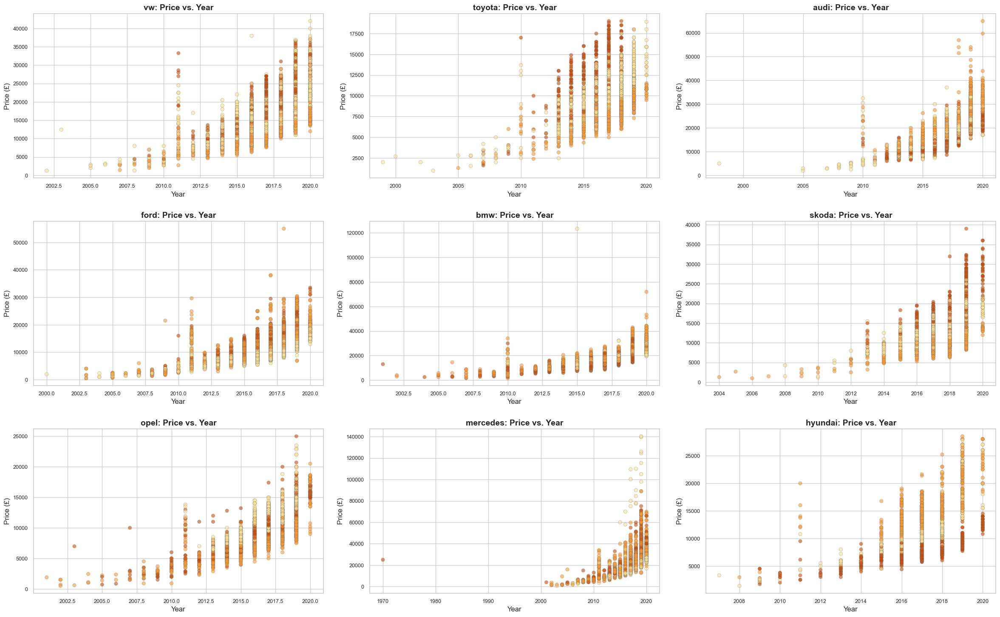

In [67]:

# Get all 9 brands
brands = train_coherent_corrected['Brand'].unique().tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # Optional: limit to top 3 models by frequency
    top_models = brand_data['model'].value_counts().nlargest(3).index
    brand_data = brand_data[brand_data['model'].isin(top_models)]

    # Scatter plot: price vs. year, colored by model
    sns.scatterplot(data=brand_data,
                    x='year', y='price',
                    hue='model', ax=ax,
                    palette='YlOrBr', alpha=0.6, edgecolor='gray')

    ax.set_title(f'{brand}: Price vs. Year', fontsize=14, fontweight='bold')
    ax.set_xlabel('Year')
    ax.set_ylabel('Price (£)')
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    ax.legend_.remove()  # Hide legend for clarity

# Hide unused subplots (if fewer than 9 brands)
for i in range(len(brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


Across this scatter plots it's possbile to conclude that, across all brands, the ``price`` of cars has increased throughout the years. The plot reveals a higher variance of ``price`` across toyota, hyundai, and vw models contrary to mercedes and bmw models that show a low variance. 

Scatter Plot of Price vs. mileage by Brand (Hue = Model)

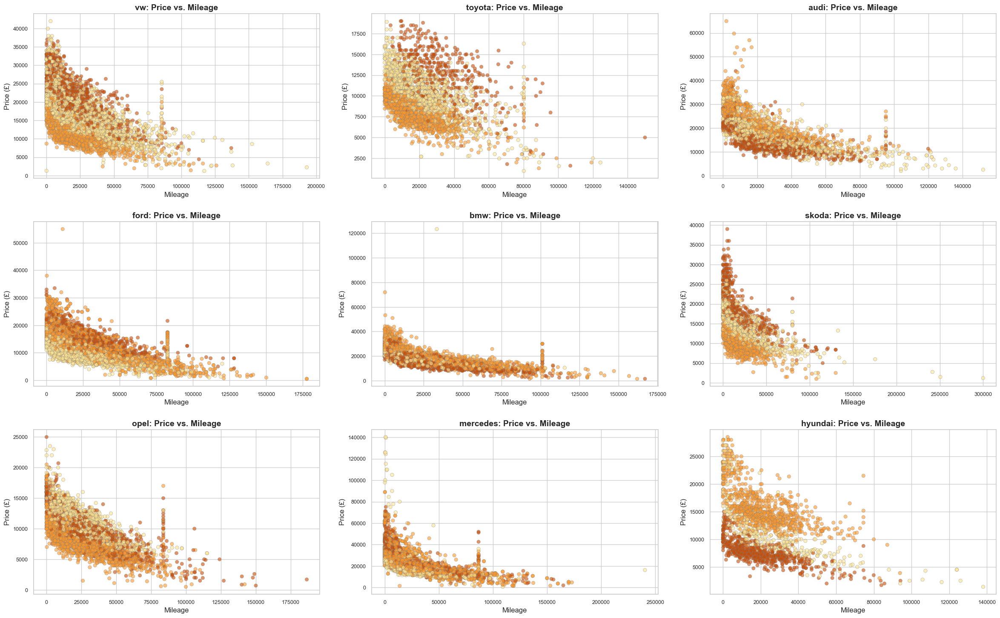

In [68]:

# Get all 9 brands
brands = train_coherent_corrected['Brand'].unique().tolist()

# Set up subplots: 3 rows × 3 columns
fig, axes = plt.subplots(3, 3, figsize=(24, 15))

for ax, brand in zip(axes.flatten(), brands):
    # Filter data for the current brand
    brand_data = train_coherent_corrected[train_coherent_corrected['Brand'] == brand]

    # Optional: limit to top 3 models by frequency
    top_models = brand_data['model'].value_counts().nlargest(3).index
    brand_data = brand_data[brand_data['model'].isin(top_models)]

    # Scatter plot: price vs. year, colored by model
    sns.scatterplot(data=brand_data,
                    x='mileage', y='price',
                    hue='model', ax=ax,
                    palette='YlOrBr', alpha=0.6, edgecolor='gray')

    ax.set_title(f'{brand}: Price vs. Mileage', fontsize=14, fontweight='bold')
    ax.set_xlabel('Mileage')
    ax.set_ylabel('Price (£)')
    ax.tick_params(axis='x', labelsize=9)
    ax.tick_params(axis='y', labelsize=9)
    ax.legend_.remove()  # Hide legend for clarity

# Hide unused subplots (if fewer than 9 brands)
for i in range(len(brands), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout(pad=2.0)
plt.show()


Thoughout the scatter plots it is possible to notice a negative relationship between ``price`` and ``mileage``. While some high-mileage vehicles retain higher prices due to brand or features, the overall trend highlights ``mileage`` as a key factor in vehicle depreciation.

Price vs. Year Colored by Fuel Type

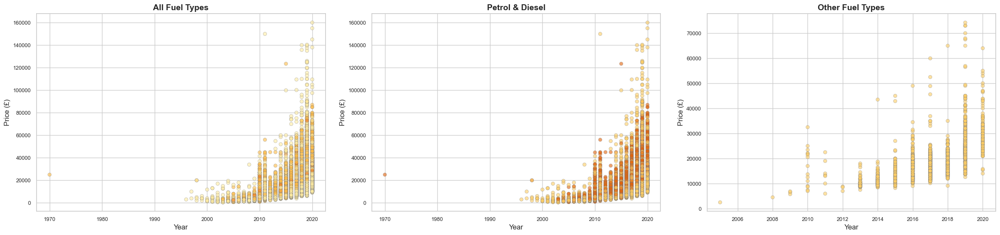

In [69]:
fig, axes = plt.subplots(1, 3, figsize=(24, 6))
fuel_sets = [
    ("All Fuel Types", train_coherent_corrected),
    ("Petrol & Diesel", train_coherent_corrected[train_coherent_corrected['fuelType'].isin(['petrol', 'diesel'])]),
    ("Other Fuel Types", train_coherent_corrected[~train_coherent_corrected['fuelType'].isin(['petrol', 'diesel'])])
]

for ax, (title, data) in zip(axes, fuel_sets):
    sns.scatterplot(data=data, x='year', y='price', hue='fuelType',
                    palette='YlOrBr', alpha=0.6, edgecolor='gray', ax=ax)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel('Year'); ax.set_ylabel('Price (£)')
    ax.tick_params(axis='x', labelsize=9); ax.tick_params(axis='y', labelsize=9)
    ax.legend_.remove()

plt.tight_layout(pad=2.0)
plt.show()


Newer cars are consistently more expensive, with petrol and diesel dominating the full period while alternative fuels (hybrid/electric) only appear in recent years and are concentrated in mid-to-high price ranges.

In this subsection we test whether missing values could be *driving* the relationships we observed.

 We compute **Spearman correlations** for numeric features and **Cramér’s V** for categorical features on the full cleaned dataset.
 
 Then we recompute the same measures after **dropping rows with missing values**.

**Interpretation goal:** if the correlation/association structure changes substantially, then naive row-dropping (or careless imputation) could bias the EDA conclusions. If it remains stable, the main drivers of `price` are robust and can be modeled safely with an imputation strategy.


In [70]:
train_coherent_corrected_dropped=train_coherent_corrected.dropna()

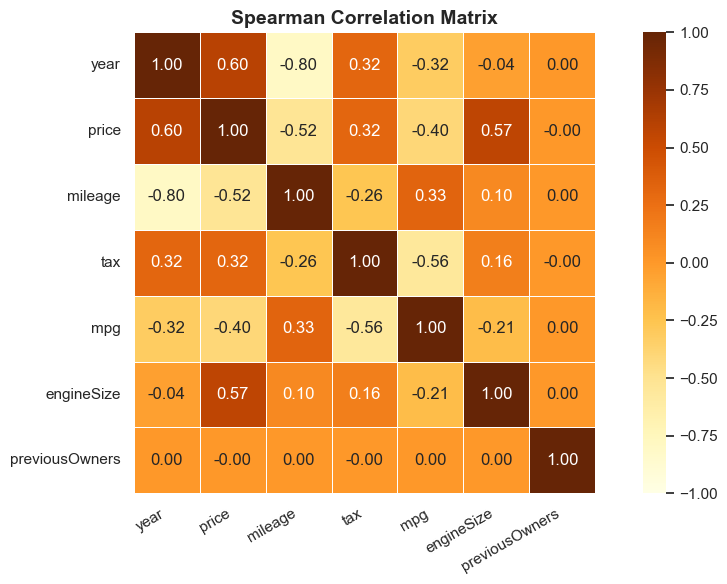

In [71]:
# Compute Spearman correlation matrix
corr = train_coherent_corrected[car_num].corr(method="spearman").round(2)

# Plot heatmap
plt.figure(figsize=(10, 6))

sns.heatmap(corr, annot=True, cmap='YlOrBr', fmt='.2f',
            vmin=-1, vmax=1, center=0, linewidths=0.5, square=True)

plt.title('Spearman Correlation Matrix', fontsize=14, fontweight='bold')
plt.xticks(rotation=30, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

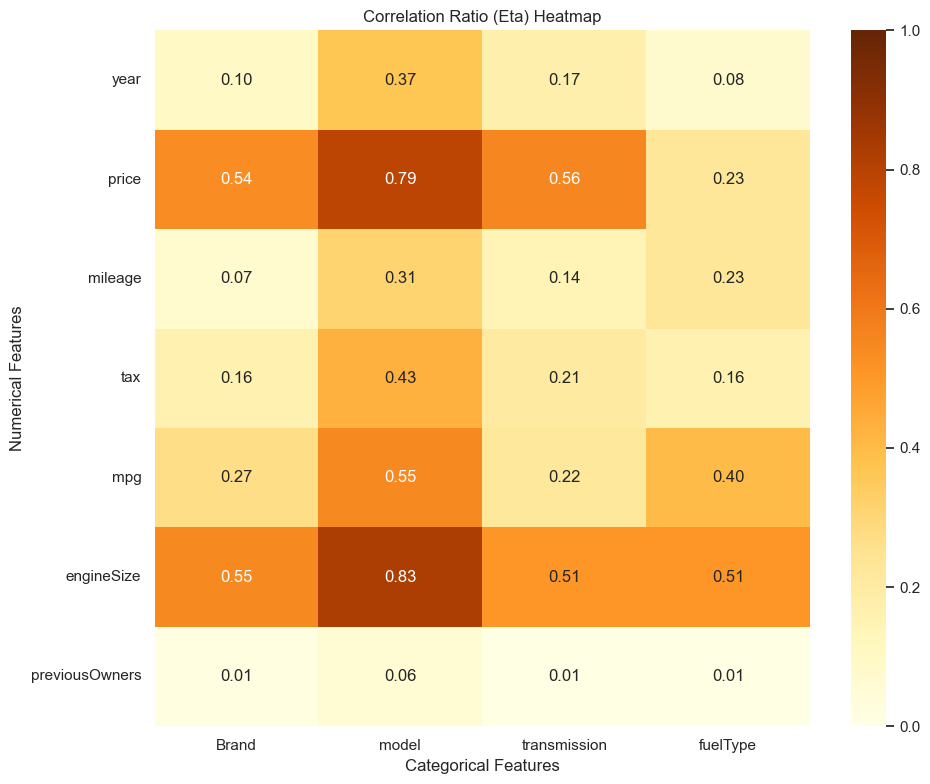

In [72]:
# --- Calculate the Eta Matrix ---
eta_matrix = pd.DataFrame(index=num_features, columns=categorical_cols, dtype=float)

for num_col in num_features:
    for cat_col in categorical_cols:
        eta = correlation_ratio(train_coherent_corrected_dropped[cat_col], train_coherent_corrected_dropped[num_col])
        eta_matrix.loc[num_col, cat_col] = eta

# --- Plot the Heatmap ---
plt.figure(figsize=(10, 8))
sns.heatmap(
    eta_matrix.astype(float), 
    annot=True, 
    fmt='.2f', 
    cmap='YlOrBr', 
    vmin=0, 
    vmax=1
)
plt.title('Correlation Ratio (Eta) Heatmap')
plt.xlabel('Categorical Features')
plt.ylabel('Numerical Features')
plt.tight_layout()
plt.show()

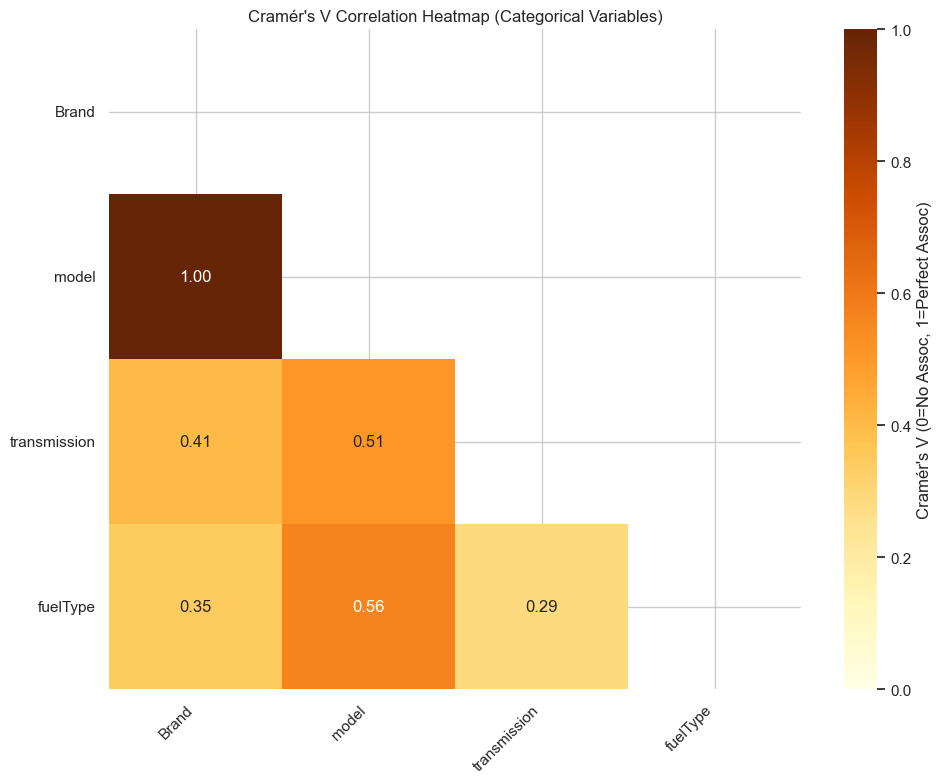

In [73]:
# --- 2. Calculate the Data ---
cramers_df = cramers_v_matrix(train_coherent_corrected_dropped)

# --- 3. Plot the Heatmap ---
plt.figure(figsize=(10, 8))

mask = np.triu(np.ones_like(cramers_df, dtype=bool))

sns.heatmap(
    cramers_df, 
    annot=True, 
    fmt='.2f', 
    cmap='YlOrBr',  
    vmin=0, 
    vmax=1,
    mask=mask,      # Hides the upper triangle to make it cleaner
    cbar_kws={'label': "Cramér's V (0=No Assoc, 1=Perfect Assoc)"}
)

plt.title("Cramér's V Correlation Heatmap (Categorical Variables)")
plt.xticks(rotation=45, ha='right') # Rotates x-labels for better readability
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

 
Overall, the numeric–numeric Spearman correlations and the categorical Cramér’s V associations remain very similar before vs. after dropping rows with missing values. This indicates that the main EDA conclusions are not an artifact of missingness.

### Notable relationships (explicit EDA conclusions for predicting `price`)

1) **Segment identity dominates**  
`model` creates clear price bands and is perfectly nested within `Brand` (**Cramér’s V = 1**), meaning `model` effectively captures brand + segment positioning. This should be treated as a high-signal categorical predictor.

2) **Depreciation signals are strong and monotonic**  
 `year` vs. `price`: Spearman **≈ +0.60** (newer cars tend to be more expensive)  
 `mileage` vs. `price`: Spearman **≈ −0.52** (more mileage → lower price)  
 `year` vs. `mileage`: Spearman **≈ −0.80** (newer cars usually have lower mileage)

3) **Mechanical / emissions proxies add structured signal**  
 `engineSize` vs. `price`: Spearman **≈ +0.57** (strongest positive numeric association)  
 `tax` vs. `price`: Spearman **≈ +0.32** (weaker but consistent)  
 `mpg` vs. `price`: Spearman **≈ −0.39** and `mpg` vs. `tax`: **≈ −0.56** (efficiency relates to taxation and segment)

4) **Lower marginal effect feature**  
`previousOwners` shows weak marginal association with `price`; it is more likely to matter via interactions (e.g., within a `model` × `year` band) rather than as a standalone linear driver.

**Modeling implication:** the EDA points toward non-linearities and interactions (notably `model × depreciation`).


In [74]:
train_coherent_corrected

,Brand,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,previousOwners
0,vw,golf,2016,22290,semi-automatic,28421.0,petrol,NaN,11.417268,2.0,4
1,toyota,yaris,2019,13790,manual,4589.0,petrol,145.0,47.900000,1.5,1
2,audi,q2,2019,24990,semi-automatic,3624.0,petrol,145.0,40.900000,1.5,4
3,ford,fiesta,2018,12500,manual,9102.0,petrol,145.0,65.700000,1.0,<NA>
4,bmw,2 series,2019,22995,manual,1000.0,petrol,145.0,42.800000,1.5,3
...,...,...,...,...,...,...,...,...,...,...,...
75968,mercedes,c class,2015,13498,manual,14480.0,petrol,125.0,53.300000,2.0,0
75969,audi,q3,2013,12495,semi-automatic,52134.0,diesel,200.0,47.900000,2.0,2
75970,toyota,aygo,2017,8399,automatic,11304.0,petrol,145.0,67.000000,1.0,3
75971,audi,q3,2015,12990,manual,69072.0,diesel,125.0,60.100000,2.0,2


## 3. Pre-process the dataset

### Splitting the data

We split the data so that all preprocessing steps and models are fitted only on `X_train`, giving us an unbiased estimate of generalization when we later evaluate on `X_val`.
After fitting, we use the learned parameters (from imputers, feature engineering, encoders, scalerss) to transform both `X_train` and `X_val` with the same mappings, avoiding data leakage and ensuring a consistent feature space.


In [75]:
train_coherent_corrected=clean_basic_data(train_original)

In [76]:
X = train_coherent_corrected.drop('price', axis=1)
y = train_coherent_corrected['price']

X_train, X_val, y_train, y_val = train_test_split(X, y, 
                                                  test_size=0.2, 
                                                  random_state=42)

This code separates the features from the target ``price`` to prepare the dataset for modeling, and then randomly splits it into 80% for training and 20% for validation to prevent overfitting.

### 3.1. Outliers

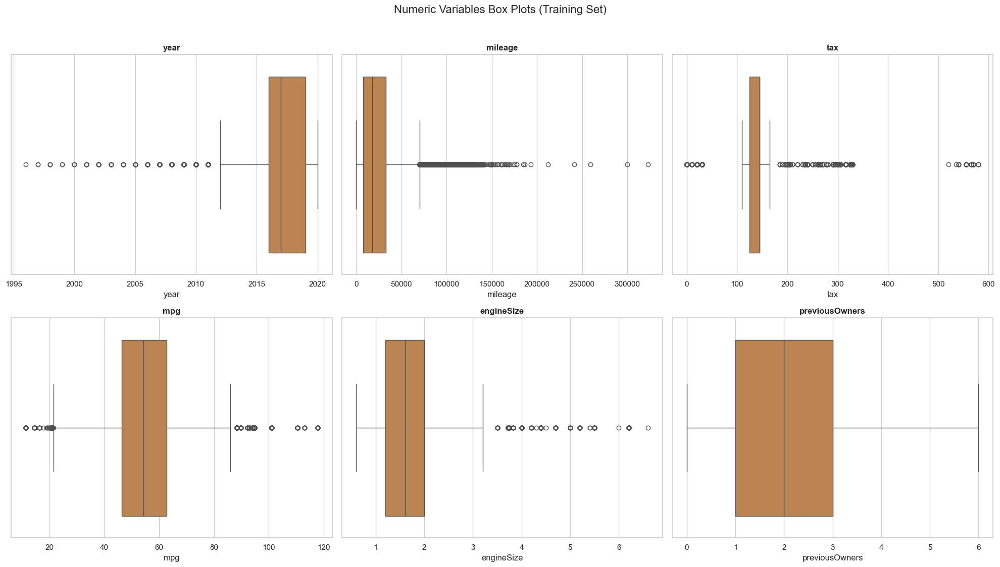

In [77]:
# --- 1. Prepare Data for Visualization ---
df_viz = X_train.copy()

car_num = df_viz.select_dtypes(include=[np.number]).columns.tolist()
# --- 2. Configure Grid ---
sp_rows = 2
sp_cols = ceil(len(car_num) / sp_rows)

fig, axes = plt.subplots(sp_rows, 
                         sp_cols, 
                         figsize=(20, 11),
                         tight_layout=True
                        )

# --- 3. Generate Box Plots ---
for ax, feat in zip(axes.flatten(), car_num):
    # Check if the column exists to avoid errors
    if feat in df_viz.columns:
        sns.boxplot(x=df_viz[feat], ax=ax, color="peru")
        ax.set_title(feat, fontsize=12, fontweight='bold')
    else:
        ax.set_visible(False) # Hide empty plots if the list is smaller than the grid

# Final Layout
plt.suptitle("Numeric Variables Box Plots (Training Set)", fontsize=16, y=1.02)
plt.show()

In [78]:
#calculating the first and third quantile for each numerical column
q1 = df_viz[car_num].quantile(0.25)
q3 = df_viz[car_num].quantile(0.75)

#  interquartile range 
iqr = q3 - q1

# defining lower and upper limit
lower_lim = q1 - (iqr * 1.5)
upper_lim = q3 + (iqr * 1.5)

# filterings rows were all numerical features are inside the interquartile range
filters_iqr_all = df_viz[car_num].apply(
    lambda col: col.between(lower_lim[col.name], upper_lim[col.name], inclusive='neither')
).all(axis=1)

# keeping rows inside interquartile range
df_viz_iqr = df_viz[filters_iqr_all]

print('Percentage of data that we would lose if we removed all the rows with outliers:', 100-(100*(np.round(df_viz_iqr.shape[0] / X_train.shape[0], 3))),'%')

Percentage of data that we would lose if we removed all the rows with outliers: 44.8 %


The boxplots show heavy right tails (notably mileage, but also tax, mpg, engineSize) and a smaller set of older year values; these extremes are plausible in a used-car market.
Removing all IQR-flagged rows would discard 44.8% of the training set, so eliminating them would strongly bias the dataset toward “typical” cars and reduce representativeness.
We interpreted the IQR rule as flagging distributional rarity rather than data mistakes, so most extreme points should be treated as valid observations unless they violate basic domain constraint which we already handled by setting real world proper limits when we corrected data inconsistencies. 
Even though we didn't take outliers has the main focus of our project in the open ended section we still analyzed a global outlier fix and a specific one to check how it would affect our best model.

### 3.2. Imputation

First, we studied how many bins should be created for each variable. We used `create_percentile_bins`to understand how the numerical features were distributed across a maximum of 10 bins (it was decided that 10 bins would be enough to capture the distribution and provide stable grouping keys for imputation).

*Excluding `previousOwners`, since it is already distributed between 0 and 6 (a small interval).

In [79]:
train_vis = clean_basic_data(train_original)
train_vis = create_percentile_bins(train_vis)

columns_to_check = ['year', 'engineSize', 'mpg', 'tax', 'mileage']

# Loop through each column and display the result
for col in columns_to_check:
    print(f"--- Checking Distribution: {col} ---")  
    display(check_bins(train_vis, col))

--- Checking Distribution: year ---
--- Percentile Bins for year ---
           min   max  count
year_bin                   
0.0       1970  2015  12727
1.0       2016  2016  11502
2.0       2017  2017  16146
3.0       2018  2018  10304
4.0       2019  2019  20271
5.0       2020  2020   3174




None

--- Checking Distribution: engineSize ---
--- Percentile Bins for engineSize ---
                     min  max  count
engineSize_bin                      
0.0             0.600000  1.0  13671
1.0             1.100000  1.2   5135
2.0             1.300000  1.4   8352
3.0             1.500000  1.5   9156
4.0             1.600000  1.6   6381
5.0             1.700000  1.8   1810
6.0             1.900000  2.0  20128
7.0             2.064119  2.1   3675
8.0             2.200000  6.6   5631




None

--- Checking Distribution: mpg ---
--- Percentile Bins for mpg ---
               min    max  count
mpg_bin                         
0.0      11.417268   39.2   6856
1.0      39.800000   44.1   6901
2.0      44.600000   47.9   7418
3.0      48.400000   51.4   6613
4.0      52.300000   54.3   6628
5.0      54.400000   57.7   7145
6.0      58.000000   60.1   6473
7.0      61.100000   64.2   6529
8.0      65.600000   68.9   6943
9.0      69.000000  117.7   5984




None

--- Checking Distribution: tax ---
--- Percentile Bins for tax ---
           min    max  count
tax_bin                     
0.0        0.0   20.0   9945
1.0       30.0   30.0   5781
2.0      110.0  135.0   5366
3.0      140.0  145.0  33117
4.0      150.0  150.0   7400
5.0      155.0  580.0   6082




None

--- Checking Distribution: mileage ---
--- Percentile Bins for mileage ---
                 min       max  count
mileage_bin                          
0.0              1.0    2750.0   7425
1.0           2751.0    5823.0   7405
2.0           5824.0    9443.0   7415
3.0           9444.0   13206.0   7412
4.0          13207.0   17416.0   7414
5.0          17417.0   22686.0   7415
6.0          22688.0   29054.0   7414
7.0          29055.0   37000.0   7419
8.0          37001.0   51122.0   7408
9.0          51124.0  323000.0   7414




None

From the outputs, it was decided that only `year` and `engineSize` would need a different approach. We divided the bigger bins into smaller ones to better capture the distribution of the feature, reaching a total of 10 bins for each.

For `tax`, the 6 bins were considered enough since the distribution was already well captured.

Next, based on the correlations between variables observed in the multivariate analysis and some business understanding (`engineSize` and `mpg` are mechanically linked), we defined the imputation_config dictionary that specifies the hierarchy of columns to use for grouping during imputation for each variable with missing values (the hierarchy allows us to fall back to broader groups if a specific group lacks sufficient data points (min_samples=20) or is missing entirely. The `L1`, `L2`, etc. do not always start with `L1` to differentiate between specific imputation and general imputation - this will be useful and better explained in the open-ended section). Finally, we filled the remaining NAs with global defaults as a safety net to ensure no missing values remain.

In [80]:
X_info=X.copy()
y_info=y.copy()
X_info.isna().sum() 

Brand             1521
model             1517
year              1849
transmission      2263
mileage           1832
fuelType          1678
tax               8282
mpg               8483
engineSize        2034
previousOwners    1921
dtype: int64

``fit_nas`` learns and freezes a set of imputation rules from a reference dataset (fit-time), so missing-value decisions are reproducible and not re-learned during transform.

In [81]:
rules={} # initialize rules dictionary 
rules['nas']=fit_nas(X_info)

`transform_nas` applies a pre-learned, frozen set of imputation rules to a new dataset, filling missing values via deterministic brand mappings, ordered hierarchical lookups, and final global defaults, without learning or adapting any rules at transform time.

In [82]:
X_info=transform_nas(X_info,rules['nas'])
X_info.isna().sum() # checking for missing values after transformation

Brand             0
model             0
year              0
transmission      0
mileage           0
fuelType          0
tax               0
mpg               0
engineSize        0
previousOwners    0
dtype: int64

### 3.3. Feature engineering

  In this section we are explaining our way of thinking to do our feature engineering method:

  Feature engineering can expose the underlying signal by transforming raw variables into more informative, model-friendly representations (ratios, interactions, non-linear transforms), often improving accuracy more than swapping algorithms.
It also injects domain structure and reduces noise/collinearity, making models simpler to learn, more stable, and easier to generalize.



In [83]:
X_info.columns # checking current features

Index(['Brand', 'model', 'year', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize', 'previousOwners'],
      dtype='object')

  **fit_feat_engineering_rules** learns *training-only* reference statistics (e.g., `max_year` for `car_age`, `mpg_median`, cohort medians of `miles_per_year` by (`Brand`,`model`,`year`) with fallback to (`Brand`,`model`) when groups are small and stores them in a rules dict.

 


In [84]:
rules['feat'] = fit_feat_engineering_rules(X_info, min_group_n=25)

# rules['feat'] -> {'min_group_n': 25, 'max_year': np.int64(2020), 'mpg_median': np.float64(54.3) ...

**transform_add_all_features** then applies deterministic feature transforms to any dataset (train/val/test): ratios and interactions (`tax_per_litre_engine`, `power_efficiency_ratio`, `tax_efficiency`), log-stabilized composites (`luxury_tax_burden`, `neglect_ratio`), and “relative” deviations vs brand/cohort baselines ( `usage_dev_vs_cohort`).

In [85]:
X_info= transform_add_all_features(X_info, rules['feat'])
X_info.columns # checking current features after feature engineering

Index(['Brand', 'model', 'year', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize', 'previousOwners', 'car_age', 'miles_per_year',
       'tax_per_litre_engine', 'power_efficiency_ratio', 'tax_efficiency',
       'luxury_tax_burden', 'engine_specialization_score',
       'is_high_efficiency', 'usage_dev_vs_cohort'],
      dtype='object')



 This explicit fit/transform split guarantees consistency across splits and avoids leakage (no statistics are re-estimated on validation/test).
 We implemented a broader feature set on purpose to run controlled experiments/ablation: test many candidate signals, quantify its impact and select only the ones that improve generalization.

 Even if the final model uses only a subset, keeping the full library makes the process reproducible, comparable across runs, and easy to extend later.

Overview of the new features created:

 **``car_age``** → Age of the car relative to the newest model in the dataset  

 **``miles_per_year``** → Estimated yearly mileage based on total mileage and vehicle age  

 **``tax_per_litre_engine``** → Tax burden adjusted by engine size  
 
 **``power_efficiency_ratio``** → Balance between engine size and fuel efficiency (performance vs. economy)  
 
 **``tax_efficiency``** → Tax cost relative to fuel efficiency (higher = less fuel-efficient for the same tax level)  
 
 **``luxury_tax_burden``** → Smoothed measure of luxury level based on engine size and tax  
 
 **``engine_specialization_score``** → Indicates whether the car prioritizes power or fuel efficiency  
 
 **``condition_per_age``** → Condition score adjusted for age, identifying well-kept older cars  
 
 **``neglect_ratio``** → Neglect indicator comparing mileage to paint condition  
  
 **``usage_dev_vs_cohort``** → Usage deviation vs typical use for same brand/model/year  
 
 **``model_popularity``** → Popularity ratio of each brand-model in the dataset  
 
 **`is_high_efficiency`** → Binary indicator of “high efficiency” based on **`mpg`** compared to the training **`mpg_median`**

### 3.4. Encoding

In this section we are explaining our way of thinking to do our encoding method:

**Encoding** is essential because most ML algorithms require numerical inputs, it converts categorical values into a representation the model can compute with without arbitrary ordering artifacts.
A good encoding scheme preserves useful information (category differences/target signal) while controlling dimensionality and avoiding leakage, which directly impacts generalization.

#### 3.4.1. Target Encoding


**fit_target_encoder first** creates a copy of the input and concatenates it with y by index (pd.concat on axis=1), so the category values and targets are perfectly row-aligned before computing any statistics.
It computes the global_mean of y, auto-detects categorical columns, and for each column aggregates per-category count and mean via groupby + agg(['count','mean']).
Then it builds a regularized mapping using a logistic shrinkage weight smoothing = 1/(1+exp(-(count − m))) and encodes each category as mean*smoothing + global_mean*(1−smoothing), storing these mappings plus metadata in a rules dictionary.

In [86]:
X_info_TE=X_info.copy()
rules['encoder'] = fit_target_encoder(X_info, y_info) 

# rules['encoder']->  {'global_mean': np.float64(16881.889552867466),
                    # 'categorical_cols': ['Brand', 'model', 'transmission', 'fuelType'],
                    # 'maps': {'Brand': {'audi': 22887.40348525469,
                    #'bmw': 22674.551577830814,'ford': 12605.743527557146, ...



**transform_target_encoder** applies those stored mappings with map, replaces unseen categories (NaN after mapping) with global_mean via fillna, and casts to float so the output is fully numeric and consistent across train/validation/test without re-learning.


In [87]:
X_info_TE=transform_target_encoder(X_info_TE, rules['encoder'])
# Identify affected (categorical) columns
te_cols = rules['encoder']['categorical_cols']

# Display only target-encoded columns
X_info_TE[te_cols]

,Brand,model,transmission,fuelType
0,16871.606867,16773.842372,24307.792934,15015.933455
1,12466.495121,10534.758480,12214.101833,15015.933455
2,22887.403485,22605.675926,24307.792934,15015.933455
3,12605.743528,10232.751914,12214.101833,15015.933455
4,22674.551578,19661.336018,12214.101833,15015.933455
...,...,...,...,...
75968,24469.650391,23723.789396,12214.101833,15015.933455
75969,22887.403485,23352.197507,24307.792934,19195.225061
75970,12466.495121,7948.185947,21486.434159,15015.933455
75971,22887.403485,23352.197507,12214.101833,19195.225061


#### 3.4.2. One-Hot Encoding

Detects categorical columns in the training data and fits a OneHotEncoder(**fit_ohe**) that defines the full dummy-column schema (which binary indicators exist and in what order).


In [88]:
X_info_OHE=X_info.copy()
rules['encoder'] = fit_ohe(X_info_OHE)

# rules['encoder'] -> {'encoder': OneHotEncoder(drop='first', dtype=<class 'bool'>, handle_unknown='ignore',
                        # sparse_output=False),
                        #  'categorical_cols': ['Brand', 'model', 'transmission', 'fuelType']}


Uses drop='first' to avoid redundant levels and handle_unknown='ignore' so unseen categories at inference time do not cause errors.

At **transform_ohe**, applies the fitted encoder to produce the encoded matrix, retrieves the generated feature names, and builds an aligned DataFrame with the same index.



In [89]:
X_info_OHE = transform_ohe(X_info_OHE, rules['encoder'])

# Extract encoder and categorical columns from nested rules
ohe = rules['encoder']['encoder']
categorical_cols = rules['encoder']['categorical_cols']

# Get OHE feature names
ohe_cols = ohe.get_feature_names_out(categorical_cols)

# Display only one-hot encoded columns
X_info_OHE[ohe_cols]


,Brand_bmw,Brand_ford,Brand_hyundai,Brand_mercedes,Brand_opel,Brand_skoda,Brand_toyota,Brand_vw,model_2 series,model_200,...,model_yeti outdoor,model_z3,model_z4,model_zafira,model_zafira tourer,transmission_manual,transmission_semi-automatic,fuelType_electric,fuelType_hybrid,fuelType_petrol
0,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,True,False,False,True
1,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,True
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,True
3,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,True
4,True,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,True,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75968,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,True
75969,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
75970,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,True
75971,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False


In [90]:
print(X_info_OHE.columns.tolist())


['year', 'mileage', 'tax', 'mpg', 'engineSize', 'previousOwners', 'car_age', 'miles_per_year', 'tax_per_litre_engine', 'power_efficiency_ratio', 'tax_efficiency', 'luxury_tax_burden', 'engine_specialization_score', 'is_high_efficiency', 'usage_dev_vs_cohort', 'Brand_bmw', 'Brand_ford', 'Brand_hyundai', 'Brand_mercedes', 'Brand_opel', 'Brand_skoda', 'Brand_toyota', 'Brand_vw', 'model_2 series', 'model_200', 'model_220', 'model_230', 'model_3 series', 'model_4 series', 'model_5 series', 'model_6 series', 'model_7 series', 'model_8 series', 'model_a', 'model_a class', 'model_a1', 'model_a2', 'model_a3', 'model_a4', 'model_a5', 'model_a6', 'model_a7', 'model_a8', 'model_accent', 'model_adam', 'model_agila', 'model_amarok', 'model_ampera', 'model_antara', 'model_arteon', 'model_astr', 'model_astra', 'model_auris', 'model_avensis', 'model_aygo', 'model_b class', 'model_b-max', 'model_beetle', 'model_c clas', 'model_c class', 'model_c-hr', 'model_c-max', 'model_caddy', 'model_california', 'mo

Finally, concatenates the untouched numerical columns with the encoded columns, yielding a fully numeric, fixed-column design matrix consistent across train/validation/test.

#### 3.4.3. Ordinal Encoding

Detects categorical columns in the training data(**train_oe**) and fits an OrdinalEncoder that stores a category→integer code mapping per feature.

Uses handle_unknown='use_encoded_value' with unknown_value=-1 so any unseen category is encoded deterministically instead of crashing.

At **transform_oe**, replaces each categorical column by its integer codes (one column per original feature), returning a low-dimensional numeric representation.

In the end, concatenates these encoded categorical columns with the numerical columns, ensuring the mapping is frozen from training only (no leakage) and consistent across splits.

In [91]:
X_info_OE=X_info.copy()
rules['encoder'] = fit_oe(X_info_OE)

# rules['encoder'] -> fit_oe: Found categorical columns: ['Brand', 'model', 'transmission', 'fuelType']
                        # {'encoder': OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),
                        #  'categorical_cols': ['Brand', 'model', 'transmission', 'fuelType']}

In [92]:
# Apply ordinal encoding once
X_info_OE = transform_oe(X_info, rules['encoder'])

# Display only the encoded columns
categorical_cols = rules['encoder']['categorical_cols']
X_info_OE[categorical_cols]


,Brand,model,transmission,fuelType
0,8,80,2,3
1,7,194,1,3
2,0,130,2,3
3,2,64,1,3
4,1,1,1,3
...,...,...,...,...
75968,4,37,1,3
75969,0,131,2,0
75970,7,32,0,3
75971,0,131,1,0


### 3.5. Scalling


In this section we are explaining our way of thinking to do our scaling method:

This step is very important because many algorithms are sensitive to the magnitude of feature values. When features have different scales models can make mistakes so this prevents large-scale features dominating small-scale ones, improves training speed and stability so it ensures that all features contribute fairly improving model accuracy.

The function pair is split into fit and transform to prevent leakage: **fit_scaler** learns scaling parameters (median and IQR per numeric column) only on the training split, and stores them plus the exact list of numeric columns in a rules object.




In [93]:
rules['scaler']=fit_scaler(X_info)

# rules['scaler'] ->    {'scaler': RobustScaler(),
                            #  'num_cols': ['year','mileage','tax', 'mpg',
                            #   'engineSize', 'previousOwners','car_age',
                            #   'miles_per_year', 'tax_per_litre_engine',
                            #   'power_efficiency_ratio', 'tax_efficiency',
                            #   'luxury_tax_burden', 'engine_specialization_score',
                            #   'is_high_efficiency', 'usage_dev_vs_cohort']}

Then **transform_scaler** uses those stored rules to apply the same learned mapping to any dataset (train/val/test), ensuring consistency across folds and a fair evaluation.


In [94]:
# Apply the scaler to X_info using the stored scaler in rules
X_info_scaled = transform_scaler(X_info, rules['scaler'])
# Automatically detect numeric columns in X_info
rules['num_cols'] = X_info.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Automatically detect numeric columns in X_info
scaled_cols = rules['num_cols']

X_info_scaled[scaled_cols] # Display only the scaled numeric columns

,year,mileage,tax,mpg,engineSize,previousOwners,car_age,miles_per_year,tax_per_litre_engine,power_efficiency_ratio,tax_efficiency,luxury_tax_burden,engine_specialization_score,is_high_efficiency,usage_dev_vs_cohort
0,-0.333333,0.437959,0.09375,-2.731384,0.500,1.0,0.333333,0.189888,-0.018667,9.332478,4.067855,0.495673,1.101902,1.0,-0.203695
1,0.666667,-0.518113,0.00000,-0.407643,-0.125,-0.5,-0.666667,-0.618531,0.404444,0.102500,0.394111,0.050641,0.238539,0.0,-0.111081
2,0.666667,-0.556826,0.00000,-0.853503,-0.125,1.0,-0.666667,-0.733604,0.404444,0.446372,0.678405,0.050641,0.486301,0.0,-0.130124
3,0.333333,-0.337064,0.00000,0.726115,-0.750,0.0,-0.333333,-0.442166,1.306667,-0.930131,0.549601,-0.533917,-1.041126,0.0,-0.564508
4,0.666667,-0.662093,0.00000,-0.732484,-0.125,0.5,-0.666667,-1.046506,0.404444,0.341913,0.592045,0.050641,0.438086,0.0,-0.442627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75968,-0.666667,-0.121314,-0.62500,-0.063694,0.500,-1.0,0.666667,-0.590190,-0.233333,0.500821,-0.301805,0.251690,0.483986,0.0,-1.393569
75969,-1.333333,1.389257,1.71875,-0.407643,0.500,0.0,1.333333,0.388445,0.466667,0.772232,0.451390,0.930967,0.689205,0.0,-0.024098
75970,0.000000,-0.248726,0.00000,0.808917,-0.750,0.5,0.000000,-0.491772,1.306667,-0.949079,0.514354,-0.533917,-1.073652,0.0,-0.415502
75971,-0.666667,2.068761,-0.62500,0.369427,0.500,0.0,0.666667,1.579776,-0.233333,0.228423,-0.411009,0.251690,0.130898,0.0,1.460365


Using RobustScaler specifically makes the scaling less sensitive to outliers than mean/standard-deviation scaling, which stabilizes many models and comparisons.

This modular “learn once, reuse everywhere” design also makes the preprocessing reproducible and easy to plug into pipelines without recomputing statistics on validation/test.

## 4. Feat selection

In this section we are checking what are the features that contribute more to price prevision. So first we check the raw data to view the existing correlations.

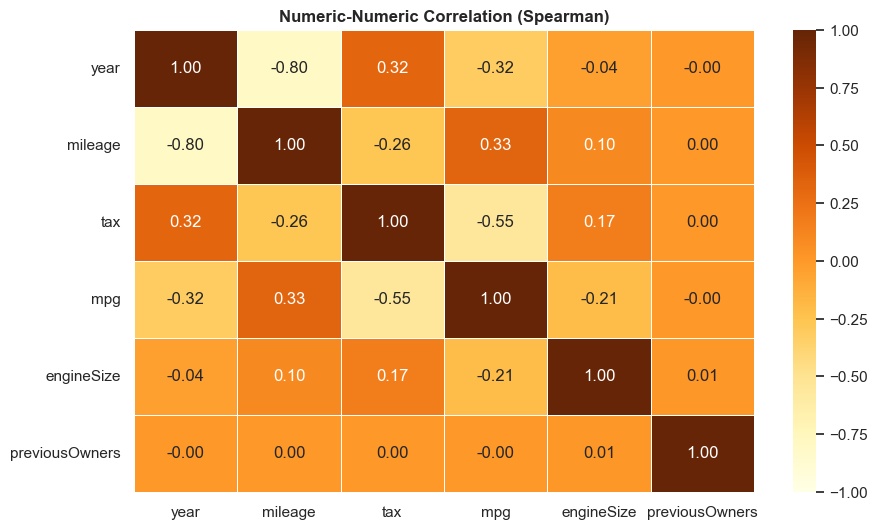

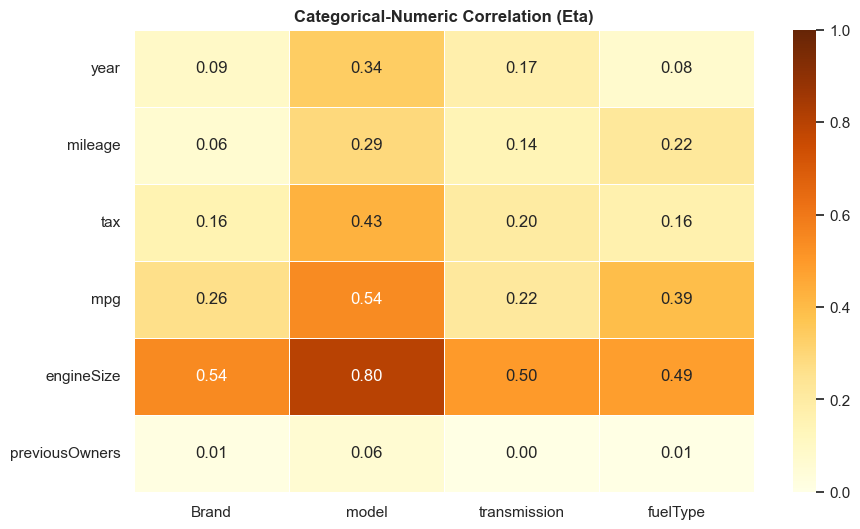

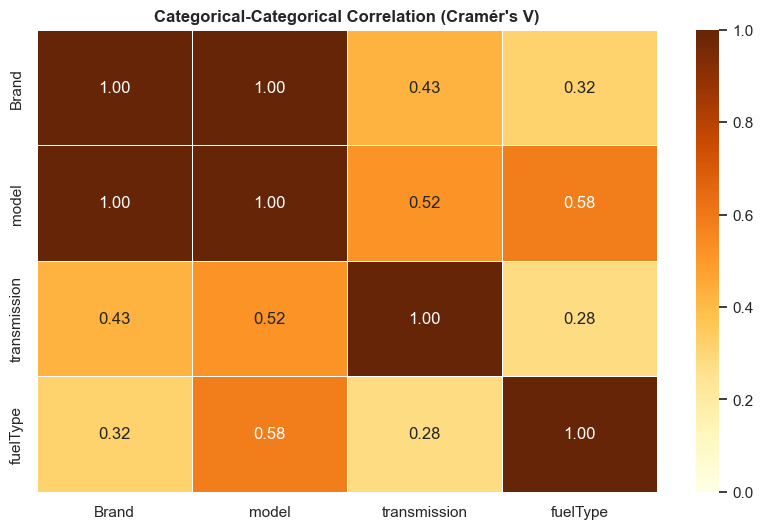

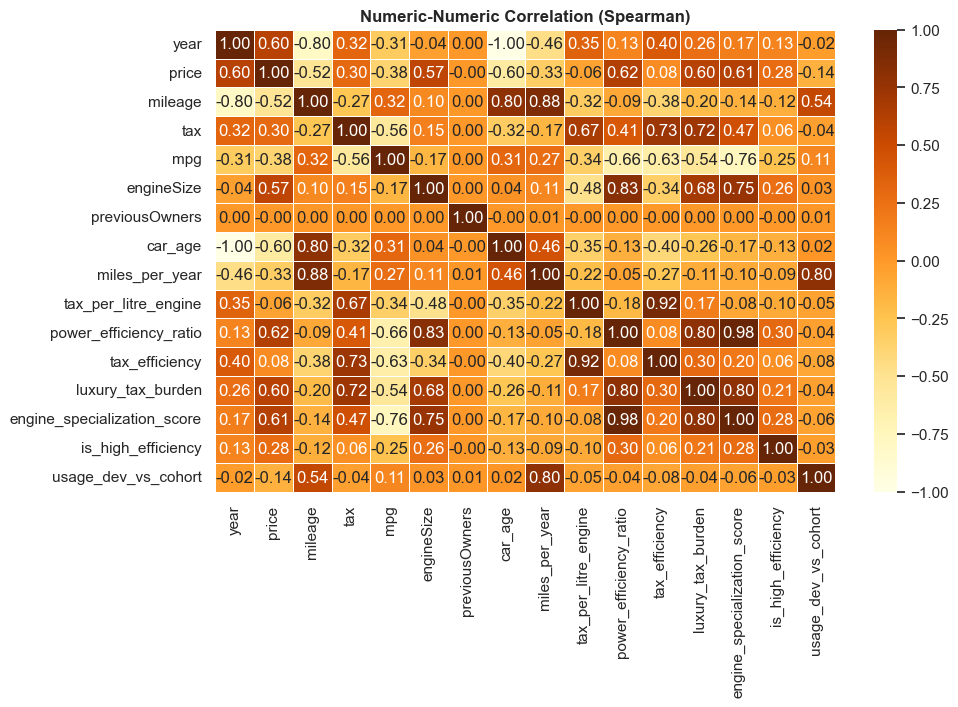

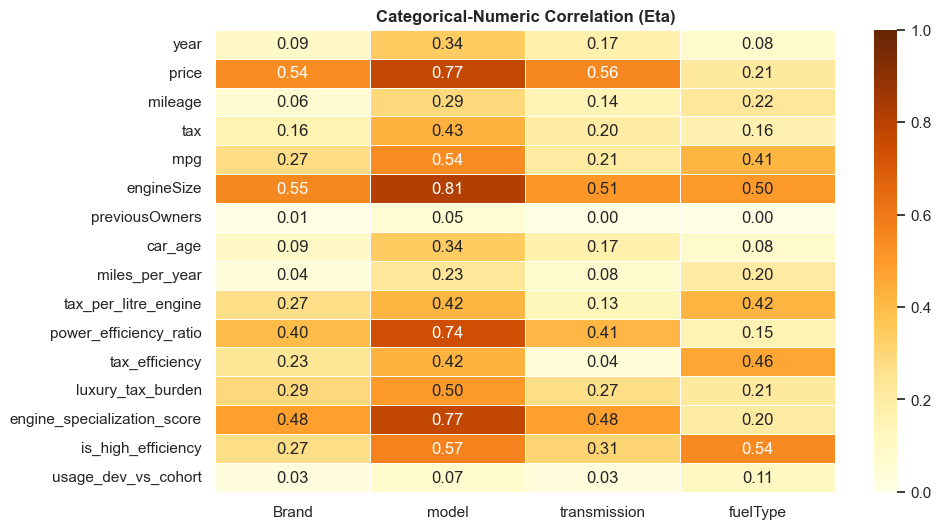

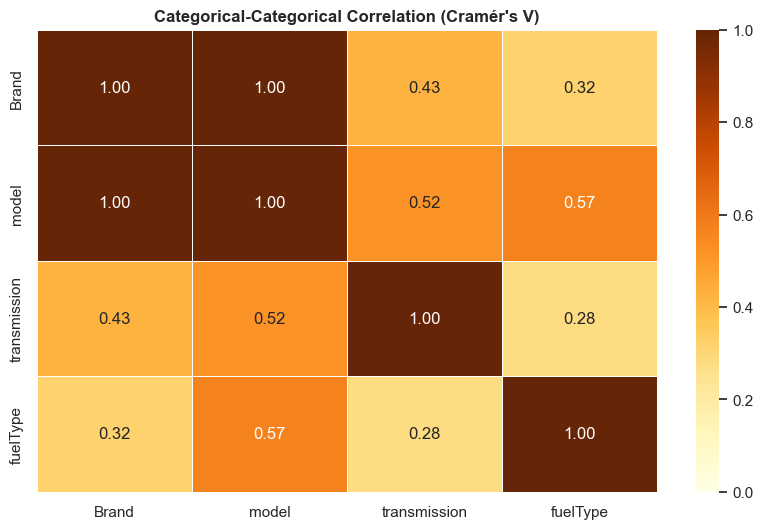

In [ ]:

 
# 1) Correlations on RAW (before encoding/engineering)
correlation_matrices(X_train)

# 2) Correlations on TRANSFORMED feature space (before feature selection)
train_vis = clean_basic_data(train_original)
train_vis_rules = fit_nas(train_vis)
train_vis = transform_nas(train_vis, train_vis_rules)
train_vis_rules = fit_feat_engineering_rules(train_vis)
train_vis = transform_add_all_features(train_vis , train_vis_rules)
correlation_matrices(train_vis)

The numeric Spearman matrix shows expected structure: year vs car_age is essentially perfectly correlated (≈−1), while mileage relates strongly to usage-derived features (miles_per_year), indicating redundancy mainly within time and usage representations.

Several engineered variables are highly collinear with each other (e.g., power_efficiency_ratio with engine_specialization_score, and strong links among tax-derived metrics), so keeping all of them may be unnecessary unless each adds distinct predictive value.

Categorical–categorical (Cramér’s V) and categorical–numeric (Eta) highlight that model is the strongest driver of variation across many numerics (notably engineSize and price), with Brand and transmission also contributing meaningfully.

Importantly, fuelType is not redundant with a single other feature: its associations are only moderate (Cramér’s V with transmission ≈0.28 and with model ≈0.57), meaning it contributes complementary information and should not be dropped as a duplicate.

-> Training HistGradientBoostingRegressor for importance analysis...
-> Calculating Permutation Importance (this may take a minute)...


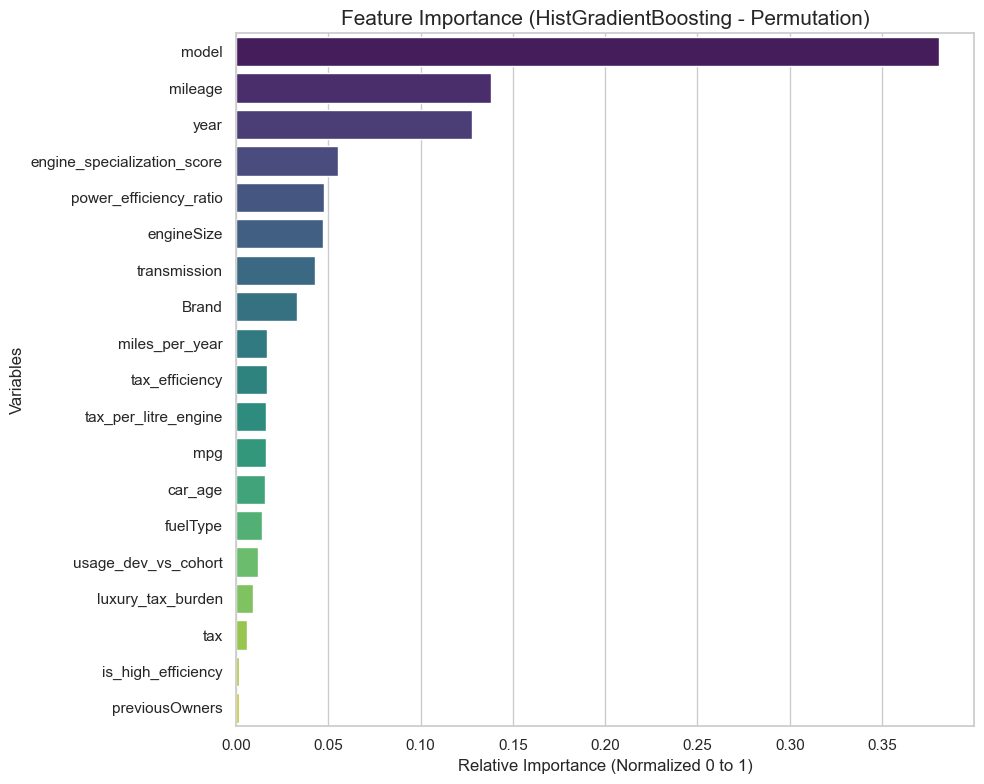

                        Feature  Importance
1                         model    0.380737
4                       mileage    0.138280
2                          year    0.127657
16  engine_specialization_score    0.055217
13       power_efficiency_ratio    0.047703
8                    engineSize    0.047306
3                  transmission    0.043110
0                         Brand    0.033086
11               miles_per_year    0.017048
14               tax_efficiency    0.016775
12         tax_per_litre_engine    0.016283
7                           mpg    0.016060
10                      car_age    0.015968
5                      fuelType    0.014245
18          usage_dev_vs_cohort    0.012217
15            luxury_tax_burden    0.009077
6                           tax    0.006022
17           is_high_efficiency    0.001731
9                previousOwners    0.001477


In [96]:
# --- 1. SETUP MODEL ---
print("-> Training HistGradientBoostingRegressor for importance analysis...")
# Using good general parameters
hgb_explainer = HistGradientBoostingRegressor(
    max_iter=2000, learning_rate=0.2, max_depth=10,
    max_leaf_nodes=40, min_samples_leaf=5, l2_regularization=0.2,
    max_features=0.7, random_state=42
)

train_vis, rules_trees = fit_processing_rules_trees(X_train, y_train)
train_vis = apply_pipeline_for_feat_importance(X_train, rules_trees)# Fit on your processed training data
# Ensure X_train_trees and y_train are available
hgb_explainer.fit(train_vis, y_train)

# --- 2. CALCULATE IMPORTANCE ---
# Since there is no .feature_importances_, we use permutation_importance.
# It measures how much the score drops when a feature is scrambled.
# We test this on the Training set to mimic the behavior of RF's feature_importances_
print("-> Calculating Permutation Importance (this may take a minute)...")
result = permutation_importance(
    hgb_explainer, 
    train_vis,      # Using train set to match RF's logic of "what did it learn?"
    y_train, 
    n_repeats=10, 
    random_state=42, 
    n_jobs=-1
)

# --- 3. ORGANIZE DATA ---
# normalize importances so they sum to 1 (like Random Forest) for easier comparison
raw_importance = result.importances_mean
normalized_importance = raw_importance / raw_importance.sum()

importances = pd.DataFrame({
    'Feature': train_vis.columns,
    'Importance': normalized_importance
})

# Sort descending
importances = importances.sort_values(by='Importance', ascending=False)

# --- 4. VISUALIZE ---
plt.figure(figsize=(10, 8))
sns.set_style("whitegrid")

sns.barplot(
    data=importances,
    x='Importance',
    y='Feature',
    palette='viridis',
    hue='Feature',
    legend=False
)

plt.title('Feature Importance (HistGradientBoosting - Permutation)', fontsize=15)
plt.xlabel('Relative Importance (Normalized 0 to 1)', fontsize=12)
plt.ylabel('Variables', fontsize=12)
plt.tight_layout()
plt.show()

# 5. Show text table
print(importances)

We performed feature selection using **Permutation Importance** computed on a **HistGradientBoostingRegressor**. Permutation importance measures how much predictive performance degrades when a feature is randomly shuffled; therefore, larger values indicate stronger contribution to error reduction. We retained variables with **Importance > 0.015** as the main signal carriers, and reviewed engineered features against their raw counterparts to decide what to keep for a simpler and more informative feature set.



1) Evidence that Feature Engineering adds value (engineered > raw)
**Tax-related effects.**  

The raw `tax` variable received very low importance (**0.006**), while the engineered metrics `tax_efficiency` (**0.017**) and `tax_per_litre_engine` (**0.016**) ranked substantially higher. This suggests that the model learns price more effectively from *tax expressed relative to vehicle characteristics* (e.g., engine displacement / efficiency) than from the absolute tax value alone.  
**Decision:** drop raw `tax`; keep `tax_efficiency` and `tax_per_litre_engine`.

**Efficiency-related effects.**  
`power_efficiency_ratio` (**0.048**) outranked raw `mpg` (**0.016**). This indicates that price is better explained by a joint measure of “performance per consumption” than by fuel economy alone.  
**Decision:** keep both (`mpg` still contributes), but prioritize the ratio feature.



2) Removing redundancy (keep the stronger representation)

**Time / age information.**  
`year` (**0.13**) and `car_age` (**0.012**). Since both encode the same underlying temporal dimension, keeping both is unnecessary and may increase redundancy without adding signal. However we maintained `car_age` after checking model performance.
**Decision:** keep `car_age`; remove `year`.

**Usage intensity.**  
Raw `mileage` (**0.14**) clearly dominates engineered usage summaries such as `miles_per_year` (**0.017**) and `usage_dev_vs_cohort` (**0.007**). This implies that the model can already extract most usage-related signal from the raw odometer value, and the engineered variants do not provide enough incremental value to justify added complexity.  
**Decision:** keep `mileage`; remove `miles_per_year` and `usage_dev_vs_cohort`.



3) Noise reduction (remove weak contributors)

Several variables consistently showed negligible importance (e.g., `< 0.01`), including `luxury_tax_burden`, `previousOwners`, and `is_high_efficiency`. These features appear to add little predictive signal under the current pipeline and may introduce variance/overfitting risk.  
**Decision:** remove low-importance features below the noise threshold.


4) Special case: `engine_specialization_score`

A key result is that `engine_specialization_score` is **comparable in importance to `engineSize`** (≈ **0.045** each). This is notable because it is rare for an engineered feature to match the explanatory power of a strong physical variable.  
**Interpretation:** the score likely captures a *qualitative engine/trim segment* (e.g., high-performance small engines vs. large engines tuned for economy), providing information beyond displacement alone.  
**Decision:** **keep** `engine_specialization_score` (it carries substantial, non-redundant signal).


Summary of decisions (rule-based)

 **Keep (strong signal):** `year`, `mileage`, `engineSize`, `engine_specialization_score`, `power_efficiency_ratio`, `tax_efficiency`, `tax_per_litre_engine`, and other features with Importance > 0.015.
**Drop (redundant/weak):** `tax` (replaced by tax-derived metrics), `car_age` (redundant with `year`), `miles_per_year` / `usage_dev_vs_cohort` (dominated by `mileage`), and very low-importance variables (< 0.005).

Overall, the selected feature set preserves the dominant raw drivers while keeping only engineered features that demonstrably improve the model’s ability to explain price variation.


,Feature,Importance,CumImportance
0,model,0.330803,0.330803
1,year,0.158533,0.489336
2,mileage,0.125683,0.615019
3,engineSize,0.058103,0.673122
4,transmission,0.052816,0.725938
5,engine_specialization_score,0.042666,0.768603
6,Brand,0.039362,0.807965
7,power_efficiency_ratio,0.035030,0.842995
8,car_age,0.028346,0.871341
9,fuelType,0.023050,0.894391


Selected 15 features (CumImportance ≤ 0.95, min=15).

PI-FS performance (using selected features):
Train MAE: 1119.731 | Train R²: 0.9709
Val   MAE: 1325.159 | Val   R²: 0.9527


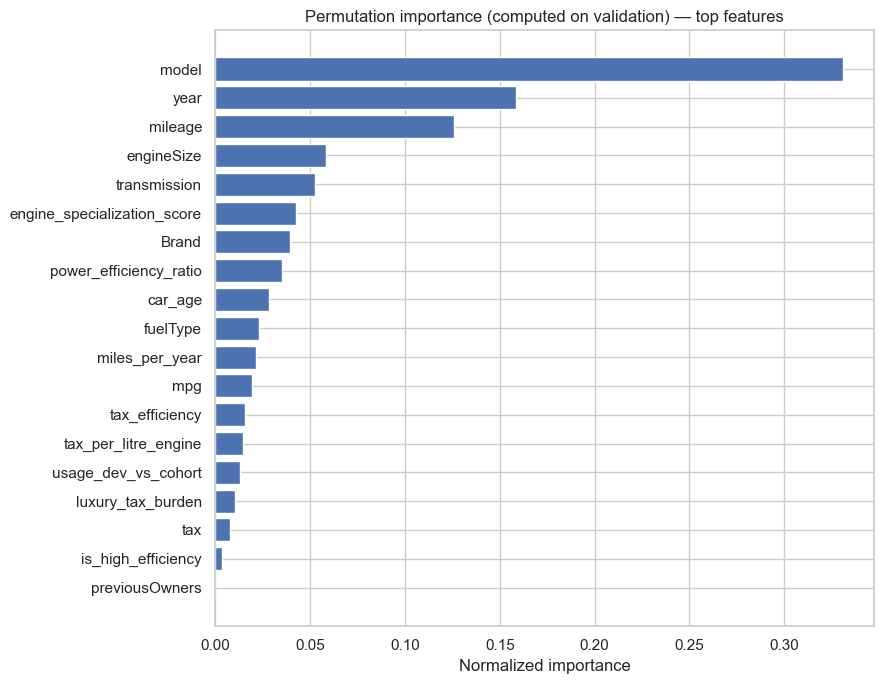

In [97]:

# ============================================================
# Permutation-Importance Feature Selection (PI-FS)
# - Fit explainer on transformed TRAIN
# - Compute permutation importance on transformed VAL (more honest)
# - Select features by cumulative importance (e.g., 95%)
# - Refit/evaluate using only selected features
# ============================================================

# --- A) Build transformed TRAIN/VAL (NO feature selection)
_, rules_trees = fit_processing_rules_trees(X_train, y_train)

Xtr = apply_pipeline_for_feat_importance(X_train, rules_trees)
Xva = apply_pipeline_for_feat_importance(X_val,   rules_trees)

# align schema (important after encoding/FE)
Xva = Xva.reindex(columns=Xtr.columns, fill_value=0)

# --- B) Fit explainer model (same class you used)
explainer_params = dict(
    max_iter=2000, learning_rate=0.2, max_depth=10,
    max_leaf_nodes=40, min_samples_leaf=5, l2_regularization=0.2,
    max_features=0.7, random_state=42
)
hgb_explainer = HistGradientBoostingRegressor(**explainer_params).fit(Xtr, y_train)

# --- C) Permutation importance on VAL (scoring = neg MAE)
pi = permutation_importance(
    hgb_explainer,
    Xva, y_val,
    scoring="neg_mean_absolute_error",
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

imp = np.maximum(pi.importances_mean.astype(float), 0.0)
imp = imp / imp.sum() if imp.sum() > 0 else imp

imp_df = (pd.DataFrame({"Feature": Xtr.columns, "Importance": imp})
            .sort_values("Importance", ascending=False)
            .reset_index(drop=True))
imp_df["CumImportance"] = imp_df["Importance"].cumsum()

display(imp_df.head(30))

# --- D) Feature selection rule (cumulative importance)
KEEP_CUM  = 0.95   # keep features explaining 95% of total importance
MIN_FEATS = 15     # safety: never keep fewer than this

selected = imp_df.loc[imp_df["CumImportance"] <= KEEP_CUM, "Feature"].tolist()
if len(selected) < MIN_FEATS:
    selected = imp_df.head(MIN_FEATS)["Feature"].tolist()

print(f"Selected {len(selected)} features (CumImportance ≤ {KEEP_CUM}, min={MIN_FEATS}).")

# --- E) Refit + evaluate using selected features only
Xtr_sel = Xtr[selected]
Xva_sel = Xva[selected]

hgb_fs = HistGradientBoostingRegressor(**explainer_params).fit(Xtr_sel, y_train)

pred_tr = hgb_fs.predict(Xtr_sel)
pred_va = hgb_fs.predict(Xva_sel)

print("\nPI-FS performance (using selected features):")
print(f"Train MAE: {mean_absolute_error(y_train, pred_tr):.3f} | Train R²: {r2_score(y_train, pred_tr):.4f}")
print(f"Val   MAE: {mean_absolute_error(y_val,   pred_va):.3f} | Val   R²: {r2_score(y_val,   pred_va):.4f}")

# --- F) Quick visuals (different from your previous plotting structure)
TOP_SHOW = 25

plt.figure(figsize=(9, 7))
plt.barh(imp_df.head(TOP_SHOW)["Feature"][::-1], imp_df.head(TOP_SHOW)["Importance"][::-1])
plt.title("Permutation importance (computed on validation) — top features")
plt.xlabel("Normalized importance")
plt.tight_layout()
plt.show()


# Keep for later
selected_features_pi = selected


Overall, the validation-based permutation importance confirms our main conclusions model and mileage dominate, engineered efficiency and engine-specialization features add signal, raw tax is weak but as explained before we maintain it.

**In conclusion**: after analyzing linear relationships (correlation heatmaps) and non-linear contributions (permutation importance), we performed feature selection balancing predictive importance and redundancy control.
This led us to retain a compact set of 12 variables that preserve the strongest signal while keeping complementary engineered effects.
Final features kept: model, mileage, engineSize, transmission, engine_specialization_score, Brand, power_efficiency_ratio, car_age, fuelType, miles_per_year, mpg

## 5. Going to models

With this sections of pre-processing and feature selection explained, we will now head to a different notebook called Group03_models which contains all of our models.

---
---

## 6. Open ended section

This open-ended section goes beyond aggregate MAE/R² by extracting actionable evidence from the trained pipeline: what drives predictions, where errors concentrate, and how the workflow behaves when used for inference on new data.  

All analyses reuse the same train/validation split and apply preprocessing fitted only on the training data, ensuring fair comparisons and avoiding leakage.  

Using the tuned HistGradientBoostingRegressor on the processed feature space yields strong generalization, with a modest train–validation gap consistent with a flexible non-linear learner.  


In [98]:
X_train_trees, pipeline_rules_train_trees = fit_processing_rules_trees(X_train, y_train)
X_val_trees = transform_processing_rules_trees(X_val, pipeline_rules_train_trees)
X_test_trees = transform_processing_rules_trees(test, pipeline_rules_train_trees)

We first apply the full preprocessing pipeline **fit on the training set** and **transform on both train and validation**, guaranteeing identical feature space and preventing information leakage.  

Then we train the tuned HistGradientBoostingRegressor and report train vs validation metrics as a sanity check.

In [99]:
# Tuned params you got
best_hgb_params = {
    "l2_regularization": 0.17633404991959004,
    "learning_rate":     0.017070444149286466,
    "max_depth":         12,
    "max_features":      0.4274228023694364,
    "max_iter":          9073,
    "max_leaf_nodes":    242,
    "min_samples_leaf":  3,
}

hgb_model = HistGradientBoostingRegressor(
    **best_hgb_params,
    random_state=42,
    # early_stopping=True,   # optional
)

# Fit
hgb_model.fit(X_train_trees, y_train)

# Train metrics
y_train_pred = hgb_model.predict(X_train_trees)
print("Training MAE:", mean_absolute_error(y_train, y_train_pred))
print("Training R2 :", r2_score(y_train, y_train_pred))

# Val metrics
y_val_pred = hgb_model.predict(X_val_trees)
print("Validation MAE:", mean_absolute_error(y_val, y_val_pred))
print("Validation R2 :", r2_score(y_val, y_val_pred))


Training MAE: 920.3213889676969
Training R2 : 0.9801636435542219
Validation MAE: 1210.6222684720476
Validation R2 : 0.9584309985420539


### 6.1. Analytics interface for new predictions & Outlier analysis


Our goal is to expose the trained model as a reproducible inference procedure: input a raw car record (original schema) and output a price prediction.

We reuse the *training-fitted* preprocessing objects (imputers, feature engineering steps, encoders/scalers, and selected feature set), so inference is consistent with training and does not depend on ad-hoc manual transformations.


In [100]:
new_car = {
    "Brand": "BMW",
    "model": "3 Series",
    "year": 2012,
    "engineSize": 2.0,
    "mpg": 48.7,
    "mileage": 42000,
    "fuelType": "Diesel",
    "transmission": "Automatic",
    "tax": 145,
    "previousOwners": 1,
    "hasDamage": 0
}

pred = predict_price(new_car, hgb_model, pipeline_rules_train_trees, X_train_trees.columns)
print(f"Predicted price: {pred[0]:,.0f}")


Predicted price: 11,374


Using a realistic example input (2012 BMW 3 Series, 2.0L diesel, automatic, 42000 miles), the interface returns a point estimate of **11,374**.

This demonstrates an end-to-end workflow that is deployable: raw inputs → identical preprocessing → model scoring, with no leakage and no manual feature construction at prediction time.

We can now use this interface to try to better understand the root cause of some outliers!

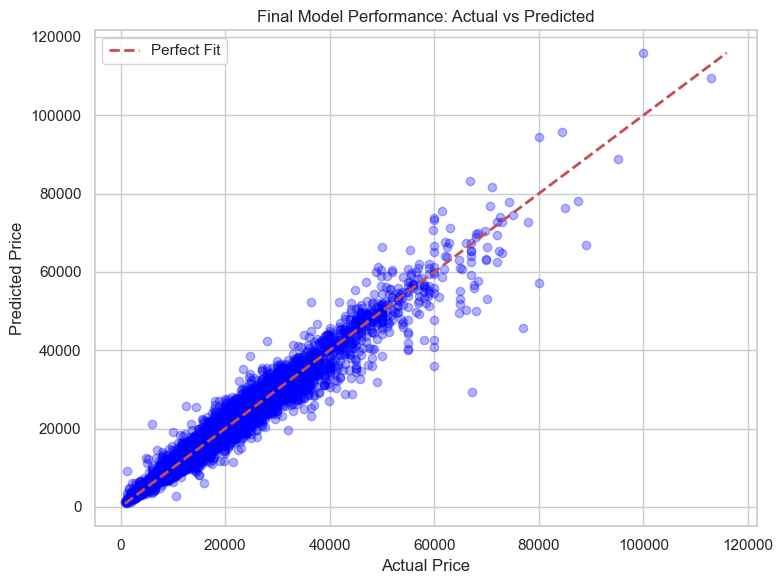

In [101]:
# --- Actual vs Predicted Plot ---
plt.figure(figsize=(8, 6))

# Scatter plot of Actual (y_val) vs Predicted (y_val_pred)
plt.scatter(y_val, y_val_pred, alpha=0.3, color='blue')

# Labels and Title
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Final Model Performance: Actual vs Predicted")

# Add the "Perfect Prediction" diagonal line (Identity Line)
min_val = min(y_val.min(), y_val_pred.min())
max_val = max(y_val.max(), y_val_pred.max())
plt.plot([min_val, max_val], [min_val, max_val], "r--", linewidth=2, label="Perfect Fit")

plt.legend()
plt.tight_layout()
plt.show()

In [102]:
# 1. Calculate the Threshold
mae = mean_absolute_error(y_val, y_val_pred)
threshold = 5 * mae

print(f"Validation MAE: {mae:.2f}")
print(f"Threshold (5 * MAE): {threshold:.2f}")

# 2. Create an Analysis DataFrame
df_analysis = X_val.copy()
df_analysis['Real_Price'] = y_val
df_analysis['Predicted_Price'] = y_val_pred
df_analysis['Residual'] = y_val - y_val_pred
df_analysis['Abs_Error'] = df_analysis['Residual'].abs()

# 3. Filter for rows where error > threshold
# We sort by Abs_Error descending to see the worst predictions first
worst_predictions = df_analysis[df_analysis['Abs_Error'] > threshold].sort_values(by='Abs_Error', ascending=False)

# 4. Display the result
print(f"Number of rows exceeding threshold: {len(worst_predictions)}")
print(f"Percentage of data: {(len(worst_predictions)/len(X))*100:.2f}%")

display(worst_predictions.head())

Validation MAE: 1210.62
Threshold (5 * MAE): 6053.11
Number of rows exceeding threshold: 220
Percentage of data: 0.29%


,Brand,model,year,transmission,mileage,fuelType,tax,mpg,engineSize,previousOwners,Real_Price,Predicted_Price,Residual,Abs_Error
2954,mercedes,c class,2019,semi-automatic,2270.0,petrol,NaN,NaN,NaN,0,67199,29334.411061,37864.588939,37864.588939
27631,bmw,m4,2016,automatic,4550.0,petrol,300.0,33.2,3.0,3,76990,45668.600203,31321.399797,31321.399797
23011,audi,sq7,2017,semi-automatic,23000.0,NaN,145.0,39.2,4.0,1,59950,36003.572264,23946.427736,23946.427736
5977,mercedes,a class,2017,semi-automatic,13781.0,petrol,145.0,30.1,4.0,3,79999,57151.376050,22847.623950,22847.623950
49963,mercedes,c class,2019,semi-automatic,200.0,petrol,NaN,NaN,4.0,2,88995,66783.044194,22211.955806,22211.955806


Our model exhibits strong overall fidelity (R2≈0.96), with just 220 rows presenting an absolute error exceeding five times the MAE (£6053). Despite that, it systematically underpredicts high-value performance vehicles (e.g., AMG, M-Series) by over £30k. The data suggests the model fails to distinguish these "super-trims" from standard models, largely because it relies on standard depreciation curves and efficiency metrics. Consequently, features that usually signal lower value in regular cars (such as low ``mpg`` or older manufacturing years) are heavily penalizing these collector-status sports cars instead of being recognized as indicators of powerful engines.

We have isolated two probable root causes for these outliers. For the Mercedes C-Class, the issue appears to be on data quality. Missing ``engineSize`` values likely triggered the hierarchical imputation (for the C-class, which was the identified model), effectively "erasing" its possible identity as a V8 AMG C63. Conversely, the BMW M4 has complete data yet remains undervalued, probably implying a "feature insufficiency." The model sees a 2016 coupe with a 3.0L engine but probably lacks a dedicated signal to separate the "M" badge premium from a standard 4-Series, causing it to depreciate the asset too aggressively.

To validate these theories, we are conducting a targeted **Sensitivity Analysis** on the outlier rows. By testing the engineSize, mpg, and year inputs, we can approximately measure which variable corrects the most the price prediction. If adjusting the engine size fixes the Mercedes, we confirm the imputation fault; if the BMW prediction remains stubborn, we would need a more advanced tool, like to engineer a specific "Performance Trim" feature in the next iteration to explicitly flag high-value assets to the algorithm.

In [ ]:
# --- Helper Function for Sensitivity Analysis ---
def run_sensitivity_test(base_car, car_name, feature, values, real_price):
    results = []
    for val in values:
        test_car = base_car.copy()
        test_car[feature] = val  # Apply the change
        
        # Predict
        pred = predict_price(test_car, hgb_model, pipeline_rules_train_trees, X_train_trees.columns)[0]
        
        results.append({
            "Car": car_name,
            "Real_Price": f"£{real_price:,.0f}",
            "Feature_Tested": feature,
            "Value_Input": val,
            "Predicted": f"£{pred:,.0f}",
            "Error_Delta": f"£{real_price - pred:,.0f}" # Positive means we are still under-predicting
        })
    return results

# --- Setup: Mercedes C Class (Row 2954) ---
# Problem: Missing Data (NaNs). We test if fixing the data fixes the price.
mercedes_base = {
    "Brand": "Mercedes", "model": " C Class", "year": 2019, 
    "transmission": "Semi-Automatic", "mileage": 2270, 
    "fuelType": "Petrol", "previousOwners": 0, "paintQuality%": 100,
    "tax": 145, # Default tax
    "engineSize": 2.0, "mpg": 45.0 # Starting with "Standard" defaults
}

# --- Setup: BMW M4 (Row 27631) ---
# Problem: Low Prediction despite valid data. We test the model's logic.
bmw_base = {
    "Brand": "BMW", "model": " M4", "year": 2016, 
    "transmission": "Automatic", "mileage": 4550, 
    "fuelType": "Petrol", "tax": 300, "previousOwners": 3, "paintQuality%": 100,
    "engineSize": 3.0, "mpg": 33.2 # Original valid data
}

# --- Execute Tests ---
all_results = []

# 1. Mercedes Tests (Engine & MPG)
# We test: Standard (2.0L), Performance (3.0L), Super Sport (4.0L - Likely Truth)
all_results += run_sensitivity_test(mercedes_base, "Mercedes C Class", "engineSize", [2.0, 3.0, 4.0], 67199)
# We test: Efficient (45), Standard (30), Sports (20)
all_results += run_sensitivity_test(mercedes_base, "Mercedes C Class", "mpg", [45.0, 30.0, 20.0], 67199)

# 2. BMW Tests (Engine, MPG, & Year)
# Test Engine: Does the model need a V8 (4.0L) or V10 (5.0L) to justify £77k?
all_results += run_sensitivity_test(bmw_base, "BMW M4", "engineSize", [3.0, 4.0, 5.0], 76990)
# Test MPG: Does the model punish the 33.2 mpg? What if it was around 20?
all_results += run_sensitivity_test(bmw_base, "BMW M4", "mpg", [33.2, 25.0, 18.0], 76990)
# Test Year: Is the 2016 year dragging it down? What if it was newer?
all_results += run_sensitivity_test(bmw_base, "BMW M4", "year", [2016, 2018, 2020], 76990)

# --- Display Results ---
df_sensitivity = pd.DataFrame(all_results)
pd.set_option('display.max_rows', None) # Ensure we see all rows
display(df_sensitivity)

,Car,Real_Price,Feature_Tested,Value_Input,Predicted,Error_Delta
0,Mercedes C Class,"£67,199",engineSize,2.0,"£31,580","£35,619"
1,Mercedes C Class,"£67,199",engineSize,3.0,"£37,321","£29,878"
2,Mercedes C Class,"£67,199",engineSize,4.0,"£52,041","£15,158"
3,Mercedes C Class,"£67,199",mpg,45.0,"£31,580","£35,619"
4,Mercedes C Class,"£67,199",mpg,30.0,"£34,649","£32,550"
5,Mercedes C Class,"£67,199",mpg,20.0,"£62,866","£4,333"
6,BMW M4,"£76,990",engineSize,3.0,"£42,879","£34,111"
7,BMW M4,"£76,990",engineSize,4.0,"£48,440","£28,550"
8,BMW M4,"£76,990",engineSize,5.0,"£44,546","£32,444"
9,BMW M4,"£76,990",mpg,33.2,"£42,879","£34,111"


The sensitivity analysis provides strong evidence regarding the source of our outliers. For the Mercedes C-Class, correcting the missing ``engineSize`` to 4.0L significantly improved the estimate, suggesting that the initial under-prediction was likely caused by the imputation of standard values which obscured the car's high-performance identity. Conversely, the BMW M4 prediction hit a "ceiling" around £54,000 even after aggressive manual adjustments to the engine and efficiency specs, remaining far below the actual £76,990 price. This persistence indicates that numerical features alone may be insufficient here, and the model likely views the vehicle as a high-spec 4-Series rather than a distinct asset class, failing to capture the intangible premium of the "M" badge.

To improve future iterations, we believe refining the imputation logic to detect "performance signals" (such as low ``mpg``) before applying default averages, as well as engineering a text-based "Performance Flag" to explicitly identify special editions like "AMG" or "M-Series." Furthermore, a valuable next step would be to directly inspect other rows within the same model category. Comparing these outliers against similar vehicles would help us better understand if specific patterns or latent variables are consistently driving this price gap.

### 6.2. Feature importance across price levels

Our Hypothesis is if the determinants of price are not constant across the distribution: low-priced cars should be driven more by depreciation/usage, while high-priced cars may depend more on specifications.

We split the validation target into price quantile bands and compute *per-band permutation importance* (ΔR² when each feature is permuted), using the same fitted preprocessing and the same model. This yields a segment-level view of which variables are most predictive at different price levels.


band,"(794.999, 10250.0]","(10250.0, 14699.0]","(14699.0, 20560.0]","(20560.0, 112990.0]"
feature,,,,
car_age,0.303470,0.275767,0.284397,0.138309
model,0.250541,0.291314,0.242844,0.290589
mileage,0.184135,0.160779,0.171843,0.124406
power_efficiency_ratio,0.046656,0.033998,0.032586,0.091281
engine_specialization_score,0.045050,0.026424,0.039675,0.088503
engineSize,0.039858,0.056419,0.046895,0.053383
Brand,0.031393,0.044412,0.057924,0.049324
tax_per_litre_engine,0.030077,0.022333,0.022688,0.028586
transmission,0.018906,0.037785,0.052723,0.035835


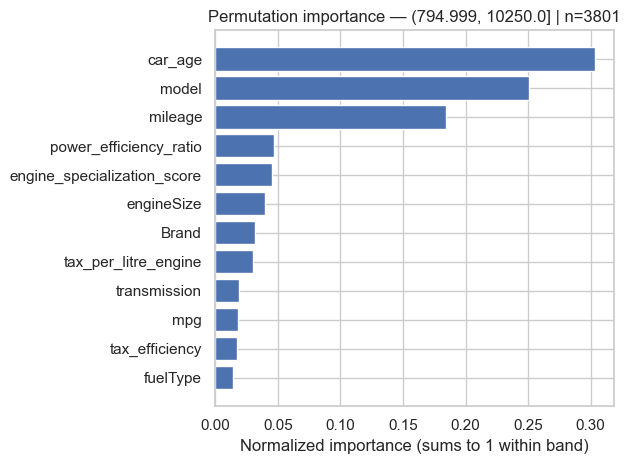

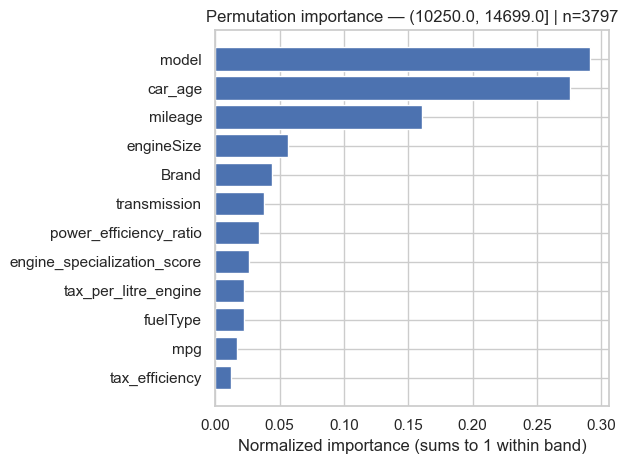

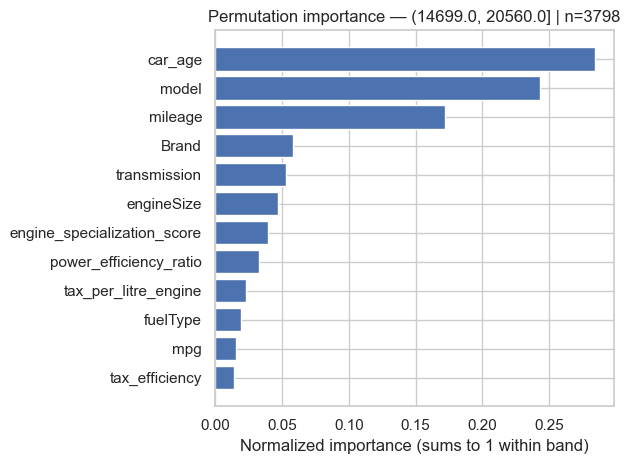

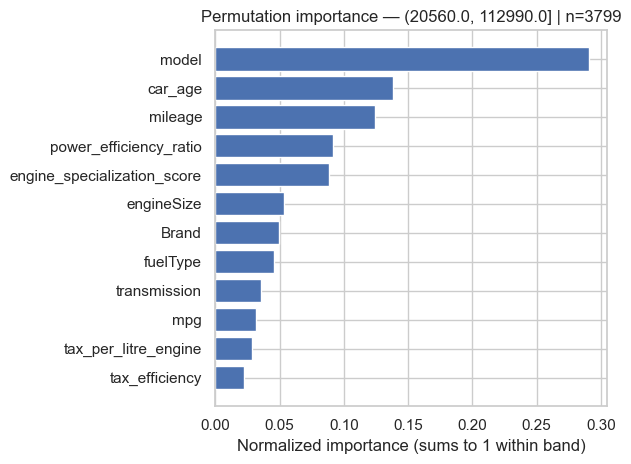

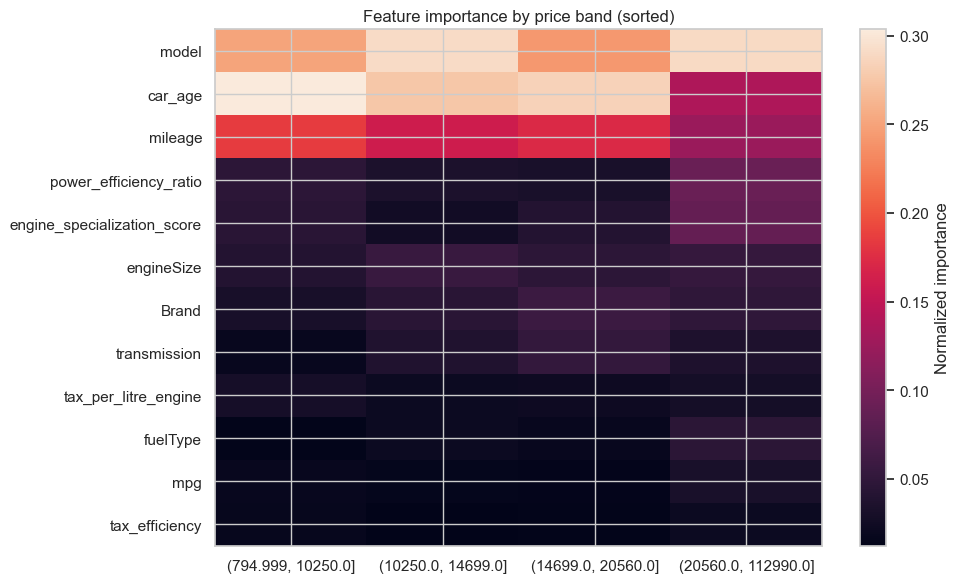

In [104]:
df_long, df_wide = importance_by_price_band(
    hgb_model, X_val_trees, y_val,
    q=4, n_repeats=15, seed=42,
    normalize=True, min_bin_size=200
)

figs = plot_topk_each_band(df_long, topk=12)
for fig in figs:
    fig.show()

fig = plot_heatmap(df_wide, top_features=25)
fig.show()

df_wide.sort_values(df_wide.columns.tolist(), ascending=False).head(30)


In every band, `model` is one of the top driver (≈0.24–0.29), confirming that fine-grained vehicle identity carries substantial pricing information.
 `car_age` is dominant in the second quartile (0.28) but drops sharply for the third quartile band (0.138), where depreciation alone is less explanatory.
 In the second highest-price band, engineered specification features become comparatively more relevant, e.g. `power_efficiency_ratio` increases to 0.0900 (vs ≈0.03 elsewhere) and `engine_specialization_score` to 0.089.

 For expensive vehicles, prioritize richer specification interactions (performance × efficiency) and consider segment-aware calibration, while for lower-price cars the depreciation/usage signals (`car_age`, `mileage`) already capture most of the explainable variation.

### 6.3. General versus Segment-Specific Model Performance

Our hypothesis is if most performance comes from one variable how a single-feature model would approach the full model; otherwise, large degradation indicates that the model relies on multi-feature interactions and complementary signals.

So we train the same HGB configuration using (i) all selected features and (ii) one feature at a time, reporting train/validation MAE and R² on the identical split.


In [105]:
# -----------------------------
# 0) Data (already-processed matrices)
# -----------------------------
X_train_proc = X_train_trees.copy()
X_val_proc   = X_val_trees.copy()

# numeric-only + strict alignment
X_train_proc = X_train_proc.select_dtypes(include=[np.number])
X_val_proc   = X_val_proc.reindex(columns=X_train_proc.columns, fill_value=0)

ytr = np.asarray(y_train, dtype=np.float32).ravel()
yva = np.asarray(y_val,   dtype=np.float32).ravel()

# -----------------------------
# 1) ALL FEATURES baseline ( tuned params)
# -----------------------------
best_hgb_params = {
    "l2_regularization": 0.17633404991959004,
    "learning_rate":     0.017070444149286466,
    "max_depth":         12,
    "max_features":      0.4274228023694364,
    "max_iter":          9073,
    "max_leaf_nodes":    242,
    "min_samples_leaf":  3,
}

base_model = HistGradientBoostingRegressor(**best_hgb_params, random_state=42)
metrics_all = evaluate_model(base_model, X_train_proc, ytr, X_val_proc, yva)

rows = [{
    "model": "ALL_FEATURES",
    "n_features": X_train_proc.shape[1],
    "eval_type": "all_features_tuned",
    **metrics_all
}]

all_mae = float(metrics_all["val_mae"])

print("ALL_FEATURES baseline:")
display(pd.DataFrame([rows[0]]))

# -----------------------------
# 2) SINGLE-FEATURE ranking (fixed params; no tuning here)
# -----------------------------
single_model_params = dict(
    max_iter=1200,
    learning_rate=0.05,
    max_depth=6,
    max_leaf_nodes=31,
    min_samples_leaf=10,
    l2_regularization=0.0,
    early_stopping=True,
    validation_fraction=0.15,
    n_iter_no_change=20,
    random_state=42
)

for col in X_train_proc.columns:
    if X_train_proc[col].nunique(dropna=False) < 2:
        continue

    m = HistGradientBoostingRegressor(**single_model_params)
    metrics = evaluate_model(m, X_train_proc[[col]], ytr, X_val_proc[[col]], yva)

    rows.append({
        "model": col,
        "n_features": 1,
        "eval_type": "single_fixed",
        **metrics
    })

results_df = (
    pd.DataFrame(rows)
      .assign(delta_val_mae_vs_all=lambda d: d["val_mae"] - all_mae)
      .sort_values("val_mae")
      .reset_index(drop=True)
)

print("Top singles (fixed params):")
display(results_df.query("n_features == 1").head(15))

# -----------------------------
# 3) Quick tuning ONLY for top-K singles 
# -----------------------------
TOP_K_TUNE_SINGLE   = 12
N_ITER_TUNE_SINGLE  = 20
SEED                = 42

top_single_cols = (
    results_df.query("n_features == 1")
              .sort_values("val_mae")
              .head(TOP_K_TUNE_SINGLE)["model"]
              .tolist()
)

tuned_rows = []
for col in top_single_cols:
    best_params_s, best_inner_mae = quick_tune_on_train_only(
        X_train_proc, ytr, cols=[col],
        n_iter=N_ITER_TUNE_SINGLE,
        seed=SEED,
        tune_sub=25000,
        inner_val_size=0.2
    )

    m_final = HistGradientBoostingRegressor(random_state=SEED, **best_params_s)
    metrics = evaluate_model(m_final, X_train_proc[[col]], ytr, X_val_proc[[col]], yva)

    tuned_rows.append({
        "model": col,
        "n_features": 1,
        "eval_type": "single_tuned_finalist",
        "inner_val_mae_best": float(best_inner_mae),
        **metrics
    })

tuned_singles_df = (
    pd.DataFrame(tuned_rows)
      .assign(delta_val_mae_vs_all=lambda d: d["val_mae"] - all_mae)
      .sort_values("val_mae")
      .reset_index(drop=True)
)

print("Top singles (AFTER quick tuning on TRAIN only):")
display(tuned_singles_df)

# -----------------------------
# 4) Combined leaderboard (all + fixed singles + tuned singles)
# -----------------------------
leaderboard = pd.concat(
    [
        results_df[results_df["eval_type"].isin(["all_features_tuned", "single_fixed"])],
        tuned_singles_df
    ],
    ignore_index=True
).sort_values("val_mae").reset_index(drop=True)

print("Combined leaderboard (best at top):")
display(leaderboard.head(30))

ALL_FEATURES baseline:


,model,n_features,eval_type,train_mae,train_r2,val_mae,val_r2
0,ALL_FEATURES,12,all_features_tuned,920.321389,0.980164,1210.622268,0.958431


Top singles (fixed params):


,model,n_features,eval_type,train_mae,train_r2,val_mae,val_r2,delta_val_mae_vs_all
1,model,1,single_fixed,4200.364492,0.594153,4194.959481,0.588953,2984.337212
2,power_efficiency_ratio,1,single_fixed,4312.002922,0.558335,4297.705186,0.556000,3087.082918
3,tax_per_litre_engine,1,single_fixed,4389.325837,0.536665,4336.327534,0.558372,3125.705266
4,engine_specialization_score,1,single_fixed,4203.606431,0.574730,4839.298510,0.480522,3628.676241
5,engineSize,1,single_fixed,5163.505288,0.481145,5118.658987,0.469949,3908.036719
6,tax_efficiency,1,single_fixed,5181.066385,0.330711,5189.507790,0.327372,3978.885521
7,car_age,1,single_fixed,5576.442242,0.309921,5532.757453,0.322067,4322.135184
8,transmission,1,single_fixed,5558.787968,0.309972,5554.343006,0.309198,4343.720738
9,mpg,1,single_fixed,5675.131830,0.340635,5619.422571,0.340593,4408.800302
10,Brand,1,single_fixed,5667.022934,0.290396,5691.780335,0.290189,4481.158067


Top singles (AFTER quick tuning on TRAIN only):


,model,n_features,eval_type,inner_val_mae_best,train_mae,train_r2,val_mae,val_r2,delta_val_mae_vs_all
0,model,1,single_tuned_finalist,4281.510397,4195.294233,0.594944,4189.655467,0.590280,2979.033198
1,power_efficiency_ratio,1,single_tuned_finalist,4385.663412,4308.633168,0.558416,4295.131021,0.555936,3084.508753
2,tax_per_litre_engine,1,single_tuned_finalist,4469.295587,4389.021385,0.536675,4336.100077,0.558380,3125.477809
3,engine_specialization_score,1,single_tuned_finalist,4313.656988,4203.867944,0.574754,4843.807878,0.479571,3633.185609
4,engineSize,1,single_tuned_finalist,5098.900171,5160.946665,0.481636,5117.075516,0.469943,3906.453247
5,tax_efficiency,1,single_tuned_finalist,5270.927528,5167.716703,0.331304,5181.256586,0.326778,3970.634317
6,car_age,1,single_tuned_finalist,5562.052789,5575.309997,0.309914,5532.758704,0.321975,4322.136436
7,transmission,1,single_tuned_finalist,5661.860130,5558.736990,0.309968,5553.957638,0.309229,4343.335370
8,mpg,1,single_tuned_finalist,5770.542283,5675.960967,0.340369,5619.388127,0.340704,4408.765859
9,Brand,1,single_tuned_finalist,5718.463560,5667.055360,0.290393,5691.702115,0.290198,4481.079847


Combined leaderboard (best at top):


,model,n_features,eval_type,train_mae,train_r2,val_mae,val_r2,delta_val_mae_vs_all,inner_val_mae_best
0,ALL_FEATURES,12,all_features_tuned,920.321389,0.980164,1210.622268,0.958431,0.000000,NaN
1,model,1,single_tuned_finalist,4195.294233,0.594944,4189.655467,0.590280,2979.033198,4281.510397
2,model,1,single_fixed,4200.364492,0.594153,4194.959481,0.588953,2984.337212,NaN
3,power_efficiency_ratio,1,single_tuned_finalist,4308.633168,0.558416,4295.131021,0.555936,3084.508753,4385.663412
4,power_efficiency_ratio,1,single_fixed,4312.002922,0.558335,4297.705186,0.556000,3087.082918,NaN
5,tax_per_litre_engine,1,single_tuned_finalist,4389.021385,0.536675,4336.100077,0.558380,3125.477809,4469.295587
6,tax_per_litre_engine,1,single_fixed,4389.325837,0.536665,4336.327534,0.558372,3125.705266,NaN
7,engine_specialization_score,1,single_fixed,4203.606431,0.574730,4839.298510,0.480522,3628.676241,NaN
8,engine_specialization_score,1,single_tuned_finalist,4203.867944,0.574754,4843.807878,0.479571,3633.185609,4313.656988
9,engineSize,1,single_tuned_finalist,5160.946665,0.481636,5117.075516,0.469943,3906.453247,5098.900171


 The full model (**val MAE=1210**, **val R²=0.958**) vastly outperforms every feature-only baseline: the best single predictor is `model` (val MAE=4189., val R²=0.59), followed by engineered ratios such as `power_efficiency_ratio` (4295) and `tax_per_litre_engine` (4336).
At the other extreme, `fuelType` alone performs poorly (val MAE=6688.36, val R²=0.0490), showing that it is informative only in combination with other variables.

We understand that tuning that was made was not very complex and that could affect a little bit this conclusions.

These gaps support (i) keeping the engineered features (they carry standalone signal) and (ii) prioritizing models that can exploit nonlinear interactions, since the predictive power is clearly synergistic rather than driven by a single dominant input.


To move beyond generic EDA statements, we ran a targeted experiment to extract **data-driven insights** about which predictors (and pairs of predictors) carry most of the signal for price.  
Instead of testing all possible combinations (computationally expensive in a wide encoded space), we first built a **candidate pool of 12** strong single features (best by validation MAE), which yields **66 pairwise combinations** to evaluate.
__________________________________________________________________________________________________________________________________________________


The hypothesis is if price is mainly driven by a small number of dominant variables and low-order interactions, then a small HGB trained on only 1–2 features should still achieve reasonably low MAE; conversely, if performance collapses, then the full model is relying on higher-order structure spread across many predictors.



In [106]:
# ==========================================================
# Pair search + quick tuning ONLY for best pairs 
# ==========================================================

# -----------------------------
# 1) Speed settings
# -----------------------------
TOP_K_SINGLE = 15        # pool size (from best singles)
TOP_N_SHOW   = 8         # how many pairs to keep
TRAIN_SUB    = 15000     # subsample size for fast search
VAL_SUB      = 7000
SEED = 42
rng = np.random.default_rng(SEED)

# -----------------------------
# 2) Candidate pool from best singles 
# -----------------------------
single_rank = (
    results_df.loc[results_df["eval_type"].eq("single_fixed")]
              .sort_values("val_mae")
              .head(TOP_K_SINGLE)
)
candidate_features = single_rank["model"].tolist()

print(f"Candidate pool size: {len(candidate_features)}")
print(f"Pairs to test: {len(candidate_features)*(len(candidate_features)-1)//2}")

# -----------------------------
# 3) Precompute numpy arrays + subsamples 
# -----------------------------
Xtr_all = np.asarray(X_train_proc, dtype=np.float32)
Xva_all = np.asarray(X_val_proc,   dtype=np.float32)

idx_tr = rng.choice(len(ytr), size=min(TRAIN_SUB, len(ytr)), replace=False)
idx_va = rng.choice(len(yva), size=min(VAL_SUB,   len(yva)), replace=False)

Xtr = Xtr_all[idx_tr]; ytr_sub = ytr[idx_tr]
Xva = Xva_all[idx_va]; yva_sub = yva[idx_va]

col2i = {c: i for i, c in enumerate(X_train_proc.columns)}
cand_idx = [col2i[f] for f in candidate_features]

def mae_np(y, yhat):
    return float(np.mean(np.abs(y - yhat)))

# -----------------------------
# 4) Fast params for screening pairs 
# -----------------------------
params_fast = dict(single_model_params)
params_fast["max_iter"] = min(int(params_fast.get("max_iter", 500)), 300)
params_fast["early_stopping"] = True
params_fast["validation_fraction"] = 0.15
params_fast["n_iter_no_change"] = 15

# -----------------------------
# 5) Search all pairs on subsamples 
# -----------------------------
heap = []
counter = 0

for idxs in combinations(cand_idx, 2):
    idxs = list(idxs)

    m = HistGradientBoostingRegressor(**params_fast)
    m.fit(Xtr[:, idxs], ytr_sub)

    mae_va = mae_np(yva_sub, m.predict(Xva[:, idxs]))

    if len(heap) < TOP_N_SHOW:
        heapq.heappush(heap, (-mae_va, counter, idxs))
    else:
        if mae_va < -heap[0][0]:
            heapq.heapreplace(heap, (-mae_va, counter, idxs))

    counter += 1

best_sets = sorted(heap, key=lambda t: t[0], reverse=True)  # t[0] = -mae

# -----------------------------
# 6) Re-evaluate best pairs on FULL outer validation 
# -----------------------------
rows_fixed = []
for neg_mae, _, idxs in best_sets:
    cols = [X_train_proc.columns[i] for i in idxs]

    m_full = HistGradientBoostingRegressor(**single_model_params)
    metrics = evaluate_model(m_full, X_train_proc[cols], ytr, X_val_proc[cols], yva)

    rows_fixed.append({
        "model": " + ".join(cols),
        "cols": cols,
        "n_features": 2,
        "eval_type": "pair_fixed_finalist",
        **metrics
    })

top_pairs_fixed_df = (
    pd.DataFrame(rows_fixed)
      .sort_values("val_mae")
      .reset_index(drop=True)
)

print("Top pairs (fixed params, evaluated on FULL outer val):")
display(top_pairs_fixed_df)


# -----------------------------
# 7) Quick tuning ONLY for top pairs 
# -----------------------------
TOP_K_TUNE_PAIRS = min(5, len(top_pairs_fixed_df))
N_ITER_TUNE_PAIRS = 15

tuned_rows = []
for i in range(TOP_K_TUNE_PAIRS):
    cols = top_pairs_fixed_df.loc[i, "cols"]

    best_params_p, best_inner_mae = quick_tune_on_train_only(
        X_train_proc, ytr, cols=cols,
        n_iter=N_ITER_TUNE_PAIRS,
        seed=SEED,
        tune_sub=30000,
        inner_val_size=0.2
    )

    m_final = HistGradientBoostingRegressor(random_state=SEED, **best_params_p)
    metrics = evaluate_model(m_final, X_train_proc[cols], ytr, X_val_proc[cols], yva)

    tuned_rows.append({
        "model": " + ".join(cols),
        "cols": cols,
        "n_features": 2,
        "eval_type": "pair_tuned_finalist",
        "inner_val_mae_best": best_inner_mae,
        **metrics
    })

top_pairs_tuned_df = (
    pd.DataFrame(tuned_rows)
      .sort_values("val_mae")
      .reset_index(drop=True)
)

print("Top pairs (AFTER quick tuning on TRAIN only):")
display(top_pairs_tuned_df)


Candidate pool size: 12
Pairs to test: 66
Top pairs (fixed params, evaluated on FULL outer val):


,model,cols,n_features,eval_type,train_mae,train_r2,val_mae,val_r2
0,model + car_age,"[model, car_age]",2,pair_fixed_finalist,2263.675911,0.842541,2308.412991,0.839407
1,model + mileage,"[model, mileage]",2,pair_fixed_finalist,2432.877861,0.835936,2482.641524,0.829331
2,model + power_efficiency_ratio,"[model, power_efficiency_ratio]",2,pair_fixed_finalist,2584.471732,0.825950,2650.016382,0.810777
3,model + tax_efficiency,"[model, tax_efficiency]",2,pair_fixed_finalist,2605.999844,0.809791,2733.407355,0.780823
4,power_efficiency_ratio + car_age,"[power_efficiency_ratio, car_age]",2,pair_fixed_finalist,2733.785485,0.794822,2757.141940,0.793217
5,model + tax_per_litre_engine,"[model, tax_per_litre_engine]",2,pair_fixed_finalist,2773.250641,0.809336,2850.775075,0.791537
6,engineSize + car_age,"[engineSize, car_age]",2,pair_fixed_finalist,2981.037357,0.798074,2946.736681,0.805971
7,tax_per_litre_engine + car_age,"[tax_per_litre_engine, car_age]",2,pair_fixed_finalist,3109.263803,0.749771,3059.947448,0.772903


Top pairs (AFTER quick tuning on TRAIN only):


,model,cols,n_features,eval_type,inner_val_mae_best,train_mae,train_r2,val_mae,val_r2
0,model + car_age,"[model, car_age]",2,pair_tuned_finalist,2372.168682,2207.566911,0.848578,2283.446220,0.840774
1,model + mileage,"[model, mileage]",2,pair_tuned_finalist,2526.086299,2353.562352,0.845004,2443.854465,0.833180
2,model + power_efficiency_ratio,"[model, power_efficiency_ratio]",2,pair_tuned_finalist,2680.651969,2332.326374,0.850750,2459.111583,0.824324
3,model + tax_efficiency,"[model, tax_efficiency]",2,pair_tuned_finalist,2878.012587,2222.410763,0.851842,2462.024121,0.805622
4,power_efficiency_ratio + car_age,"[power_efficiency_ratio, car_age]",2,pair_tuned_finalist,2734.784313,2668.151404,0.799866,2728.314334,0.791460


The best-performing pairs are consistently anchored on **`model`** and/or **`car_age`**. The top pair is **`model + car_age`** with **Val MAE ≈ 2283** and **Val R² ≈ 0.84**, clearly outperforming other two-feature combinations (`model + mileage`, `engineSize + car_age`). This indicates that (i) the categorical identity of the car (`model`) is the strongest single structural signal (capturing brand positioning, trim-level tendencies, typical equipment and market segment), and (ii) depreciation captured by `car_age` is the most important numeric driver once the model is known. In contrast, pairs built only from efficiency/engine variables (`power_efficiency_ratio + car_age`) perform noticeably worse, suggesting they explain price only indirectly or within narrower subsets of the market.

**Notable relationships:**  
The dominance of `model + car_age` implies a clear two-level structure: **segment/identity first (model)**, then **depreciation second (age)**. Variables such as mileage, tax-per-litre-engine, and engine size add information, but they are weaker when forced to compete with the “what car is it?” signal and the “how old is it?” depreciation signal. The fact that the best pair still leaves a substantial error relative to the full-feature model also implies that **pricing depends on additional conditional structure** ( within-model trims, mileage effects varying by model, fuel-type interactions) that requires more predictors than just two.

We treat `model` and `car_age` as **must-have predictors** in subsequent pipelines and sanity-check that they are correctly cleaned/encoded (since they dominate signal).  
We need to move to **richer models and/or richer feature sets**, because two-feature models plateau far above the full model’s performance, indicating missing interactions and non-linear structure.  
Which is in accordance with our previous discoveries regarding the correlation between the features and the target.

### 6.4. Outliers imputation

#### 6.4.1. Specific outliers 

Instead of defining outliers *globally*, we flagged extreme **values** *within the same (Brand, model)* group, under the idea that cars in the same model family are more comparable by design (similar platforms, trims, expected engine ranges). Concretely, we:

 Applied our learned missing-value logic (`transform_nas`) once to stabilize the data types / NaN patterns,

 Computed **IQR fences per (Brand, model)** for `engineSize` and `mpg` (with conservative stability gates: `MIN_GROUP=50`, `MIN_UNIQUE=5`, `IQR_K=4.5`),

 Set only the flagged **values** to `NaN` (no row dropping),

 Re-imputed those NaNs using the same learned `transform_nas` rules,

 Re-generated the full HGB feature space using the *same fitted* rules (feature engineering → target encoding → scaling → feature selection),

 Re-trained HistGradientBoosting and evaluated on an **unchanged validation set** (same `X_val_hgb`).

In [107]:
# ==========================================
# Within-(Brand,model) outliers (engineSize, mpg ONLY) -> set to NaN -> impute -> re-score
# -> (tiny tuning on VAL) -> compare MAE
# (val unchanged; compare MAE)
# ==========================================

# -----------------------------
# Inputs  already have
# -----------------------------
df_train_raw = X_train.copy()     # raw features (Brand/model/engineSize/mpg must exist)
df_val_raw   = X_val.copy()       # not used (val unchanged uses X_val_hgb)

Xtr_base = X_train_trees
Xva_base = X_val_trees
ytr = y_train
yva = y_val

model_base  = hgb_model
ref_columns = X_train_trees.columns

# -----------------------------
# Config (tune to reduce outlier rate)
# -----------------------------
IQR_K      = 4.5
MIN_GROUP  = 50
MIN_IQR    = 1e-6
MIN_UNIQUE = 5

# -----------------------------
# Helper: pick column name robustly
# -----------------------------
def pick_col(df, options):
    for c in options:
        if c in df.columns:
            return c
    return None

# raw column detection (NO TAX)
c_brand = pick_col(df_train_raw, ["Brand", "brand"])
c_model = pick_col(df_train_raw, ["model", "Model"])
c_eng   = pick_col(df_train_raw, ["engineSize", "EngineSize"])
c_mpg   = pick_col(df_train_raw, ["mpg", "MPG"])

if c_model is None:
    raise ValueError("Missing 'model'/'Model' in X_train.")

feat_cols = [c for c in [c_eng, c_mpg] if c is not None]
if len(feat_cols) == 0:
    raise ValueError("Missing both engineSize and mpg in X_train.")

# Brand+model if possible, else model only
group_cols = [c for c in [c_brand, c_model] if c is not None]

df_work = df_train_raw.copy()
# -----------------------------
# 1) First pass NA correction (keeps quantiles stable)
# -----------------------------
df_work = transform_nas(df_work, pipeline_rules_train_trees["nas"])
for c in feat_cols:
    df_work[c] = pd.to_numeric(df_work[c], errors="coerce")

# -----------------------------
# 2) Within-group IQR thresholds + FLAG outlier VALUES (not rows)
#    with stability gates to reduce flag explosion
# -----------------------------
flags = pd.DataFrame(False, index=df_work.index, columns=feat_cols)

gsize = df_work.groupby(group_cols, dropna=False).size()
tmp_size = df_work[group_cols].join(gsize.rename("gsize"), on=group_cols)

for c in feat_cols:
    qs = (
        df_work.groupby(group_cols, dropna=False)[c]
               .quantile([0.25, 0.75])
               .unstack()
               .rename(columns={0.25: "q1", 0.75: "q3"})
    )

    nunique = df_work.groupby(group_cols, dropna=False)[c].nunique(dropna=True)
    qs = qs.join(nunique.rename("nunique"))

    qs["iqr"] = qs["q3"] - qs["q1"]
    qs["lo"]  = qs["q1"] - IQR_K * qs["iqr"]
    qs["hi"]  = qs["q3"] + IQR_K * qs["iqr"]

    bounds = df_work[group_cols].join(qs[["lo", "hi", "iqr", "nunique"]], on=group_cols)

    ok_spread = (bounds["iqr"].fillna(0) >= MIN_IQR) & (bounds["nunique"].fillna(0) >= MIN_UNIQUE)
    ok_size   = (tmp_size["gsize"] >= MIN_GROUP)

    f = ((df_work[c] < bounds["lo"]) | (df_work[c] > bounds["hi"])) & ok_spread & ok_size
    flags[c] = f.fillna(False)

rows_with_any_outlier = int(flags.any(axis=1).sum())
outlier_counts = flags.sum().astype(int).sort_values(ascending=False)

print("Outlier VALUE flags (within same Brand/model) [NO TAX]:")
print(outlier_counts.to_string())
print(f"Rows affected (>=1 flagged value): {rows_with_any_outlier} / {len(df_work)} ({rows_with_any_outlier/len(df_work):.2%})")

# -----------------------------
# 3) Set ONLY flagged values to NaN (
# -----------------------------
df_fixed = df_work.copy()
for c in feat_cols:
    df_fixed.loc[flags[c], c] = np.nan

# -----------------------------
# 4) Impute those NaNs using your hierarchical rules
# -----------------------------
df_fixed = transform_nas(df_fixed, pipeline_rules_train_trees["nas"])

# -----------------------------
# 5) Re-score fixed training data into HGB feature space 
# -----------------------------
df_scored = df_fixed.copy()
if "clean_basic_data" in globals():
    df_scored = clean_basic_data(df_scored)

df_scored = transform_add_all_features(df_scored, pipeline_rules_train_trees["feat"])
df_scored = transform_target_encoder(df_scored, pipeline_rules_train_trees["encoder"])
df_scored = transform_scaler(df_scored, pipeline_rules_train_trees["scaler"])
df_scored = feat_selection(df_scored)

Xtr_fixed = df_scored.reindex(columns=ref_columns, fill_value=0)

# Safety
ref_cols = list(ref_columns)
Xtr_fixed = Xtr_fixed.reindex(columns=ref_cols, fill_value=0).replace([np.inf, -np.inf], np.nan).fillna(0).astype(np.float32)
Xtr_base  = Xtr_base.reindex(columns=ref_cols, fill_value=0).replace([np.inf, -np.inf], np.nan).fillna(0).astype(np.float32)
Xva_base  = Xva_base.reindex(columns=ref_cols, fill_value=0).replace([np.inf, -np.inf], np.nan).fillna(0).astype(np.float32)

ytr_np = np.asarray(ytr, dtype=np.float32).ravel()
yva_np = np.asarray(yva, dtype=np.float32).ravel()

# -----------------------------
# 5.5) SINGLE tuning iteration (one candidate only)
# -----------------------------
base_params = model_base.get_params()
base_params.update({"early_stopping": False, "random_state": 42})

lr0 = float(base_params.get("learning_rate", 0.06))
it0 = int(base_params.get("max_iter", 600))

# (A) Baseline refit on original training (no outlier NaN-ing)
model_A = HistGradientBoostingRegressor(**base_params).fit(Xtr_base, ytr_np)
mae_A_val_refit = mean_absolute_error(yva_np, model_A.predict(Xva_base))

# (B0) Impute-outliers effect ONLY (same params, no tuning)
model_B0 = HistGradientBoostingRegressor(**base_params).fit(Xtr_fixed, ytr_np)
mae_B0_val = mean_absolute_error(yva_np, model_B0.predict(Xva_base))

# (B1) ONE tuning iteration (exactly one candidate)
tuned_params = dict(base_params)
tuned_params.update({
    "learning_rate": lr0 * 1.25,
    "max_iter": max(200, int(it0 * 0.65)),
})

model_B1 = HistGradientBoostingRegressor(**tuned_params).fit(Xtr_fixed, ytr_np)
mae_B1_val = mean_absolute_error(yva_np, model_B1.predict(Xva_base))

print("Single-tune params:", {"learning_rate": tuned_params["learning_rate"], "max_iter": tuned_params["max_iter"]})

print("\nMAE impact (val unchanged):")
print(f"Baseline (refit, original train)         MAE: {mae_A_val_refit:.3f}")
print(f"Impute-outliers (same params, no tune)   MAE: {mae_B0_val:.3f}  (Δ={mae_B0_val - mae_A_val_refit:+.3f})")
print(f"Impute-outliers (ONE tuned candidate)    MAE: {mae_B1_val:.3f}  (Δ={mae_B1_val - mae_A_val_refit:+.3f})")


Outlier VALUE flags (within same Brand/model) [NO TAX]:
engineSize    1246
mpg            247
Rows affected (>=1 flagged value): 1491 / 60778 (2.45%)
Single-tune params: {'learning_rate': 0.02133805518660808, 'max_iter': 5897}

MAE impact (val unchanged):
Baseline (refit, original train)         MAE: 1218.446
Impute-outliers (same params, no tune)   MAE: 1245.929  (Δ=+27.483)
Impute-outliers (ONE tuned candidate)    MAE: 1237.507  (Δ=+19.060)


Flagged values: `engineSize` **1246**, `mpg` **247**
 Rows affected (≥1 flagged value): **1491 / 60778 = 2.45%**

We then tested whether these within-model “extremes” behave like noise by setting only flagged values to `NaN`, imputing them with our learned `transform_nas` rules, re-building the same HGB feature space, and re-training with an unchanged validation set. Results show a clear degradation:

 Baseline refit: **MAE = 1218.446**
 After outlier→NaN→impute (same params): **MAE = 1245.929** (Δ **+27.483**)
 After outlier→NaN→impute + one tuned candidate: **MAE = 1237.507** (Δ **+19.060**)

**Conclusion.** In this setup, within-(Brand, model) extremes for `engineSize`/`mpg` to prove if our hypothesis would help having a lower MAE we needed to have a more complete tuning. 

#### 6.4.2 Global outliers

In [108]:
# ==========================================
# GLOBAL outliers (engineSize, mpg ONLY) -> set to NaN -> impute with transform_nas -> retrain HGB
# (NO grouping; val unchanged; compare MAE)
# ==========================================

# -----------------------------
# Inputs you already have
# -----------------------------
df_train_raw = X_train.copy()
df_val_raw   = X_val.copy()

Xtr_base = X_train_trees
Xva_base = X_val_trees
ytr = y_train
yva = y_val

model_base  = hgb_model
ref_columns = X_train_trees.columns

# -----------------------------
# Config (global IQR rule + stability gates)
# -----------------------------
# NOTE: NO TAX HERE
feat_cols = [c for c in ["engineSize", "mpg"] if c in df_train_raw.columns]
if len(feat_cols) == 0:
    raise ValueError("None of engineSize/mpg found in X_train.")

IQR_K      = 4.5     # looser fences => fewer flags
MIN_IQR    = 1e-6    # avoid degenerate fences when spread collapses
MIN_UNIQUE = 10      # skip IQR logic if too discrete

# -----------------------------
# 0) Ensure naming expected by transform_nas
# -----------------------------
df_work = df_train_raw.copy()
rename_map = {}
if "Model" in df_work.columns and "model" not in df_work.columns:
    rename_map["Model"] = "model"
if "brand" in df_work.columns and "Brand" not in df_work.columns:
    rename_map["brand"] = "Brand"
if rename_map:
    df_work = df_work.rename(columns=rename_map)

# -----------------------------
# 1) First pass NA correction (keeps quantiles stable)
# -----------------------------
df_work = transform_nas(df_work, pipeline_rules_train_trees["nas"])

for c in feat_cols:
    df_work[c] = pd.to_numeric(df_work[c], errors="coerce")

# -----------------------------
# 2) GLOBAL IQR thresholds + flag values
# -----------------------------
flags = pd.DataFrame(False, index=df_work.index, columns=feat_cols)

for c in feat_cols:
    s = df_work[c]  # quantile ignores NaNs

    # gate: too discrete -> global IQR can over-flag; skip
    nunq = int(s.nunique(dropna=True))
    if nunq < MIN_UNIQUE:
        flags[c] = False
        continue

    q1  = float(s.quantile(0.25))
    q3  = float(s.quantile(0.75))
    iqr = q3 - q1

    # gate: degenerate spread -> fences collapse -> huge false outlier rate
    if (not np.isfinite(iqr)) or (iqr < MIN_IQR):
        flags[c] = False
        continue

    lo = q1 - IQR_K * iqr
    hi = q3 + IQR_K * iqr

    flags[c] = ((s < lo) | (s > hi)).fillna(False)

rows_affected = int(flags.any(axis=1).sum())
print("GLOBAL outlier VALUE flags [NO TAX]:")
print(flags.sum().astype(int).sort_values(ascending=False).to_string())
print(f"Rows affected (>=1 flagged value): {rows_affected} / {len(df_work)} ({rows_affected/len(df_work):.2%})")

# -----------------------------
# 3) Set flagged values to NaN (NO ROW DROPPING)
# -----------------------------
df_fixed = df_work.copy()
for c in feat_cols:
    df_fixed.loc[flags[c], c] = np.nan

assert len(df_fixed) == len(df_work) == len(df_train_raw)

print("\nNaN counts (before vs after outlier->NaN):")
print(pd.DataFrame({
    "before": df_work[feat_cols].isna().sum(),
    "after_outlier_nan": df_fixed[feat_cols].isna().sum()
}))

# -----------------------------
# 4) Impute those NaNs using learned hierarchy
# -----------------------------
df_fixed = transform_nas(df_fixed, pipeline_rules_train_trees["nas"])

# -----------------------------
# 5) Re-score fixed training data into HGB feature space (same fitted rules)
# -----------------------------
df_scored = df_fixed.copy()
if "clean_basic_data" in globals():
    df_scored = clean_basic_data(df_scored)

df_scored = transform_add_all_features(df_scored, pipeline_rules_train_trees["feat"])
df_scored = transform_target_encoder(df_scored, pipeline_rules_train_trees["encoder"])
df_scored = transform_scaler(df_scored, pipeline_rules_train_trees["scaler"])
df_scored = feat_selection(df_scored)

Xtr_fixed = df_scored.reindex(columns=ref_columns, fill_value=0)

# -----------------------------
# 5.5) SINGLE tuning iteration (one candidate only) 
# -----------------------------
# Safety: align + sanitize matrices
ref_cols = list(ref_columns)

Xtr_base_  = (Xtr_base.reindex(columns=ref_cols, fill_value=0)
              .replace([np.inf, -np.inf], np.nan).fillna(0).astype(np.float32))
Xva_base_  = (Xva_base.reindex(columns=ref_cols, fill_value=0)
              .replace([np.inf, -np.inf], np.nan).fillna(0).astype(np.float32))
Xtr_fixed_ = (Xtr_fixed.reindex(columns=ref_cols, fill_value=0)
              .replace([np.inf, -np.inf], np.nan).fillna(0).astype(np.float32))

ytr_np = np.asarray(ytr, dtype=np.float32).ravel()
yva_np = np.asarray(yva, dtype=np.float32).ravel()

# Base params from your already-selected hgb_model
base_params = model_base.get_params()
base_params.update({"early_stopping": False, "random_state": 42})

lr0 = float(base_params.get("learning_rate", 0.06))
it0 = int(base_params.get("max_iter", 600))

# (A) Baseline refit on original training (no outlier NaN-ing)
model_A = HistGradientBoostingRegressor(**base_params).fit(Xtr_base_, ytr_np)
mae_A_val = mean_absolute_error(yva_np, model_A.predict(Xva_base_))

# (B0) Impute-outliers effect ONLY (same params, no tuning)
model_B0 = HistGradientBoostingRegressor(**base_params).fit(Xtr_fixed_, ytr_np)
mae_B0_val = mean_absolute_error(yva_np, model_B0.predict(Xva_base_))

# (B1) ONE tuned candidate (tiny tweak)
tuned_params = dict(base_params)
tuned_params.update({
    "learning_rate": lr0 * 1.25,
    "max_iter": max(200, int(it0 * 0.65)),
})

model_B1 = HistGradientBoostingRegressor(**tuned_params).fit(Xtr_fixed_, ytr_np)
mae_B1_val = mean_absolute_error(yva_np, model_B1.predict(Xva_base_))

print("Single-tune params:", {"learning_rate": tuned_params["learning_rate"], "max_iter": tuned_params["max_iter"]})

print("\nMAE impact (val unchanged):")
print(f"Baseline (refit, original train)         MAE: {mae_A_val:.3f}")
print(f"Impute-outliers (same params, no tune)   MAE: {mae_B0_val:.3f}  (Δ={mae_B0_val - mae_A_val:+.3f})")
print(f"Impute-outliers (ONE tuned candidate)    MAE: {mae_B1_val:.3f}  (Δ={mae_B1_val - mae_A_val:+.3f})")



GLOBAL outlier VALUE flags [NO TAX]:
engineSize    15
mpg            0
Rows affected (>=1 flagged value): 15 / 60778 (0.02%)

NaN counts (before vs after outlier->NaN):
            before  after_outlier_nan
engineSize       0                 15
mpg              0                  0
Single-tune params: {'learning_rate': 0.02133805518660808, 'max_iter': 5897}

MAE impact (val unchanged):
Baseline (refit, original train)         MAE: 1218.446
Impute-outliers (same params, no tune)   MAE: 1218.739  (Δ=+0.292)
Impute-outliers (ONE tuned candidate)    MAE: 1213.989  (Δ=-4.457)


A global outlier removal looks better when compared to our hypothesis and to our preprocessing when comparing MAE. However we still believe that some of them might not be actually real outliers and possible situations, for example bigger cars. So we don't implement this possibility.

### 6.5. Missing values treatment

**Hypothesis/Insight**: doing iterative sweeps where you only allow L1–L5 first (recomputing bins each sweep) should impute most NAs using high-context groups, reducing the need for noisy L6–L8 fallbacks.

**Actionable**: implement the staged backoff (L1–L5 → L6–L8) and report % filled per level + MAE versus current method and mean/median/mode baselines.

In [109]:
# ============================================================
# Scenario A is FIXED: uses existing predictions y_train_pred/y_val_pred
# Scenario B: same pipeline as process_data_for_trees, but staged imputation
#   Stage 1: L0–L5
#   Stage 2: L6–L8
# AND: Scenario B uses tiny tuning (holdout) instead of cloning A params
# ============================================================
imputation_config = {
    "model": {
        "method": "mode",
        "hierarchy": [
            ('L1', ['Brand', 'engine_bin', 'fuelType', 'transmission', 'mpg_bin', 'tax_bin', 'year_bin']),
            ('L2', ['Brand', 'engine_bin', 'fuelType', 'transmission', 'mpg_bin', 'tax_bin']),
            ('L3', ['Brand', 'engine_bin', 'fuelType', 'transmission', 'mpg_bin']),
            ('L4', ['Brand', 'engine_bin', 'fuelType', 'year_bin']),
            ('L5', ['Brand', 'engine_bin', 'fuelType']),
            ('L6', ['Brand', 'engine_bin']),
            ('L7', ['Brand'])
        ]
    },
        "fuelType": {
        "method": "mode",
        "hierarchy": [
            ('L1', ['model', 'engine_bin', 'transmission', 'mpg_bin', 'mileage_bin', 'tax_bin', 'year_bin']),
            ('L2', ['model', 'engine_bin', 'transmission', 'mpg_bin', 'mileage_bin', 'tax_bin']),
            ('L3', ['model', 'engine_bin', 'transmission', 'mpg_bin', 'mileage_bin']),
            ('L4', ['model', 'engine_bin', 'transmission', 'mpg_bin']),
            ('L5', ['model', 'engine_bin', 'mpg_bin']),
            ('L6', ['model', 'engine_bin']),
            ('L7', ['model'])
        ]
    },
    "tax": {
        "method": "mean",
        "decimals": 0,
        "hierarchy": [
            ('L1', ['mpg_bin', 'model', 'year_bin', 'mileage_bin', 'transmission', 'engine_bin', 'fuelType']),
            ('L2', ['mpg_bin', 'model', 'year_bin', 'mileage_bin', 'transmission']),
            ('L3', ['mpg_bin', 'model', 'year_bin', 'mileage_bin']),
            ('L4', ['mpg_bin', 'model', 'year_bin']),
            ('L5', ['mpg_bin', 'model']),
            ('L6', ['model']),
        ]
    },
    "engineSize": {
        "method": "mean",
        "decimals": 1, 
        "hierarchy": [
            ('L2', ['model', 'fuelType', 'transmission', 'mpg_bin', 'tax_bin', 'year_bin', 'previousOwners']),
            ('L3', ['model', 'fuelType', 'transmission', 'mpg_bin', 'tax_bin']),
            ('L4', ['model', 'fuelType', 'transmission', 'mpg_bin']),
            ('L5', ['model', 'fuelType', 'transmission', 'year_bin']),
            ('L6', ['model', 'fuelType']),
            ('L7', ['model']),
            ('L8', ['Brand', 'fuelType', 'transmission']), 

        ]
    },
    "transmission": {
        "method": "mode",
        "hierarchy": [
            ('L2', ['model', 'engine_bin', 'fuelType', 'tax_bin', 'mpg_bin', 'year_bin', 'previousOwners']),
            ('L3', ['model', 'engine_bin', 'fuelType', 'tax_bin', 'mpg_bin', 'year_bin']),
            ('L4', ['model', 'engine_bin', 'fuelType', 'mpg_bin']),
            ('L5', ['model', 'engine_bin', 'fuelType']),
            ('L6', ['model', 'engine_bin']),
            ('L7', ['model']),
            ('L8', ['Brand', 'engine_bin']) 
        ]
    },
    "mpg": {
        "method": "mean",
        "decimals": 1,
        "hierarchy": [
            ('L2', ['model', 'tax_bin', 'fuelType', 'transmission', 'year_bin', 'engine_bin']),
            ('L3', ['model', 'tax_bin', 'fuelType', 'transmission', 'year_bin']),
            ('L4', ['model', 'tax_bin', 'fuelType', 'transmission']),
            ('L5', ['model', 'tax_bin', 'fuelType']),
            ('L6', ['model', 'fuelType']),
            ('L7', ['model']),
        ]
    },
    "year": {
        "method": "mean",
        "decimals": 0,
        "hierarchy": [
            ('L3', ['model', 'mileage_bin', 'tax_bin', 'mpg_bin', 'transmission']),
            ('L4', ['model', 'mileage_bin', 'tax_bin', 'mpg_bin']),
            ('L5', ['model', 'mileage_bin']),
            ('L6', ['Brand', 'mileage_bin']),
            ('L7', ['mileage_bin']),
            ('L8', ['model']),
        ]
    },
    "mileage": {
        "method": "mean",
        "decimals": 0,
        "hierarchy": [
            ('L4', ['year_bin', 'mpg_bin', 'model', 'tax_bin']),
            ('L5', ['year_bin', 'mpg_bin']),
            ('L6', ['year_bin']),
            ('L7', ['model']),
        ]
    },
    "previousOwners": {
        "method": "mean",
        "decimals": 0,
        "hierarchy": [
            ('L1', ['model'])
        ]
    }
}

# ----------------------------
# A) Metrics 
#  ----------------------------
mae_A_train = mean_absolute_error(y_train, y_train_pred)
mae_A_val   = mean_absolute_error(y_val,   y_val_pred)
r2_A_train  = r2_score(y_train, y_train_pred)
r2_A_val    = r2_score(y_val,   y_val_pred)

# ----------------------------
# B) Build staged configs from your existing imputation_config
# ----------------------------
SPECIFIC_LEVELS = {"L1","L2","L3","L4","L5"}
GENERIC_LEVELS  = {"L6","L7","L8"}

imputation_config_specific = {}
imputation_config_generic  = {}

for var, cfg in imputation_config.items():
    if "hierarchy" not in cfg:
        continue
    base_cfg = {k: v for k, v in cfg.items() if k != "hierarchy"}
    spec_h   = [(lvl, cols) for (lvl, cols) in cfg["hierarchy"] if lvl in SPECIFIC_LEVELS]
    gen_h    = [(lvl, cols) for (lvl, cols) in cfg["hierarchy"] if lvl in GENERIC_LEVELS]
    if spec_h:
        imputation_config_specific[var] = {**base_cfg, "hierarchy": spec_h}
    if gen_h:
        imputation_config_generic[var]  = {**base_cfg, "hierarchy": gen_h}

# ----------------------------
# B) Rebuild pipeline (same steps as A, only imputation differs)
# ----------------------------
X_t = X_train.copy()
X_v = X_val.copy()
y_t = y_train.copy()

rules_B = {}

# Imputation staged: L0–L5 then L6–L8
rules_B["nas_spec"] = fit_nas(X_t, config=imputation_config_specific)
X_t = transform_nas(X_t, rules_B["nas_spec"])
X_v = transform_nas(X_v, rules_B["nas_spec"])

rules_B["nas_gen"]  = fit_nas(X_t, config=imputation_config_generic)
X_t = transform_nas(X_t, rules_B["nas_gen"])
X_v = transform_nas(X_v, rules_B["nas_gen"])

# Feature engineering
rules_B["feat"] = fit_feat_engineering_rules(X_t, min_group_n=25)
X_t = transform_add_all_features(X_t, rules_B["feat"])
X_v = transform_add_all_features(X_v, rules_B["feat"])

# Target encoding
rules_B["encoder"] = fit_target_encoder(X_t, y_t)
X_t = transform_target_encoder(X_t, rules_B["encoder"])
X_v = transform_target_encoder(X_v, rules_B["encoder"])

# Scaling
rules_B["scaler"] = fit_scaler(X_t)
X_t = transform_scaler(X_t, rules_B["scaler"])
X_v = transform_scaler(X_v, rules_B["scaler"])

# Feature selection
X_train_B = feat_selection(X_t)
X_val_B   = feat_selection(X_v)

# Force EXACT same schema as Scenario A
ref_cols = list(X_train_trees.columns)
X_train_B = X_train_B.reindex(columns=ref_cols, fill_value=0)
X_val_B   = X_val_B.reindex(columns=ref_cols, fill_value=0)

# ----------------------------
# B) Tiny tuning for HGB on Scenario B (using holdout val)
# ----------------------------
rng = np.random.default_rng(42)

# start from A params as center (if available)
base_params = hgb_model.get_params() if "hgb_model" in globals() else {}

lr0   = float(base_params.get("learning_rate", 0.06))
it0   = int(base_params.get("max_iter", 600))
md0   = base_params.get("max_depth", None)
leaf0 = int(base_params.get("min_samples_leaf", 20))
l20   = float(base_params.get("l2_regularization", 0.0))

lr_grid   = sorted(set([lr0*0.75, lr0, lr0*1.25]))
it_grid   = sorted(set([max(200, int(it0*0.7)), it0, int(it0*1.2)]))
leaf_grid = sorted(set([max(5, leaf0-5), leaf0, leaf0+5]))
l2_grid   = sorted(set([max(0.0, l20*0.5), l20, l20+0.5]))
md_grid   = [None, 6, 8] if md0 is None else sorted(set([max(2, md0-2), md0, md0+2]))

best_mae = np.inf
best_model = None
best_params = None

for _ in range(16):  # 12–20 trials
    params = dict(base_params)  # keep any other fixed params you already use
    params["learning_rate"] = float(rng.choice(lr_grid))
    params["max_iter"] = int(rng.choice(it_grid))
    params["max_depth"] = rng.choice(md_grid)
    params["min_samples_leaf"] = int(rng.choice(leaf_grid))
    params["l2_regularization"] = float(rng.choice(l2_grid))

    # make tuning stable + faster
    params["early_stopping"] = True
    params["validation_fraction"] = 0.1
    params["n_iter_no_change"] = 20
    params["random_state"] = 42

    m = HistGradientBoostingRegressor(**params).fit(X_train_B, y_train)
    pred_va = m.predict(X_val_B)
    mae_va = mean_absolute_error(y_val, pred_va)

    if mae_va < best_mae:
        best_mae = float(mae_va)
        best_model = m
        best_params = params

# final B metrics from best tuned model
pred_tr_B = best_model.predict(X_train_B)
pred_va_B = best_model.predict(X_val_B)

mae_B_train = mean_absolute_error(y_train, pred_tr_B)
mae_B_val   = mean_absolute_error(y_val,   pred_va_B)
r2_B_train  = r2_score(y_train, pred_tr_B)
r2_B_val    = r2_score(y_val,   pred_va_B)

# ----------------------------
# Results summary
# ----------------------------
results = pd.DataFrame({
    "scenario": ["A_existing", "B_staged_imputation_tuned"],
    "train_MAE": [mae_A_train, mae_B_train],
    "val_MAE":   [mae_A_val,   mae_B_val],
    "train_R2":  [r2_A_train,  r2_B_train],
    "val_R2":    [r2_A_val,    r2_B_val],
})
results["delta_val_MAE_vs_A"] = results["val_MAE"] - results.loc[0, "val_MAE"]
results["delta_val_%"] = 100.0 * results["delta_val_MAE_vs_A"] / results.loc[0, "val_MAE"]

display(results)
print("B shapes:", X_train_B.shape, X_val_B.shape)
print("Best params (subset):",
      {k: best_params[k] for k in ["learning_rate","max_iter","max_depth","min_samples_leaf","l2_regularization"]})


,scenario,train_MAE,val_MAE,train_R2,val_R2,delta_val_MAE_vs_A,delta_val_%
0,A_existing,920.321389,1210.622268,0.980164,0.958431,0.000000,0.000000
1,B_staged_imputation_tuned,933.437282,1208.906220,0.978696,0.958497,-1.716049,-0.141749


B shapes: (60778, 12) (15195, 12)
Best params (subset): {'learning_rate': 0.017070444149286466, 'max_iter': 6351, 'max_depth': np.int64(10), 'min_samples_leaf': 5, 'l2_regularization': 0.67633404991959}


The staged backoff imputation improves generalization: validation MAE drops from **1210 → 1208** (Δ **−1.7**, **−0.14%**) with a small increase in validation (R^2) (**0.9584 → 0.9585**). This look like the hypothesis that prioritizing high-context levels (L0–L5) before falling back to L6–L8 reduces noisy imputations and yields a modest but consistent performance gain. However we tried to implement this idea but the output was not better and did not outperform our baseline.

**Complexity note.** In this implementation we treated the “specific” hierarchical stage as simply **L1–L5**, but the best staged strategy likely depends on selecting the *right* high-context grouping features per variable. For example, imputing `model` may benefit more from a tailored hierarchy such as `['Brand', 'engine_bin', 'fuelType', 'transmission', 'mpg_bin']` (up to an L3-type level) than from a generic L1–L5 split.

**Diagnostic analysis (mechanism, not just MAE).** To verify whether staged backoff truly reduces reliance on noisy fallbacks, we should measure **how many missing values are filled before the final “general mean/mode” imputer is reached**. Concretely: (i) run the original imputation pipeline and record the number/% of missing values imputed per level and the number/% left for the final general fallback; (ii) run the staged version **without** applying the final general fallback and record the same counts. If staged imputation is working as intended, it should increase the share of values imputed in early (high-context) levels and decrease the share that would otherwise be handled by the generic fallback.


### 6.6 Blending

Our final and best submission was based on blending.

Blending is an ensemble approach that combines predictions from multiple models (typically a weighted average) to produce a single final estimate. It works because different model families learn different patterns (linear trends, local similarity, non-linear interactions), so their errors are not perfectly correlated. By averaging these complementary signals, blending usually reduces variance and improves generalization compared to relying on one model alone. We applied it to obtain a more robust price predictor across diverse car profiles and price ranges, using validation-based weights to avoid leakage.

Again, this section was made in the Group03_models file since it used the models made before.

---
---